Using device: cpu
Sequence length after convolutions: 50
DebuggableMotionPPGNet(
  (conv1): Conv1d(1, 32, kernel_size=(40,), stride=(1,))
  (bn1): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool1): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (dropout1): Dropout(p=0.1, inplace=False)
  (conv2): Conv1d(32, 32, kernel_size=(40,), stride=(1,))
  (bn2): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool2): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (dropout2): Dropout(p=0.1, inplace=False)
  (lstm1): LSTM(32, 128, batch_first=True)
  (lstm2): LSTM(128, 128, batch_first=True)
  (dense): Linear(in_features=128, out_features=1, bias=True)
)


/Users/tmagcaya/miniconda3/envs/torch/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Epoch 0/110:
  Train Loss: 14977.1809
  Val Loss: 14185.5027
  Val MAE: 116.37 BPM
  Training Batch Statistics:
    Mean Output: 13.75 BPM
    StdDev Output: 6.22 BPM
    Range: [-0.12, 20.46] BPM
Epoch 5/110:
  Train Loss: 7098.9257
  Val Loss: 7069.5199
  Val MAE: 80.13 BPM
Epoch 10/110:
  Train Loss: 2686.1064
  Val Loss: 2664.0715
  Val MAE: 46.78 BPM
Epoch 15/110:
  Train Loss: 774.7836
  Val Loss: 752.3389
  Val MAE: 23.70 BPM
Epoch 20/110:
  Train Loss: 384.6398
  Val Loss: 355.8567
  Val MAE: 15.31 BPM
Epoch 25/110:
  Train Loss: 272.2063
  Val Loss: 370.2463
  Val MAE: 15.42 BPM
  Training Batch Statistics:
    Mean Output: 129.94 BPM
    StdDev Output: 18.46 BPM
    Range: [90.00, 144.51] BPM
Epoch 30/110:
  Train Loss: 212.7803
  Val Loss: 523.5824
  Val MAE: 17.23 BPM
Epoch 35/110:
  Train Loss: 190.9296
  Val Loss: 169.2151
  Val MAE: 9.63 BPM
Epoch 40/110:
  Train Loss: 134.3204
  Val Loss: 147.7490
  Val MAE: 9.11 BPM
Epoch 45/110:
  Train Loss: 113.6573
  Val Loss: 119.

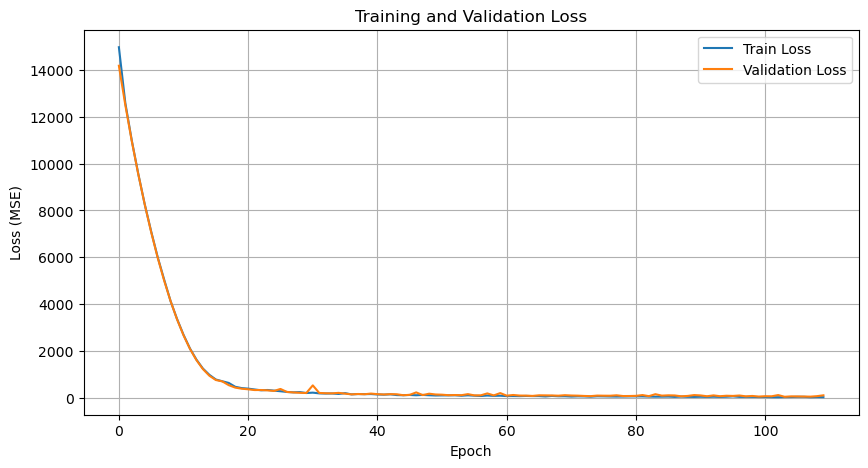

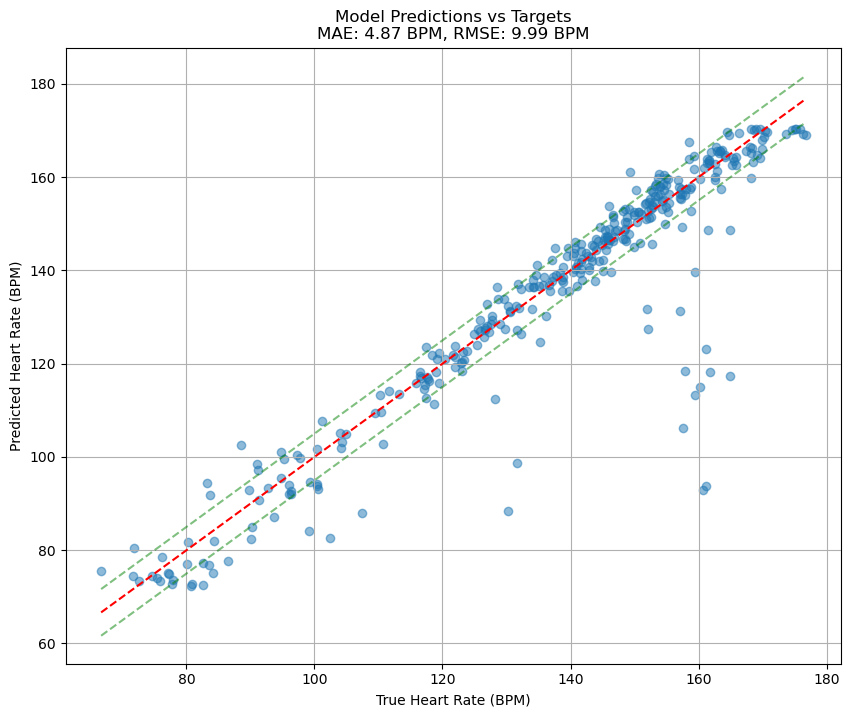

Mean Absolute Error: 4.87 BPM
Root Mean Square Error: 9.99 BPM
Predictions within ±3 BPM: 59.2%
Predictions within ±5 BPM: 76.0%


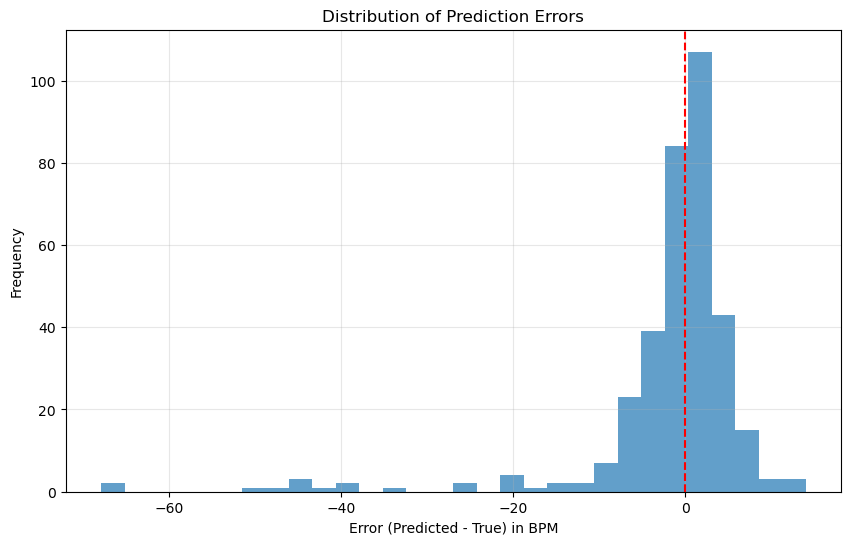

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from utils.data_utils import *
from utils.viz_utils import *

# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Training parameters
batch_size = 25
fs = 125
minBPM = 40
maxBPM = 240
window_length = 8 * fs
window_shift = 2 * fs  # Overlap = window_length - window_shift

# Retrieve dataset files
data_dir = "datasets/troika/training_data"
data_fls, ref_fls = LoadTroikaDataset(data_dir)
errs, confs = [], []

# Create the dataset
dataset = TroikaDataset(data_fls, ref_fls, window_length, window_shift, fs)

# Split the dataset into training and testing
train_size = 0.8
num_train = int(len(dataset) * train_size)
num_test = len(dataset) - num_train
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [num_train, num_test])

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Modified model with longer sequence support
class DebuggableMotionPPGNet(nn.Module):
    def __init__(self, n_timesteps, n_features, n_outputs):
        super(DebuggableMotionPPGNet, self).__init__()
        # Conv1D blocks
        self.conv1 = nn.Conv1d(in_channels=n_features, out_channels=32, kernel_size=40)
        self.bn1 = nn.BatchNorm1d(num_features=32)
        self.pool1 = nn.MaxPool1d(kernel_size=4)
        self.dropout1 = nn.Dropout(p=0.1)
        self.conv2 = nn.Conv1d(in_channels=32, out_channels=32, kernel_size=40)
        self.bn2 = nn.BatchNorm1d(num_features=32)
        self.pool2 = nn.MaxPool1d(kernel_size=4)
        self.dropout2 = nn.Dropout(p=0.1)
        
        # Calculate the sequence length after conv and pooling
        l1 = n_timesteps - 40 + 1  # Conv1 output length
        l2 = l1 // 4              # Pool1 output length
        l3 = l2 - 40 + 1          # Conv2 output length
        self.seq_len_after_conv = l3 // 4  # Pool2 output length
        print(f"Sequence length after convolutions: {self.seq_len_after_conv}")
        
        # LSTM layers
        self.lstm1 = nn.LSTM(input_size=32, hidden_size=128, batch_first=True)
        self.lstm2 = nn.LSTM(input_size=128, hidden_size=128, batch_first=True)
        
        # Final dense layer for output
        self.dense = nn.Linear(in_features=128, out_features=1)
        
        # Store activations
        self.activations = {}
        
        # Initialize weights using Xavier/Glorot (similar to TensorFlow default)
        self._initialize_weights()
    
    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv1d):
                nn.init.xavier_uniform_(m.weight)
                if m.bias is not None:
                    nn.init.zeros_(m.bias)
            elif isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                nn.init.zeros_(m.bias)
    
        
    def forward(self, x):
        # x shape: (batch_size, n_features, n_timesteps)
        
        # Convolutional layers
        x = self.conv1(x)
        x = torch.relu(self.bn1(x))
        x = self.pool1(x)
        x = self.dropout1(x)
        
        x = self.conv2(x)
        x = torch.relu(self.bn2(x))
        x = self.pool2(x)
        x = self.dropout2(x)
        
        # Reshape for LSTM: (batch_size, seq_len, features)
        x = x.permute(0, 2, 1)
        
        # LSTM layers
        x, (h1, c1) = self.lstm1(x)
        x, (h2, c2) = self.lstm2(x)
        
        # Use the final hidden state
        x = h2.squeeze(0)
        
        # Final dense layer
        x = self.dense(x)
        
        return x.squeeze(-1)  # Remove last dim if it's 1

# Training function
def train_model(model, train_loader, test_loader, criterion, optimizer, 
                epochs=100, device='cpu', monitor_every=10):
    """Train the model and monitor performance."""
    train_losses = []
    val_losses = []
    
    for epoch in range(epochs):
        # Training phase
        model.train()
        epoch_loss = 0
        all_outputs = []
        all_targets = []
        
        for ppg, acc, targets in train_loader:
            inputs, targets = ppg.to(device), targets.to(device)
            
            # Forward pass
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            
            # Store outputs and targets for analysis
            all_outputs.extend(outputs.detach().cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
            
            # Backward pass
            loss.backward()
            
            # Clip gradients to prevent explosion
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            
            optimizer.step()
            epoch_loss += loss.item()
        
        avg_train_loss = epoch_loss / len(train_loader)
        train_losses.append(avg_train_loss)
        
        # Validation phase
        model.eval()
        val_loss = 0
        val_mae = 0
        num_val_samples = 0
        
        with torch.no_grad():
            for ppg, acc, targets in test_loader:
                inputs, targets = ppg.to(device), targets.to(device)
                outputs = model(inputs)
                
                # Calculate loss
                loss = criterion(outputs, targets)
                val_loss += loss.item()
                
                # Calculate MAE
                mae = torch.abs(outputs - targets).sum().item()
                val_mae += mae
                num_val_samples += targets.size(0)
        
        avg_val_loss = val_loss / len(test_loader)
        avg_val_mae = val_mae / num_val_samples
        val_losses.append(avg_val_loss)
        
        # Print epoch results
        if epoch % monitor_every == 0 or epoch == epochs - 1:
            print(f"Epoch {epoch}/{epochs}:")
            print(f"  Train Loss: {avg_train_loss:.4f}")
            print(f"  Val Loss: {avg_val_loss:.4f}")
            print(f"  Val MAE: {avg_val_mae:.2f} BPM")
            
            # Print some sample predictions
            if epoch % (monitor_every * 5) == 0 or epoch == epochs - 1:
                all_outputs = np.array(all_outputs)
                all_targets = np.array(all_targets)
                
                # Calculate stats on outputs
                mean_output = np.mean(all_outputs)
                std_output = np.std(all_outputs)
                min_output = np.min(all_outputs)
                max_output = np.max(all_outputs)
                
                print("  Training Batch Statistics:")
                print(f"    Mean Output: {mean_output:.2f} BPM")
                print(f"    StdDev Output: {std_output:.2f} BPM")
                print(f"    Range: [{min_output:.2f}, {max_output:.2f}] BPM")
    
    # Plot loss curves
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss (MSE)')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return train_losses, val_losses

# Function to evaluate the model and visualize predictions
def evaluate_model(model, test_loader, device):
    """Evaluate the model on the test set and visualize predictions."""
    model.eval()
    
    all_preds = []
    all_targets = []
    
    with torch.no_grad():
        for ppg, acc, targets in test_loader:
            inputs, targets = ppg.to(device), targets.to(device)
            outputs = model(inputs)
            
            all_preds.extend(outputs.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
    
    # Convert to numpy arrays
    all_preds = np.array(all_preds)
    all_targets = np.array(all_targets)
    
    # Calculate metrics
    mae = np.mean(np.abs(all_preds - all_targets))
    rmse = np.sqrt(np.mean((all_preds - all_targets) ** 2))
    
    # Plot predictions vs targets
    plt.figure(figsize=(10, 8))
    plt.scatter(all_targets, all_preds, alpha=0.5)
    
    # Plot perfect prediction line
    min_val = min(np.min(all_targets), np.min(all_preds))
    max_val = max(np.max(all_targets), np.max(all_preds))
    plt.plot([min_val, max_val], [min_val, max_val], 'r--')
    
    # Plot ±5 BPM error bands
    plt.plot([min_val, max_val], [min_val + 5, max_val + 5], 'g--', alpha=0.5)
    plt.plot([min_val, max_val], [min_val - 5, max_val - 5], 'g--', alpha=0.5)
    
    plt.xlabel('True Heart Rate (BPM)')
    plt.ylabel('Predicted Heart Rate (BPM)')
    plt.title(f'Model Predictions vs Targets\nMAE: {mae:.2f} BPM, RMSE: {rmse:.2f} BPM')
    plt.grid(True)
    plt.show()
    
    # Calculate percentage within error bounds
    within_3bpm = np.mean(np.abs(all_preds - all_targets) <= 3.0) * 100
    within_5bpm = np.mean(np.abs(all_preds - all_targets) <= 5.0) * 100
    
    print(f"Mean Absolute Error: {mae:.2f} BPM")
    print(f"Root Mean Square Error: {rmse:.2f} BPM")
    print(f"Predictions within ±3 BPM: {within_3bpm:.1f}%")
    print(f"Predictions within ±5 BPM: {within_5bpm:.1f}%")
    
    # Distribution of errors
    errors = all_preds - all_targets
    plt.figure(figsize=(10, 6))
    plt.hist(errors, bins=30, alpha=0.7)
    plt.axvline(x=0, color='r', linestyle='--')
    plt.title(f'Distribution of Prediction Errors')
    plt.xlabel('Error (Predicted - True) in BPM')
    plt.ylabel('Frequency')
    plt.grid(True, alpha=0.3)
    plt.show()
    
    return mae, rmse, all_preds, all_targets


# Initialize and train model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Initialize model with the shape of your PPG signals
sample_ppg, sample_acc, _ = next(iter(train_loader))
n_timesteps = sample_ppg.shape[2]
n_features = sample_ppg.shape[1]

model = DebuggableMotionPPGNet(n_timesteps, n_features, 1)
model.to(device)

# Print model structure
print(model)

# Training parameters
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)

# Train the model
train_losses, val_losses = train_model(
    model, train_loader, test_loader, criterion, optimizer, 
    epochs=110, device=device, monitor_every=5
)

# Evaluate on test set
mae, rmse, all_preds, all_targets = evaluate_model(model, test_loader, device)


Using device: mps
LSTM input shape: [batch_size, 50, 32]
MotionPPGNet(
  (ppg_conv1): Conv1d(1, 32, kernel_size=(40,), stride=(1,))
  (ppg_bn1): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (ppg_relu1): ReLU()
  (ppg_pool1): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (ppg_dropout1): Dropout(p=0.1, inplace=False)
  (ppg_conv2): Conv1d(32, 32, kernel_size=(40,), stride=(1,))
  (ppg_bn2): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (ppg_relu2): ReLU()
  (ppg_pool2): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (ppg_dropout2): Dropout(p=0.1, inplace=False)
  (lstm1): LSTM(32, 128, batch_first=True)
  (lstm2): LSTM(128, 128, batch_first=True)
  (fc): Linear(in_features=128, out_features=1, bias=True)
)


/Users/tmagcaya/miniconda3/envs/torch/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/Users/tmagcaya/miniconda3/envs/torch/lib/python3.9/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([25])) that is different to the input size (torch.Size([25, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Outputs + Targets
tensor([[0.0771],
        [0.0437],
        [0.0360],
        [0.0677],
        [0.0758],
        [0.0791],
        [0.0532],
        [0.0248],
        [0.0259],
        [0.0585],
        [0.0673],
        [0.0641],
        [0.0700],
        [0.0078],
        [0.0188],
        [0.0746],
        [0.0777],
        [0.0733],
        [0.0924],
        [0.0788],
        [0.0665],
        [0.0824],
        [0.0703],
        [0.0502],
        [0.0474]], device='mps:0', grad_fn=<LinearBackward0>)
tensor([ 73.4494, 144.6945, 146.2622, 137.4745, 122.9508, 153.0612, 169.5371,
        158.7302, 162.1622, 157.0681,  90.1640, 157.5630, 111.3468, 161.2903,
        168.7117, 155.9252, 103.1746, 147.5410,  76.3575, 150.0000,  97.2973,
        102.5240,  87.3940, 128.4797, 148.4375], device='mps:0')
torch.Size([25, 1])
Outputs + Targets
tensor([[9.7517],
        [9.7507],
        [9.7510],
        [9.7497],
        [9.7483],
        [9.7511],
        [9.7517],
        [9.7514],
       

/Users/tmagcaya/miniconda3/envs/torch/lib/python3.9/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Outputs + Targets
tensor([[90.2001],
        [90.2001],
        [90.2001],
        [90.2001],
        [90.2001]], device='mps:0', grad_fn=<LinearBackward0>)
tensor([154.3210, 141.3613, 134.6357, 174.9735, 146.5798], device='mps:0')
torch.Size([5, 1])


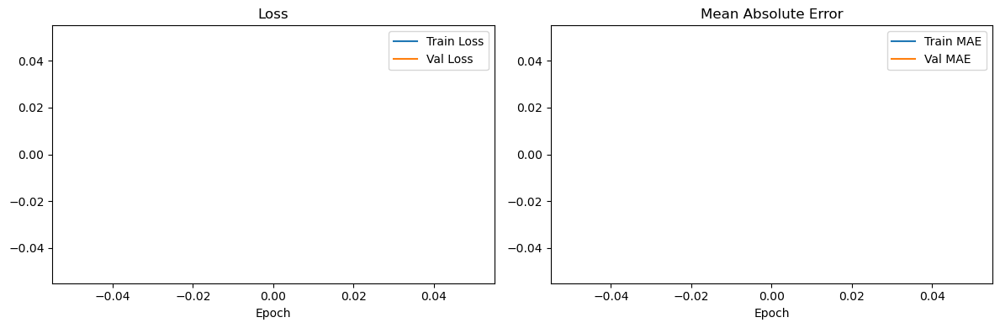

Model saved to motionppgnet_pytorch.pth
Training completed.


In [1]:
# -*- coding: utf-8 -*-
"""MotionPPGNet_PyTorch_Revised.py

PyTorch implementation of MotionPPGNet for estimating heart rate from PPG signals.
Uses the provided TroikaDataset utility.
"""

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import os
import numpy as np

# Import from your utils file
from utils.data_utils import TroikaDataset, LoadTroikaDataset

# Define constants
fs = 125
minBPM = 40
maxBPM = 240
window_length = 8 * fs
window_shift = 2 * fs
model_path = 'motionppgnet_pytorch.pth'
train_model_flag = True
data_dir = "MotionPPGNet/datasets/troika/training_data"  # Update this path as needed

# Define the MotionPPGNet model in PyTorch - now with both PPG and ACC inputs
class MotionPPGNet(nn.Module):
    def __init__(self, window_length):
        super(MotionPPGNet, self).__init__()
        
        # PPG signal branch
        self.ppg_conv1 = nn.Conv1d(1, 32, kernel_size=40)
        self.ppg_bn1 = nn.BatchNorm1d(32)
        self.ppg_relu1 = nn.ReLU()
        self.ppg_pool1 = nn.MaxPool1d(kernel_size=4)
        self.ppg_dropout1 = nn.Dropout(0.1)
        
        self.ppg_conv2 = nn.Conv1d(32, 32, kernel_size=40)
        self.ppg_bn2 = nn.BatchNorm1d(32)
        self.ppg_relu2 = nn.ReLU()
        self.ppg_pool2 = nn.MaxPool1d(kernel_size=4)
        self.ppg_dropout2 = nn.Dropout(0.1)
        
        # Calculate the output size after convolution layers
        with torch.no_grad():
            test_input = torch.zeros(1, 1, window_length)
            test_output = self._apply_ppg_conv_layers(test_input)
            self.lstm_seq_len = test_output.shape[2]
            self.lstm_features = test_output.shape[1]
            print(f"LSTM input shape: [batch_size, {self.lstm_seq_len}, {self.lstm_features}]")
        
        # LSTM layers
        self.lstm1 = nn.LSTM(self.lstm_features, 128, batch_first=True)
        self.lstm2 = nn.LSTM(128, 128, batch_first=True)
        
        # Output layer
        self.fc = nn.Linear(128, 1)
    
    def _apply_ppg_conv_layers(self, x):
        # First Conv1D block for PPG
        x = self.ppg_conv1(x)
        x = self.ppg_bn1(x)
        x = self.ppg_relu1(x)
        x = self.ppg_pool1(x)
        x = self.ppg_dropout1(x)
        
        # Second Conv1D block for PPG
        x = self.ppg_conv2(x)
        x = self.ppg_bn2(x)
        x = self.ppg_relu2(x)
        x = self.ppg_pool2(x)
        x = self.ppg_dropout2(x)
        
        return x
    
    def forward(self, ppg):
        # PPG signal path - already in shape [batch_size, 1, window_length] due to permutation in the dataset
        
        # Apply convolutional layers to PPG
        x = self._apply_ppg_conv_layers(ppg)
        
        # Reshape for LSTM: [batch_size, seq_len, features]
        x = x.permute(0, 2, 1)
        
        # First LSTM layer (return_sequences=True)
        x, _ = self.lstm1(x)
        
        # Second LSTM layer (return_sequences=False)
        _, (h_n, _) = self.lstm2(x)
        x = h_n[0]  # Take the final hidden state
        
        # Output layer
        x = self.fc(x)
        
        return x

# Training function
def train_pytorch_model(model, train_loader, val_loader, device, epochs=1000, verbose=1):
    criterion = nn.MSELoss()
    optimizer = optim.RMSprop(model.parameters())
    
    train_losses = []
    train_maes = []
    val_losses = []
    val_maes = []
    
    for epoch in range(epochs):
        # Training phase
        model.train()
        running_loss = 0.0
        running_mae = 0.0
        
        for ppg, _, targets in train_loader:  # Ignore acc data for now
            ppg, targets = ppg.to(device), targets.to(device)
            
            optimizer.zero_grad()
            outputs = model(ppg)
            
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            print("Outputs + Targets")
            print(outputs)
            print(targets)
            print(ppg.shape)
            
            running_loss += loss.item()
            running_mae += torch.mean(torch.abs(outputs - targets)).item()
        break
        epoch_loss = running_loss / len(train_loader)
        epoch_mae = running_mae / len(train_loader)
        
        train_losses.append(epoch_loss)
        train_maes.append(epoch_mae)
        
        # Validation phase
        model.eval()
        val_running_loss = 0.0
        val_running_mae = 0.0
        
        with torch.no_grad():
            for ppg, _, targets in val_loader:  # Ignore acc data for now
                ppg, targets = ppg.to(device), targets.to(device)
                
                outputs = model(ppg)
                
                loss = criterion(outputs, targets)
                
                val_running_loss += loss.item()
                val_running_mae += torch.mean(torch.abs(outputs - targets)).item()
            
        val_epoch_loss = val_running_loss / len(val_loader)
        val_epoch_mae = val_running_mae / len(val_loader)
        
        val_losses.append(val_epoch_loss)
        val_maes.append(val_epoch_mae)
        
        # Print progress
        if verbose and (epoch + 1) % 10 == 0:
            print(f'Epoch {epoch+1}/{epochs}, Loss: {epoch_loss:.4f}, MAE: {epoch_mae:.4f}, Val Loss: {val_epoch_loss:.4f}, Val MAE: {val_epoch_mae:.4f}')
    
    # Plot training history
    if verbose:
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 2, 1)
        plt.plot(train_losses, label='Train Loss')
        plt.plot(val_losses, label='Val Loss')
        plt.title('Loss')
        plt.xlabel('Epoch')
        plt.legend()
        
        plt.subplot(1, 2, 2)
        plt.plot(train_maes, label='Train MAE')
        plt.plot(val_maes, label='Val MAE')
        plt.title('Mean Absolute Error')
        plt.xlabel('Epoch')
        plt.legend()
        
        plt.tight_layout()
        plt.show()
    
    return model, train_losses, train_maes, val_losses, val_maes

# Main code
if __name__ == "__main__":
    # Load data file paths
    data_fls, ref_fls = LoadTroikaDataset(data_dir)
    
    # Create dataset using your TroikaDataset class
    dataset = TroikaDataset(data_fls, ref_fls, window_length, window_shift, fs)
    
    # Split into train and validation sets
    train_size = int(0.8 * len(dataset))
    val_size = len(dataset) - train_size
    train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])
    
    # Create data loaders
    batch_size = 25
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    
    # Set device
    device = (
        "cuda"
        if torch.cuda.is_available()
        else "mps"
        if torch.backends.mps.is_available()
        else "cpu"
    )
    print(f"Using device: {device}")
    
    # Initialize model
    model = MotionPPGNet(window_length).to(device)
    print(model)
    
    # Training parameters
    verbose, epochs = 1, 1000
    
    if train_model_flag or not os.path.exists(model_path):
        # Train the model
        model, train_losses, train_maes, val_losses, val_maes = train_pytorch_model(
            model,
            train_loader,
            val_loader,
            device,
            epochs=epochs,
            verbose=verbose
        )
        
        # Save the model
        torch.save(model.state_dict(), model_path)
        print(f"Model saved to {model_path}")
        
        # Save training history
        history = {
            'train_loss': train_losses,
            'train_mae': train_maes,
            'val_loss': val_losses,
            'val_mae': val_maes
        }
        np.save('training_history.npy', history)
    else:
        # Load the model
        model.load_state_dict(torch.load(model_path))
        model.eval()
        print(f"Loaded model from {model_path}")
    
    print("Training completed.")

Using device: cpu
Sequence length after convolutions: 19
DebuggableMotionPPGNet(
  (conv1): Conv1d(1, 32, kernel_size=(40,), stride=(1,))
  (bn1): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool1): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (dropout1): Dropout(p=0.1, inplace=False)
  (conv2): Conv1d(32, 32, kernel_size=(40,), stride=(1,))
  (bn2): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool2): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (dropout2): Dropout(p=0.1, inplace=False)
  (lstm1): LSTM(32, 128, batch_first=True)
  (lstm2): LSTM(128, 128, batch_first=True)
  (dense): Linear(in_features=128, out_features=1, bias=True)
)
Training to predict heart rate: 120.0 BPM
Epoch 0/500:
  Loss: 12869.777344
  Prediction: 14.41, Target: 120.00


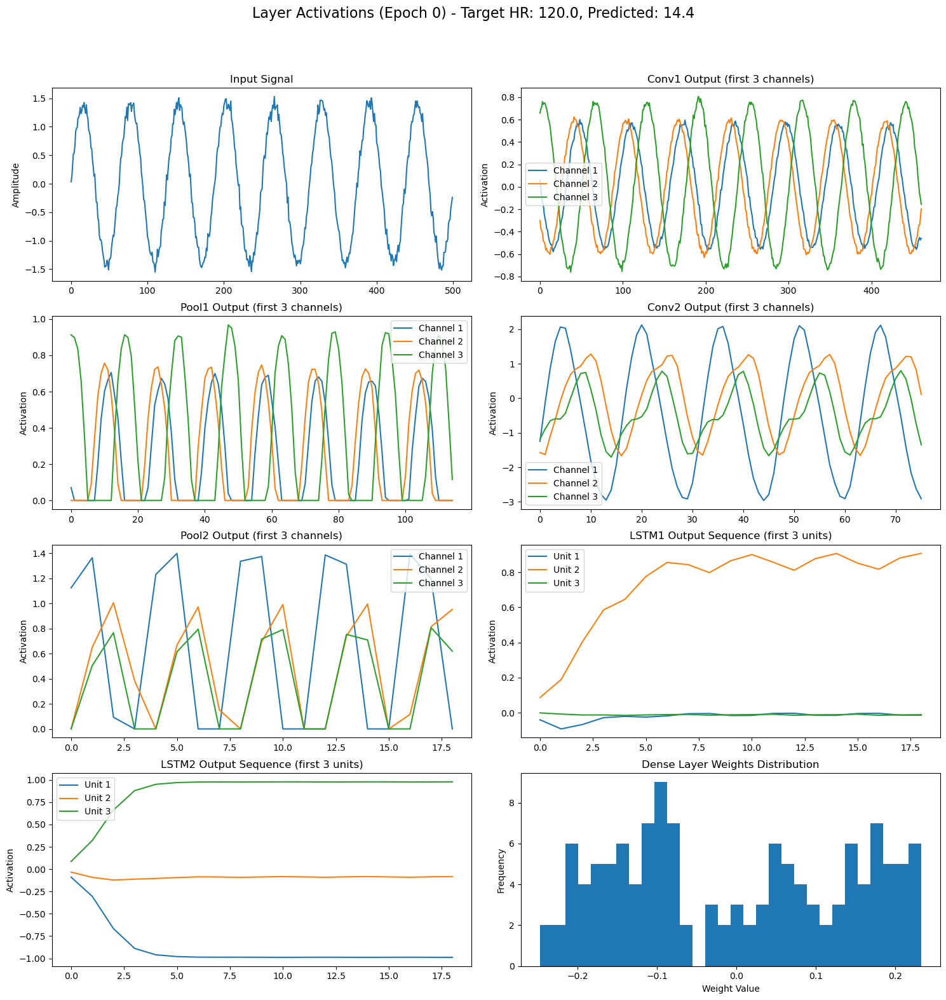

Target HR: 120.00 BPM
Predicted HR: 14.41 BPM
Error: -105.59 BPM
Epoch 20/500:
  Loss: 7335.845337
  Prediction: 34.72, Target: 120.00
Epoch 40/500:
  Loss: 5634.155518
  Prediction: 45.24, Target: 120.00
Epoch 60/500:
  Loss: 4331.861450
  Prediction: 54.46, Target: 120.00


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import TensorDataset, DataLoader

# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Create a single sinusoidal signal with known frequency
def generate_single_sinusoid(seq_length=500, heart_rate_bpm=120):
    """Generate a single sinusoid with known heart rate."""
    # Sample rate (Hz)
    fs = 125
    
    # Convert BPM to Hz
    freq = heart_rate_bpm / 60.0
    
    # Time vector
    t = np.arange(seq_length) / fs
    
    # Create clean sinusoid
    signal = np.sin(2 * np.pi * freq * t)
    
    # Add small noise for realism
    noise = np.random.normal(0, 0.05, seq_length)
    signal = signal + noise
    
    # Normalize
    signal = (signal - np.mean(signal)) / np.std(signal)
    
    # Reshape for PyTorch Conv1D: [batch, channels, sequence_length]
    signal = signal.reshape(1, 1, seq_length).astype(np.float32)
    
    return signal, np.array([heart_rate_bpm]).astype(np.float32)

# Generate the single example
X_single, y_single = generate_single_sinusoid(seq_length=500, heart_rate_bpm=120)

# Create DataLoader with just this one example (repeating it for batches)
n_copies = 16  # Number of copies to make for a reasonable batch size
X_repeated = np.repeat(X_single, n_copies, axis=0)
y_repeated = np.repeat(y_single, n_copies, axis=0)

# Convert to PyTorch tensors
train_dataset = TensorDataset(
    torch.tensor(X_repeated),
    torch.tensor(y_repeated)
)

# DataLoader with a small batch size
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)

# Modified model with hooks to capture intermediate outputs and proper LSTM handling
class DebuggableMotionPPGNet(nn.Module):
    def __init__(self, n_timesteps, n_features, n_outputs):
        super(DebuggableMotionPPGNet, self).__init__()
        # Conv1D blocks
        self.conv1 = nn.Conv1d(in_channels=n_features, out_channels=32, kernel_size=40)
        self.bn1 = nn.BatchNorm1d(num_features=32)
        self.pool1 = nn.MaxPool1d(kernel_size=4)
        self.dropout1 = nn.Dropout(p=0.1)
        self.conv2 = nn.Conv1d(in_channels=32, out_channels=32, kernel_size=40)
        self.bn2 = nn.BatchNorm1d(num_features=32)
        self.pool2 = nn.MaxPool1d(kernel_size=4)
        self.dropout2 = nn.Dropout(p=0.1)
        
        # Calculate the sequence length after conv and pooling
        l1 = n_timesteps - 40 + 1  # Conv1 output length
        l2 = l1 // 4              # Pool1 output length
        l3 = l2 - 40 + 1          # Conv2 output length
        self.seq_len_after_conv = l3 // 4  # Pool2 output length
        print(f"Sequence length after convolutions: {self.seq_len_after_conv}")
        
        # LSTM layers
        self.lstm1 = nn.LSTM(input_size=32, hidden_size=128, batch_first=True)
        self.lstm2 = nn.LSTM(input_size=128, hidden_size=128, batch_first=True)
        
        # Final dense layer for output
        self.dense = nn.Linear(in_features=128, out_features=1)
        
        # Store activations
        self.activations = {}
        
        # Initialize weights using Xavier/Glorot (similar to TensorFlow default)
        self._initialize_weights()
    
    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv1d):
                nn.init.xavier_uniform_(m.weight)
                if m.bias is not None:
                    nn.init.zeros_(m.bias)
            elif isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                nn.init.zeros_(m.bias)
    
    # Modified hook function to properly handle different types of outputs
    def get_activation(self, name):
        def hook(model, input, output):
            # Handle LSTM outputs differently (they're tuples)
            if isinstance(output, tuple):
                # For LSTMs: output[0] is sequence, output[1] is (h_n, c_n)
                self.activations[name] = (
                    output[0].detach(),  # Output sequence
                    output[1][0].detach()  # Final hidden state (h_n)
                )
            else:
                # For other layers
                self.activations[name] = output.detach()
        return hook
    
    def register_hooks(self):
        self.conv1.register_forward_hook(self.get_activation('conv1'))
        self.bn1.register_forward_hook(self.get_activation('bn1'))
        self.pool1.register_forward_hook(self.get_activation('pool1'))
        self.conv2.register_forward_hook(self.get_activation('conv2'))
        self.bn2.register_forward_hook(self.get_activation('bn2'))
        self.pool2.register_forward_hook(self.get_activation('pool2'))
        self.lstm1.register_forward_hook(self.get_activation('lstm1'))
        self.lstm2.register_forward_hook(self.get_activation('lstm2'))
        self.dense.register_forward_hook(self.get_activation('dense'))
        
    def forward(self, x):
        # x shape: (batch_size, n_features, n_timesteps)
        
        # Convolutional layers
        x = self.conv1(x)
        x = torch.relu(self.bn1(x))
        x = self.pool1(x)
        x = self.dropout1(x)
        
        x = self.conv2(x)
        x = torch.relu(self.bn2(x))
        x = self.pool2(x)
        x = self.dropout2(x)
        
        # Reshape for LSTM: (batch_size, seq_len, features)
        x = x.permute(0, 2, 1)
        
        # LSTM layers
        x, (h1, c1) = self.lstm1(x)
        x, (h2, c2) = self.lstm2(x)
        
        # Use the final hidden state
        x = h2.squeeze(0)
        
        # Final dense layer
        x = self.dense(x)
        
        return x.squeeze(-1)  # Remove last dim if it's 1

# Visualization function for layer outputs
def visualize_layer_outputs(model, input_tensor, target, epoch):
    """Visualize activations at each layer for a single input."""
    model.eval()
    
    # Forward pass
    with torch.no_grad():
        output = model(input_tensor)
    
    # Create plots for each layer
    fig, axs = plt.subplots(4, 2, figsize=(15, 16))
    fig.suptitle(f'Layer Activations (Epoch {epoch}) - Target HR: {target.item():.1f}, Predicted: {output.item():.1f}', fontsize=16)
    
    # Plot input signal
    axs[0, 0].set_title('Input Signal')
    axs[0, 0].plot(input_tensor[0, 0, :].cpu().numpy())
    axs[0, 0].set_ylabel('Amplitude')
    
    # Plot conv1 activations (first few channels)
    axs[0, 1].set_title('Conv1 Output (first 3 channels)')
    for i in range(min(3, model.activations['conv1'].shape[1])):
        axs[0, 1].plot(model.activations['conv1'][0, i, :].cpu().numpy(), label=f'Channel {i+1}')
    axs[0, 1].legend()
    axs[0, 1].set_ylabel('Activation')
    
    # Plot pool1 output
    axs[1, 0].set_title('Pool1 Output (first 3 channels)')
    for i in range(min(3, model.activations['pool1'].shape[1])):
        axs[1, 0].plot(model.activations['pool1'][0, i, :].cpu().numpy(), label=f'Channel {i+1}')
    axs[1, 0].legend()
    axs[1, 0].set_ylabel('Activation')
    
    # Plot conv2 activations
    axs[1, 1].set_title('Conv2 Output (first 3 channels)')
    for i in range(min(3, model.activations['conv2'].shape[1])):
        axs[1, 1].plot(model.activations['conv2'][0, i, :].cpu().numpy(), label=f'Channel {i+1}')
    axs[1, 1].legend()
    axs[1, 1].set_ylabel('Activation')
    
    # Plot pool2 output
    axs[2, 0].set_title('Pool2 Output (first 3 channels)')
    for i in range(min(3, model.activations['pool2'].shape[1])):
        axs[2, 0].plot(model.activations['pool2'][0, i, :].cpu().numpy(), label=f'Channel {i+1}')
    axs[2, 0].legend()
    axs[2, 0].set_ylabel('Activation')
    
    # Plot LSTM1 output 
    axs[2, 1].set_title('LSTM1 Output Sequence (first 3 units)')
    lstm1_out = model.activations['lstm1'][0]  # First element is output sequence
    for i in range(min(3, lstm1_out.shape[2])):
        axs[2, 1].plot(lstm1_out[0, :, i].cpu().numpy(), label=f'Unit {i+1}')
    axs[2, 1].legend()
    axs[2, 1].set_ylabel('Activation')
    
    # Plot LSTM2 output sequence
    axs[3, 0].set_title('LSTM2 Output Sequence (first 3 units)')
    lstm2_out = model.activations['lstm2'][0]  # First element is output sequence
    for i in range(min(3, lstm2_out.shape[2])):
        axs[3, 0].plot(lstm2_out[0, :, i].cpu().numpy(), label=f'Unit {i+1}')
    axs[3, 0].legend()
    axs[3, 0].set_ylabel('Activation')
    
    # Plot weights distribution of the final dense layer
    axs[3, 1].set_title('Dense Layer Weights Distribution')
    w = model.dense.weight.data.flatten().cpu().numpy()
    axs[3, 1].hist(w, bins=30)
    axs[3, 1].set_xlabel('Weight Value')
    axs[3, 1].set_ylabel('Frequency')
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.savefig(f'layer_activations_epoch_{epoch}.png')
    plt.show()
    
    # Print prediction details
    print(f"Target HR: {target.item():.2f} BPM")
    print(f"Predicted HR: {output.item():.2f} BPM")
    print(f"Error: {(output.item() - target.item()):.2f} BPM")
    
    model.train()  # Return to training mode

# Training function for overfitting to a single example
def train_single_example(model, dataloader, criterion, optimizer, epochs=300, device='cpu'):
    """Train the model to overfit to a single example with detailed monitoring."""
    losses = []
    predictions = []
    
    # Get a single example for consistent visualization
    for inputs, targets in dataloader:
        sample_input = inputs[0:1].to(device)
        sample_target = targets[0:1].to(device)
        break
    
    print(f"Training to predict heart rate: {sample_target.item():.1f} BPM")
    
    for epoch in range(epochs):
        model.train()
        epoch_loss = 0
        
        # For each batch in the (very small) dataset
        for inputs, targets in dataloader:
            inputs, targets = inputs.to(device), targets.to(device)
            
            # Forward pass
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            
            # Backward pass
            loss.backward()
            optimizer.step()
            
            epoch_loss += loss.item()
        
        # Record average loss for this epoch
        avg_loss = epoch_loss / len(dataloader)
        losses.append(avg_loss)
        
        # Make prediction on the sample input
        model.eval()
        with torch.no_grad():
            pred = model(sample_input).item()
            predictions.append(pred)
        model.train()
        
        # Monitor progress
        if epoch % 20 == 0 or epoch == epochs - 1:
            print(f"Epoch {epoch}/{epochs}:")
            print(f"  Loss: {avg_loss:.6f}")
            print(f"  Prediction: {pred:.2f}, Target: {sample_target.item():.2f}")
            
            # Visualize layer outputs every 100 epochs
            if epoch % 100 == 0 or epoch == epochs - 1:
                visualize_layer_outputs(model, sample_input, sample_target, epoch)
    
    # Plot loss curve
    plt.figure(figsize=(10, 4))
    plt.plot(losses)
    plt.title('Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss (MSE)')
    plt.yscale('log')  # Log scale often helps visualize the convergence better
    plt.grid(True)
    plt.savefig('training_loss.png')
    plt.show()
    
    # Plot predictions over time
    plt.figure(figsize=(10, 4))
    plt.plot(predictions, label='Predictions')
    plt.axhline(y=sample_target.item(), color='r', linestyle='--', label='Target')
    plt.title('Prediction vs Target Over Training')
    plt.xlabel('Epoch')
    plt.ylabel('Heart Rate (BPM)')
    plt.legend()
    plt.grid(True)
    plt.savefig('predictions_over_time.png')
    plt.show()
    
    return losses, predictions

# Create and train the model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Initialize model
model = DebuggableMotionPPGNet(X_single.shape[2], 1, 1)
model.to(device)
model.register_hooks()

# Display model structure
print(model)

# Training parameters
criterion = nn.MSELoss()
optimizer = optim.RMSprop(model.parameters(), lr=0.001)

# Train to overfit a single example
losses, predictions = train_single_example(
    model, train_loader, criterion, optimizer, 
    epochs=500, device=device
)

# Final evaluation
model.eval()
with torch.no_grad():
    # Test on the single example
    input_tensor = torch.tensor(X_single).to(device)
    target = torch.tensor(y_single).to(device)
    output = model(input_tensor)
    
    print("\nFinal Results:")
    print(f"Target HR: {target.item():.2f} BPM")
    print(f"Predicted HR: {output.item():.2f} BPM")
    print(f"Error: {abs(output.item() - target.item()):.2f} BPM")

# Check if model successfully overfit
if abs(output.item() - target.item()) < 1.0:
    print("\nSUCCESS: Model successfully overfit to the single example!")
else:
    print("\nFAILURE: Model could not overfit to the single example.")
    print("This indicates a fundamental issue with the model architecture or training process.")

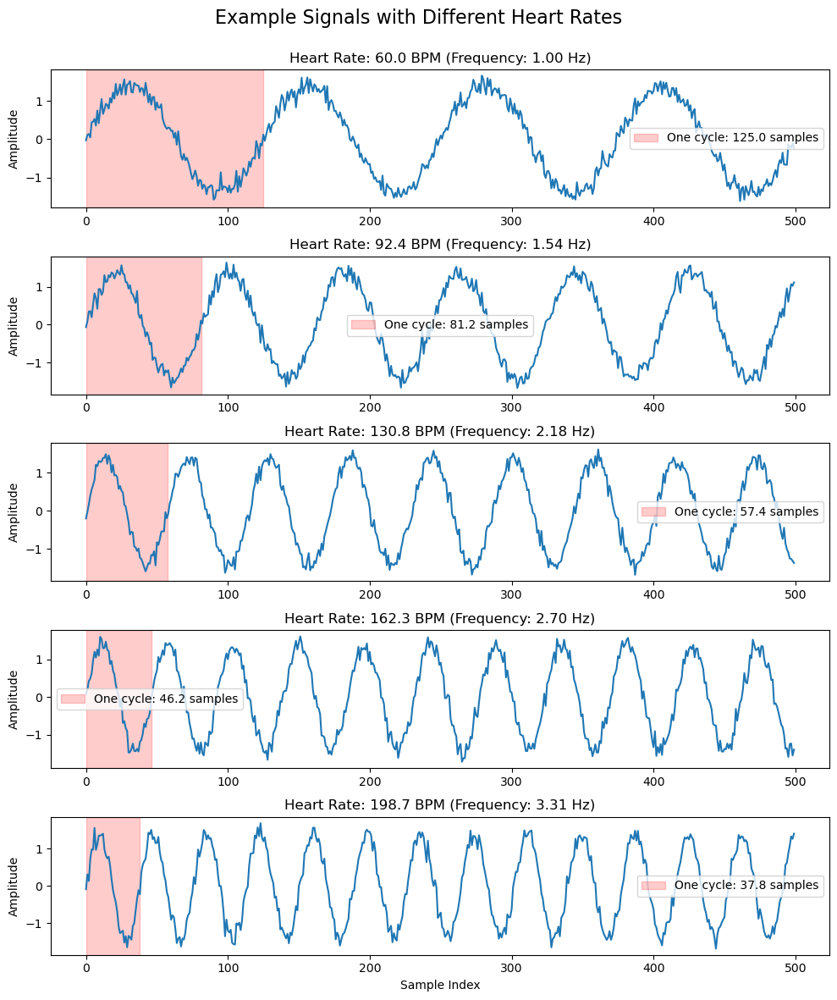

Using device: cpu
Sequence length after convolutions: 19
Epoch 0/200:
  Train Loss: 18033.0281
  Val Loss: 21436.7778
  Val MAE: 124.13 BPM


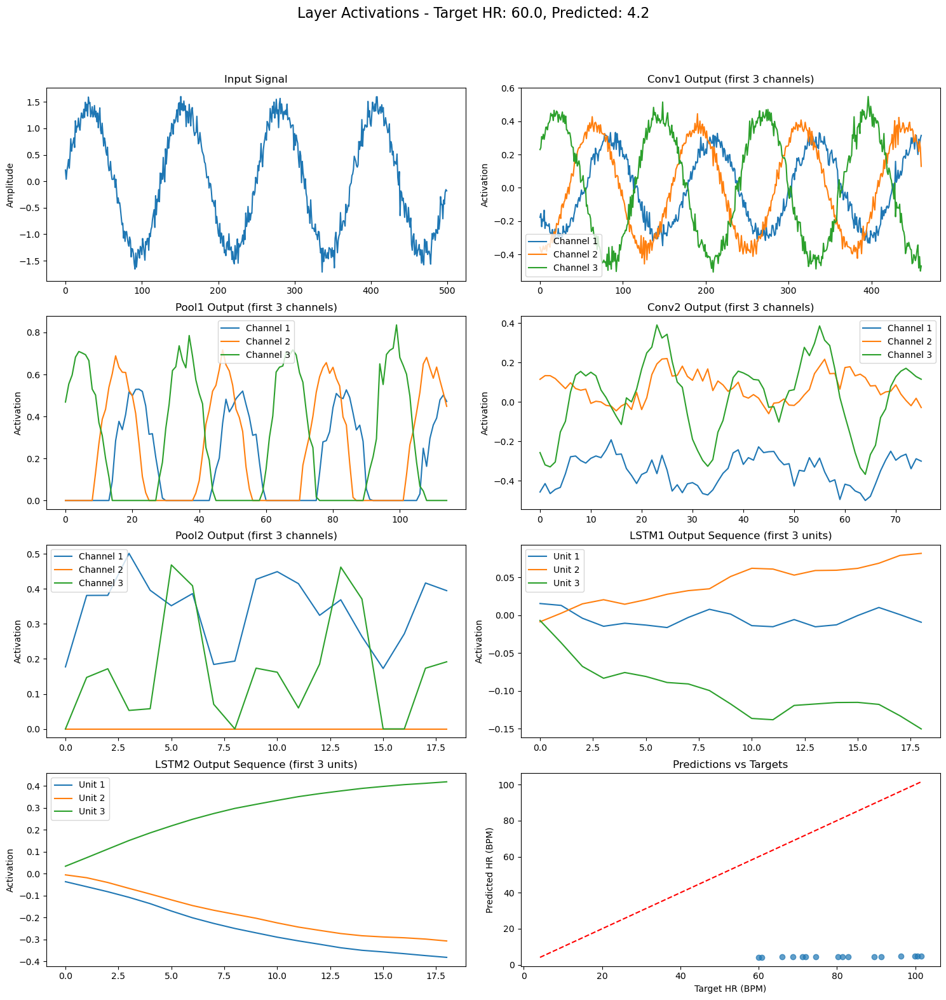

Target HR: 60.00 BPM
Predicted HR: 4.16 BPM
Error: 55.84 BPM
Epoch 10/200:
  Train Loss: 12480.5005
  Val Loss: 16025.4277
  Val MAE: 102.62 BPM
Epoch 20/200:
  Train Loss: 9780.4515
  Val Loss: 13149.1114
  Val MAE: 89.70 BPM
Epoch 30/200:
  Train Loss: 7840.2481
  Val Loss: 10616.5821
  Val MAE: 76.83 BPM
Epoch 40/200:
  Train Loss: 5863.5730
  Val Loss: 8429.6346
  Val MAE: 64.47 BPM
Epoch 50/200:
  Train Loss: 4362.8455
  Val Loss: 6548.3618
  Val MAE: 54.20 BPM


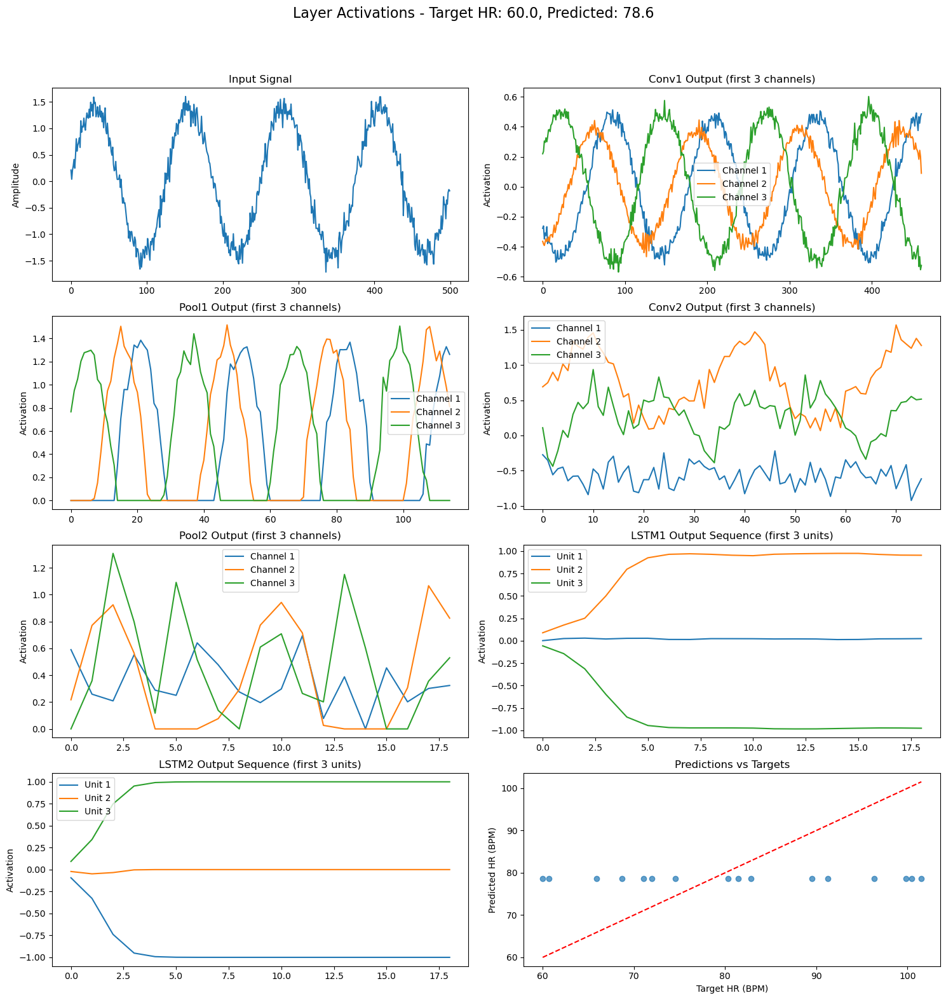

Target HR: 60.00 BPM
Predicted HR: 78.58 BPM
Error: 18.58 BPM
Epoch 60/200:
  Train Loss: 3213.1866
  Val Loss: 5014.2620
  Val MAE: 46.23 BPM
Epoch 70/200:
  Train Loss: 2334.9634
  Val Loss: 3832.2748
  Val MAE: 40.42 BPM
Epoch 80/200:
  Train Loss: 1845.4062
  Val Loss: 3002.0781
  Val MAE: 37.32 BPM
Epoch 90/200:
  Train Loss: 1143.1966
  Val Loss: 2118.5391
  Val MAE: 24.00 BPM
Epoch 100/200:
  Train Loss: 696.3464
  Val Loss: 1459.4306
  Val MAE: 16.65 BPM


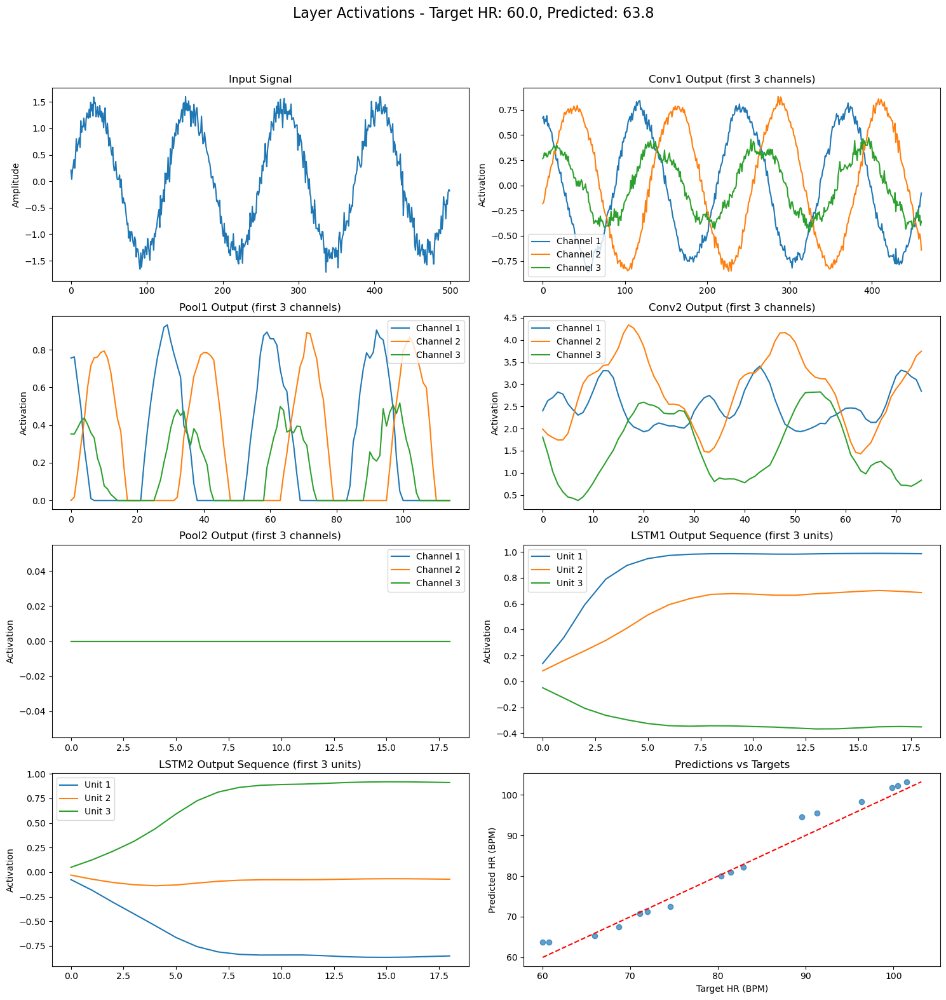

Target HR: 60.00 BPM
Predicted HR: 63.81 BPM
Error: 3.81 BPM
Epoch 110/200:
  Train Loss: 457.1749
  Val Loss: 958.2745
  Val MAE: 13.15 BPM
Epoch 120/200:
  Train Loss: 251.8187
  Val Loss: 622.5065
  Val MAE: 8.84 BPM
Epoch 130/200:
  Train Loss: 135.2334
  Val Loss: 392.0292
  Val MAE: 7.72 BPM
Epoch 140/200:
  Train Loss: 75.1971
  Val Loss: 231.2991
  Val MAE: 5.68 BPM
Epoch 150/200:
  Train Loss: 40.4780
  Val Loss: 138.7570
  Val MAE: 3.58 BPM


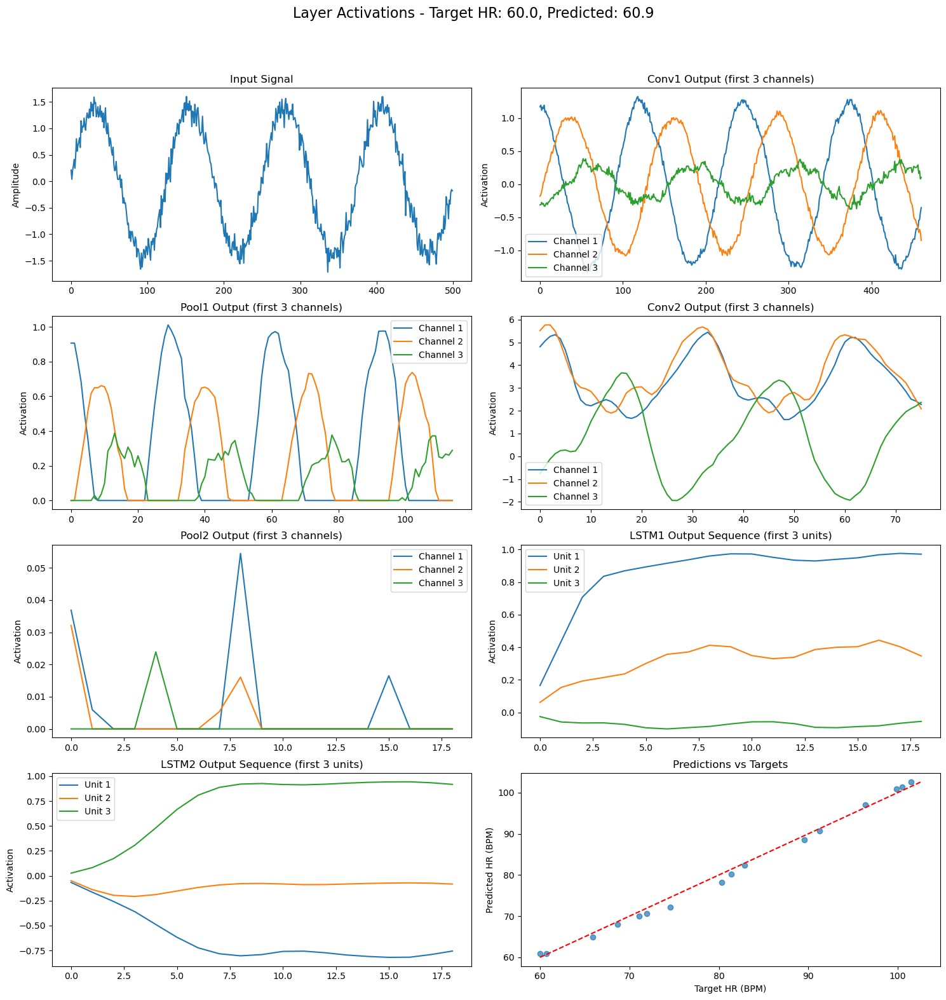

Target HR: 60.00 BPM
Predicted HR: 60.93 BPM
Error: 0.93 BPM
Epoch 160/200:
  Train Loss: 35.8722
  Val Loss: 85.3565
  Val MAE: 2.84 BPM
Epoch 170/200:
  Train Loss: 13.1679
  Val Loss: 50.1829
  Val MAE: 2.17 BPM
Epoch 180/200:
  Train Loss: 7.1108
  Val Loss: 28.1770
  Val MAE: 1.44 BPM
Epoch 190/200:
  Train Loss: 5.9789
  Val Loss: 15.8029
  Val MAE: 1.34 BPM
Epoch 199/200:
  Train Loss: 3.8715
  Val Loss: 11.8524
  Val MAE: 1.53 BPM


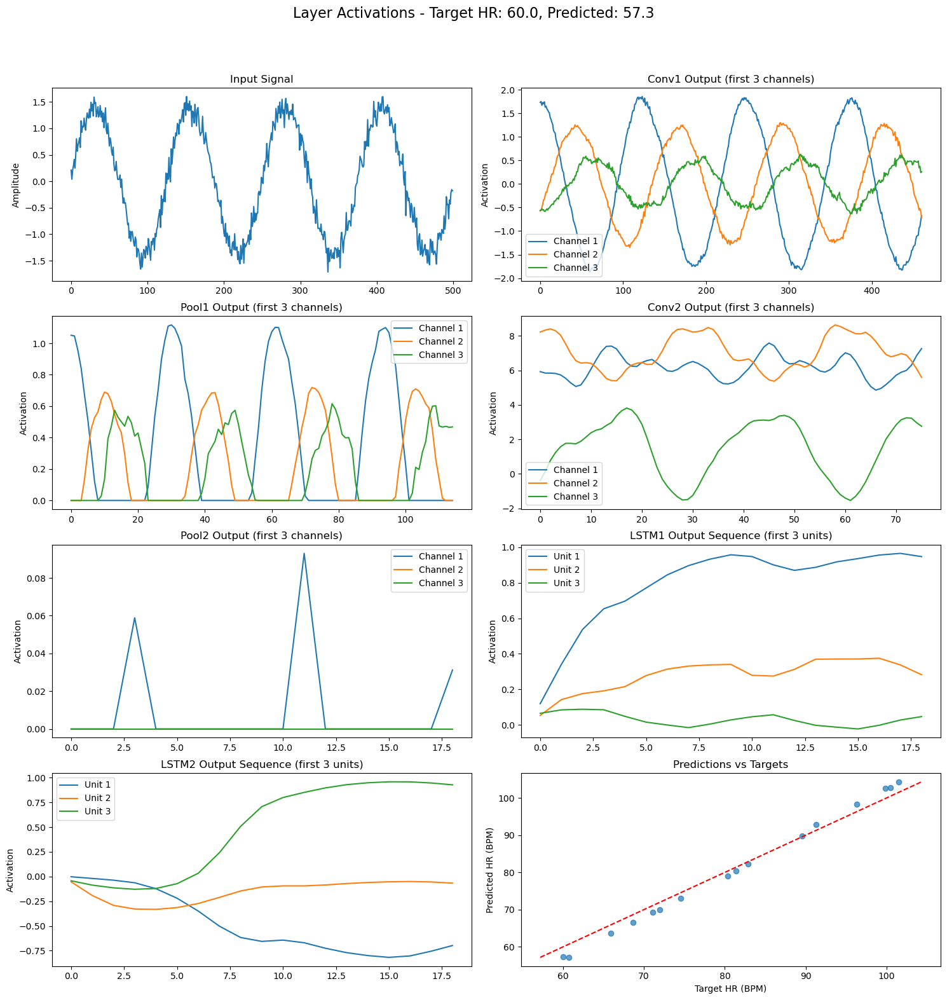

Target HR: 60.00 BPM
Predicted HR: 57.34 BPM
Error: 2.66 BPM
Loaded best model with validation loss: 11.8524


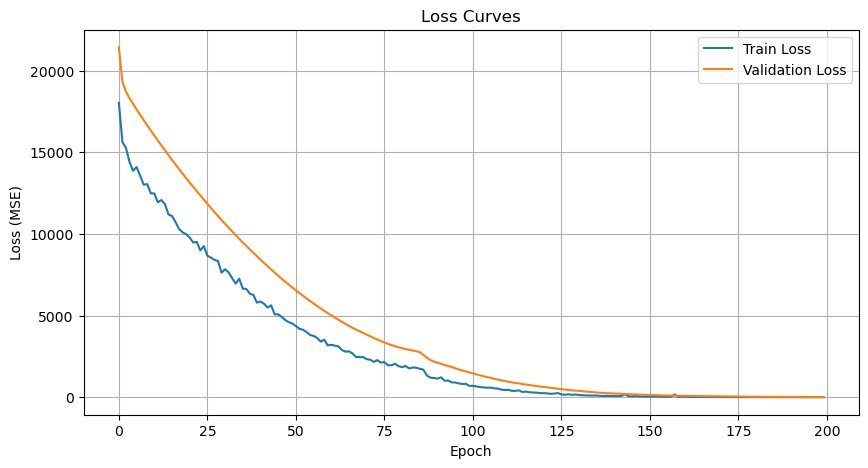

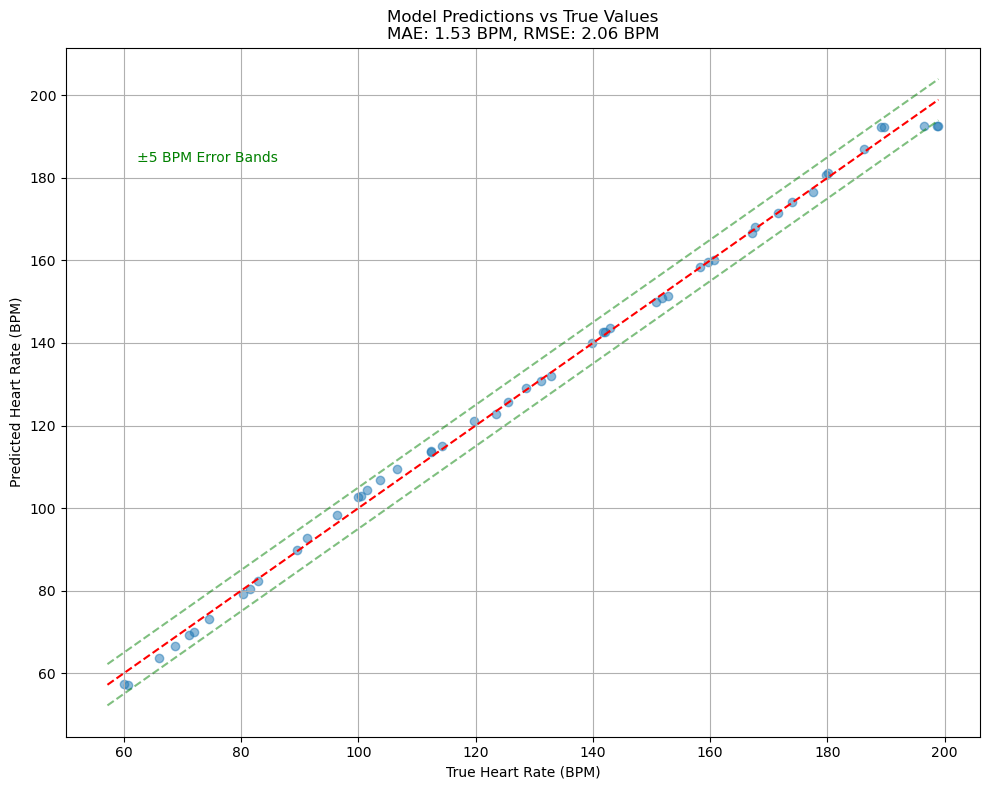

Mean Absolute Error: 1.53 BPM
Root Mean Square Error: 2.06 BPM
Predictions within ±1 BPM: 48.0%
Predictions within ±3 BPM: 88.0%
Predictions within ±5 BPM: 96.0%


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import TensorDataset, DataLoader

# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Modified function to create multiple sinusoids with varying heart rates
def generate_hr_dataset(n_samples=200, seq_length=500, min_hr=60, max_hr=200):
    """Generate a dataset of sinusoids with heart rates between min_hr and max_hr BPM."""
    # Heart rates in BPM - create linearly spaced values for better coverage
    hr_values = np.linspace(min_hr, max_hr, n_samples)
    # Add small random variations to avoid exact linear spacing
    hr_values += np.random.uniform(-3, 3, n_samples)
    # Clip to ensure we stay in the desired range
    hr_values = np.clip(hr_values, min_hr, max_hr)
    
    # Sample rate (Hz) - same as your Troika dataset
    fs = 125
    
    # Time vector
    t = np.arange(seq_length) / fs
    
    # Create signals and labels
    signals = []
    for hr in hr_values:
        # Convert BPM to Hz
        freq = hr / 60.0
        
        # Create clean sinusoid
        signal = np.sin(2 * np.pi * freq * t)
        
        # Add some noise
        noise = np.random.normal(0, 0.1, seq_length)
        signal = signal + noise
        
        # Normalize
        signal = (signal - np.mean(signal)) / np.std(signal)
        signals.append(signal)
    
    signals = np.array(signals).astype(np.float32)
    
    # Reshape for PyTorch Conv1D: [batch, channels, sequence_length]
    inputs = signals.reshape(n_samples, 1, seq_length)
    
    return inputs, hr_values.astype(np.float32)

# Generate training and testing data
X_train, y_train = generate_hr_dataset(n_samples=150, seq_length=500, min_hr=60, max_hr=200)
X_test, y_test = generate_hr_dataset(n_samples=50, seq_length=500, min_hr=60, max_hr=200)

# Convert to PyTorch tensors
train_dataset = TensorDataset(
    torch.tensor(X_train), 
    torch.tensor(y_train)
)

test_dataset = TensorDataset(
    torch.tensor(X_test), 
    torch.tensor(y_test)
)

# Create DataLoaders
batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Visualize some examples from the dataset
def visualize_dataset_samples(X, y, n_samples=5):
    """Visualize a few examples from the dataset."""
    fig, axes = plt.subplots(n_samples, 1, figsize=(10, 12))
    fig.suptitle('Example Signals with Different Heart Rates', fontsize=16)
    
    # Select indices with a good spread across the HR range
    indices = np.linspace(0, len(y)-1, n_samples).astype(int)
    
    for i, idx in enumerate(indices):
        # Plot the signal
        axes[i].plot(X[idx, 0, :])
        axes[i].set_title(f'Heart Rate: {y[idx]:.1f} BPM (Frequency: {y[idx]/60:.2f} Hz)')
        axes[i].set_ylabel('Amplitude')
        
        # Compute expected wavelength in samples
        wavelength_samples = 125 / (y[idx] / 60)  # fs / freq
        axes[i].axvspan(0, wavelength_samples, alpha=0.2, color='r', 
                       label=f'One cycle: {wavelength_samples:.1f} samples')
        axes[i].legend()
    
    axes[-1].set_xlabel('Sample Index')
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()

# Show examples from the dataset
visualize_dataset_samples(X_train, y_train)

# Modified model with hooks to capture intermediate outputs and proper LSTM handling
class DebuggableMotionPPGNet(nn.Module):
    def __init__(self, n_timesteps, n_features, n_outputs):
        super(DebuggableMotionPPGNet, self).__init__()
        # Conv1D blocks
        self.conv1 = nn.Conv1d(in_channels=n_features, out_channels=32, kernel_size=40)
        self.bn1 = nn.BatchNorm1d(num_features=32)
        self.pool1 = nn.MaxPool1d(kernel_size=4)
        self.dropout1 = nn.Dropout(p=0.1)
        self.conv2 = nn.Conv1d(in_channels=32, out_channels=32, kernel_size=40)
        self.bn2 = nn.BatchNorm1d(num_features=32)
        self.pool2 = nn.MaxPool1d(kernel_size=4)
        self.dropout2 = nn.Dropout(p=0.1)
        
        # Calculate the sequence length after conv and pooling
        l1 = n_timesteps - 40 + 1  # Conv1 output length
        l2 = l1 // 4              # Pool1 output length
        l3 = l2 - 40 + 1          # Conv2 output length
        self.seq_len_after_conv = l3 // 4  # Pool2 output length
        print(f"Sequence length after convolutions: {self.seq_len_after_conv}")
        
        # LSTM layers
        self.lstm1 = nn.LSTM(input_size=32, hidden_size=128, batch_first=True)
        self.lstm2 = nn.LSTM(input_size=128, hidden_size=128, batch_first=True)
        
        # Final dense layer for output
        self.dense = nn.Linear(in_features=128, out_features=1)
        
        # Store activations
        self.activations = {}
        
        # Initialize weights using Xavier/Glorot (similar to TensorFlow default)
        self._initialize_weights()
    
    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv1d):
                nn.init.xavier_uniform_(m.weight)
                if m.bias is not None:
                    nn.init.zeros_(m.bias)
            elif isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                nn.init.zeros_(m.bias)
    
    # Modified hook function to properly handle different types of outputs
    def get_activation(self, name):
        def hook(model, input, output):
            # Handle LSTM outputs differently (they're tuples)
            if isinstance(output, tuple):
                # For LSTMs: output[0] is sequence, output[1] is (h_n, c_n)
                self.activations[name] = (
                    output[0].detach(),  # Output sequence
                    output[1][0].detach()  # Final hidden state (h_n)
                )
            else:
                # For other layers
                self.activations[name] = output.detach()
        return hook
    
    def register_hooks(self):
        self.conv1.register_forward_hook(self.get_activation('conv1'))
        self.bn1.register_forward_hook(self.get_activation('bn1'))
        self.pool1.register_forward_hook(self.get_activation('pool1'))
        self.conv2.register_forward_hook(self.get_activation('conv2'))
        self.bn2.register_forward_hook(self.get_activation('bn2'))
        self.pool2.register_forward_hook(self.get_activation('pool2'))
        self.lstm1.register_forward_hook(self.get_activation('lstm1'))
        self.lstm2.register_forward_hook(self.get_activation('lstm2'))
        self.dense.register_forward_hook(self.get_activation('dense'))
        
    def forward(self, x):
        # x shape: (batch_size, n_features, n_timesteps)
        
        # Convolutional layers
        x = self.conv1(x)
        x = torch.relu(self.bn1(x))
        x = self.pool1(x)
        x = self.dropout1(x)
        
        x = self.conv2(x)
        x = torch.relu(self.bn2(x))
        x = self.pool2(x)
        x = self.dropout2(x)
        
        # Reshape for LSTM: (batch_size, seq_len, features)
        x = x.permute(0, 2, 1)
        
        # LSTM layers
        x, (h1, c1) = self.lstm1(x)
        x, (h2, c2) = self.lstm2(x)
        
        # Use the final hidden state
        x = h2.squeeze(0)
        
        # Final dense layer
        x = self.dense(x)
        
        return x.squeeze(-1)  # Remove last dim if it's 1

# Visualization function for layer outputs
def visualize_layer_outputs(model, dataloader, device):
    # Get a batch of data
    inputs, targets = next(iter(dataloader))
    # Select just one example for visualization
    input_tensor = inputs[0:1].to(device)
    target = targets[0:1].to(device)
    
    # Forward pass
    model.eval()
    with torch.no_grad():
        output = model(input_tensor)
    
    # Create plots for each layer
    fig, axs = plt.subplots(4, 2, figsize=(15, 16))
    fig.suptitle(f'Layer Activations - Target HR: {target.item():.1f}, Predicted: {output.item():.1f}', fontsize=16)
    
    # Plot input signal
    axs[0, 0].set_title('Input Signal')
    axs[0, 0].plot(input_tensor[0, 0, :].cpu().numpy())
    axs[0, 0].set_ylabel('Amplitude')
    
    # Plot conv1 activations (first few channels)
    axs[0, 1].set_title('Conv1 Output (first 3 channels)')
    for i in range(min(3, model.activations['conv1'].shape[1])):
        axs[0, 1].plot(model.activations['conv1'][0, i, :].cpu().numpy(), label=f'Channel {i+1}')
    axs[0, 1].legend()
    axs[0, 1].set_ylabel('Activation')
    
    # Plot pool1 output
    axs[1, 0].set_title('Pool1 Output (first 3 channels)')
    for i in range(min(3, model.activations['pool1'].shape[1])):
        axs[1, 0].plot(model.activations['pool1'][0, i, :].cpu().numpy(), label=f'Channel {i+1}')
    axs[1, 0].legend()
    axs[1, 0].set_ylabel('Activation')
    
    # Plot conv2 activations
    axs[1, 1].set_title('Conv2 Output (first 3 channels)')
    for i in range(min(3, model.activations['conv2'].shape[1])):
        axs[1, 1].plot(model.activations['conv2'][0, i, :].cpu().numpy(), label=f'Channel {i+1}')
    axs[1, 1].legend()
    axs[1, 1].set_ylabel('Activation')
    
    # Plot pool2 output
    axs[2, 0].set_title('Pool2 Output (first 3 channels)')
    for i in range(min(3, model.activations['pool2'].shape[1])):
        axs[2, 0].plot(model.activations['pool2'][0, i, :].cpu().numpy(), label=f'Channel {i+1}')
    axs[2, 0].legend()
    axs[2, 0].set_ylabel('Activation')
    
    # Plot LSTM1 output 
    axs[2, 1].set_title('LSTM1 Output Sequence (first 3 units)')
    lstm1_out = model.activations['lstm1'][0]  # First element is output sequence
    for i in range(min(3, lstm1_out.shape[2])):
        axs[2, 1].plot(lstm1_out[0, :, i].cpu().numpy(), label=f'Unit {i+1}')
    axs[2, 1].legend()
    axs[2, 1].set_ylabel('Activation')
    
    # Plot LSTM2 output sequence
    axs[3, 0].set_title('LSTM2 Output Sequence (first 3 units)')
    lstm2_out = model.activations['lstm2'][0]  # First element is output sequence
    for i in range(min(3, lstm2_out.shape[2])):
        axs[3, 0].plot(lstm2_out[0, :, i].cpu().numpy(), label=f'Unit {i+1}')
    axs[3, 0].legend()
    axs[3, 0].set_ylabel('Activation')
    
    # Plot predictions vs targets for this batch
    with torch.no_grad():
        batch_inputs, batch_targets = next(iter(dataloader))
        batch_inputs = batch_inputs.to(device)
        batch_targets = batch_targets.to(device)
        batch_outputs = model(batch_inputs)
    
    axs[3, 1].set_title('Predictions vs Targets')
    axs[3, 1].scatter(batch_targets.cpu().numpy(), batch_outputs.cpu().numpy(), alpha=0.7)
    # Add identity line (perfect predictions)
    min_val = min(batch_targets.min().item(), batch_outputs.min().item())
    max_val = max(batch_targets.max().item(), batch_outputs.max().item())
    axs[3, 1].plot([min_val, max_val], [min_val, max_val], 'r--')
    axs[3, 1].set_xlabel('Target HR (BPM)')
    axs[3, 1].set_ylabel('Predicted HR (BPM)')
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()
    
    # Print statistics
    print(f"Target HR: {target.item():.2f} BPM")
    print(f"Predicted HR: {output.item():.2f} BPM")
    print(f"Error: {abs(output.item() - target.item()):.2f} BPM")
    
    model.train()  # Return to training mode

# Training function with monitoring
def train_model(model, train_loader, test_loader, criterion, optimizer, 
               epochs=100, device='cpu', monitor_every=10):
    """Train the model and monitor performance."""
    train_losses = []
    val_losses = []
    
    # For tracking best model
    best_val_loss = float('inf')
    best_model_state = None
    
    for epoch in range(epochs):
        # Training phase
        model.train()
        epoch_loss = 0
        
        for inputs, targets in train_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            
            # Forward pass
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            
            # Backward pass
            loss.backward()
            
            # Clip gradients to prevent explosion
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            
            optimizer.step()
            epoch_loss += loss.item()
        
        avg_train_loss = epoch_loss / len(train_loader)
        train_losses.append(avg_train_loss)
        
        # Validation phase
        model.eval()
        val_loss = 0
        val_preds = []
        val_targets_list = []
        
        with torch.no_grad():
            for inputs, targets in test_loader:
                inputs, targets = inputs.to(device), targets.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, targets)
                val_loss += loss.item()
                
                # Store predictions and targets for analysis
                val_preds.extend(outputs.cpu().numpy())
                val_targets_list.extend(targets.cpu().numpy())
        
        avg_val_loss = val_loss / len(test_loader)
        val_losses.append(avg_val_loss)
        
        # Save best model
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            best_model_state = model.state_dict().copy()
        
        # Monitoring and reporting
        if epoch % monitor_every == 0 or epoch == epochs - 1:
            # Calculate Mean Absolute Error
            val_preds = np.array(val_preds)
            val_targets_list = np.array(val_targets_list)
            mae = np.mean(np.abs(val_preds - val_targets_list))
            
            print(f"Epoch {epoch}/{epochs}:")
            print(f"  Train Loss: {avg_train_loss:.4f}")
            print(f"  Val Loss: {avg_val_loss:.4f}")
            print(f"  Val MAE: {mae:.2f} BPM")
            
            # Visualize every 5x monitor_every epochs
            if epoch % (monitor_every * 5) == 0 or epoch == epochs - 1:
                visualize_layer_outputs(model, test_loader, device)
    
    # Load best model
    model.load_state_dict(best_model_state)
    print(f"Loaded best model with validation loss: {best_val_loss:.4f}")
    
    # Plot loss curves
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title('Loss Curves')
    plt.xlabel('Epoch')
    plt.ylabel('Loss (MSE)')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return train_losses, val_losses

# Analyze model performance on test set
def evaluate_model(model, test_loader, device):
    """Evaluate the model and visualize predictions vs targets."""
    model.eval()
    all_preds = []
    all_targets = []
    
    with torch.no_grad():
        for inputs, targets in test_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = model(inputs)
            
            all_preds.extend(outputs.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
    
    # Convert to numpy arrays
    all_preds = np.array(all_preds)
    all_targets = np.array(all_targets)
    
    # Calculate error metrics
    mae = np.mean(np.abs(all_preds - all_targets))
    rmse = np.sqrt(np.mean((all_preds - all_targets)**2))
    
    # Plot predictions vs targets
    plt.figure(figsize=(10, 8))
    
    # Main scatter plot
    plt.scatter(all_targets, all_preds, alpha=0.5)
    
    # Identity line (perfect predictions)
    min_val = min(np.min(all_targets), np.min(all_preds))
    max_val = max(np.max(all_targets), np.max(all_preds))
    plt.plot([min_val, max_val], [min_val, max_val], 'r--')
    
    # Add error bands (±5 BPM)
    plt.plot([min_val, max_val], [min_val + 5, max_val + 5], 'g--', alpha=0.5)
    plt.plot([min_val, max_val], [min_val - 5, max_val - 5], 'g--', alpha=0.5)
    
    # Labels and title
    plt.xlabel('True Heart Rate (BPM)')
    plt.ylabel('Predicted Heart Rate (BPM)')
    plt.title(f'Model Predictions vs True Values\nMAE: {mae:.2f} BPM, RMSE: {rmse:.2f} BPM')
    plt.grid(True)
    
    # Add explanation of error bands
    plt.text(min_val + 5, max_val - 15, '±5 BPM Error Bands', color='green')
    
    plt.tight_layout()
    plt.show()
    
    # Calculate percentage of predictions within different error margins
    within_1bpm = np.mean(np.abs(all_preds - all_targets) <= 1.0) * 100
    within_3bpm = np.mean(np.abs(all_preds - all_targets) <= 3.0) * 100
    within_5bpm = np.mean(np.abs(all_preds - all_targets) <= 5.0) * 100
    
    print(f"Mean Absolute Error: {mae:.2f} BPM")
    print(f"Root Mean Square Error: {rmse:.2f} BPM")
    print(f"Predictions within ±1 BPM: {within_1bpm:.1f}%")
    print(f"Predictions within ±3 BPM: {within_3bpm:.1f}%")
    print(f"Predictions within ±5 BPM: {within_5bpm:.1f}%")
    
    return mae, rmse, all_preds, all_targets

# Create and train the model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Initialize model
model = DebuggableMotionPPGNet(X_train.shape[2], 1, 1)
model.to(device)
model.register_hooks()

# Training parameters
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)
# Alternatively, you can use RMSprop as in the original code
# optimizer = optim.RMSprop(model.parameters(), lr=0.001)

# Train the model
train_losses, val_losses = train_model(
    model, train_loader, test_loader, criterion, optimizer, 
    epochs=200, device=device, monitor_every=10
)

# Evaluate the model on the test set
mae, rmse, all_preds, all_targets = evaluate_model(model, test_loader, device)

Training set: 100 samples
Test set: 20 samples
Signal length: 1000 samples (8.0 seconds)


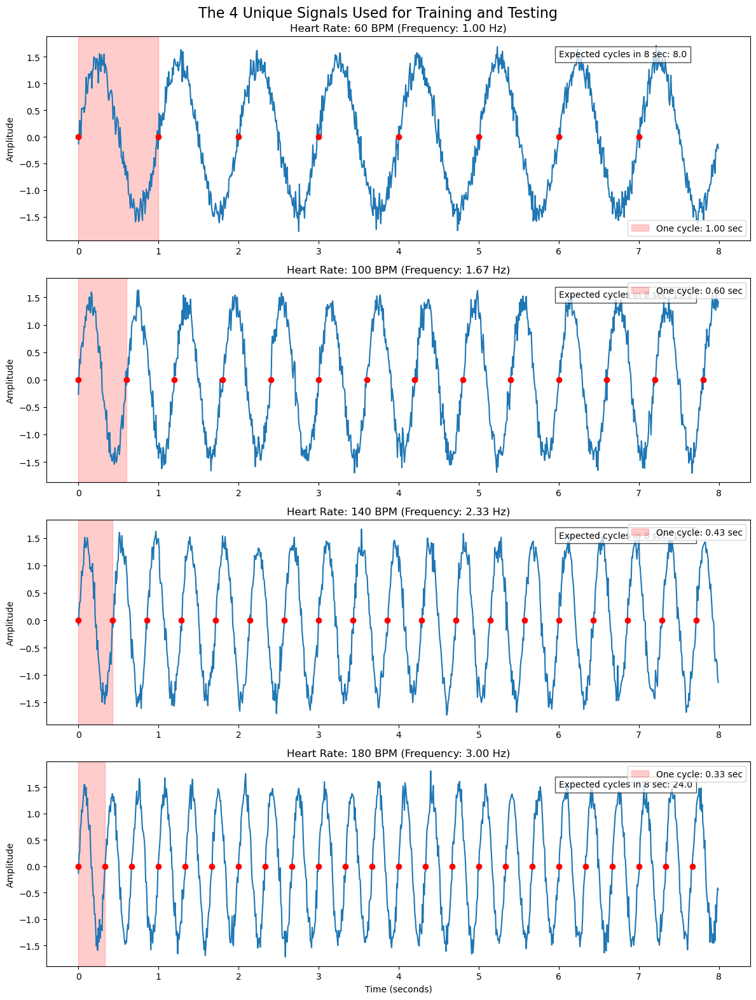

Using device: cpu
Sequence length after convolutions: 50


/Users/tmagcaya/miniconda3/envs/torch/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


#############################
Outputs: tensor([9.7670, 9.6541, 9.7730, 9.7480], grad_fn=<SqueezeBackward1>)
targets: tensor([180.,  60., 100., 100.])
Epoch 0/300:
  Train Loss: 15368.2625

Prediction Consistency Check:
-----------------------------
Signal 1 (True HR: 60 BPM):
  Predictions: [10.04650879 10.04650879 10.04650879 10.04650879 10.04650879]
  Mean: 10.05 BPM, StdDev: 0.00 BPM
  ✓ CONSISTENT (predictions are identical)
Signal 2 (True HR: 100 BPM):
  Predictions: [10.1686554 10.1686554 10.1686554 10.1686554 10.1686554]
  Mean: 10.17 BPM, StdDev: 0.00 BPM
  ✓ CONSISTENT (predictions are identical)
Signal 3 (True HR: 140 BPM):
  Predictions: [10.21001148 10.21001148 10.21001148 10.21001148 10.21001148]
  Mean: 10.21 BPM, StdDev: 0.00 BPM
  ✓ CONSISTENT (predictions are identical)
Signal 4 (True HR: 180 BPM):
  Predictions: [10.22341537 10.22341537 10.22341537 10.22341537 10.22341537]
  Mean: 10.22 BPM, StdDev: 0.00 BPM
  ✓ CONSISTENT (predictions are identical)
#################

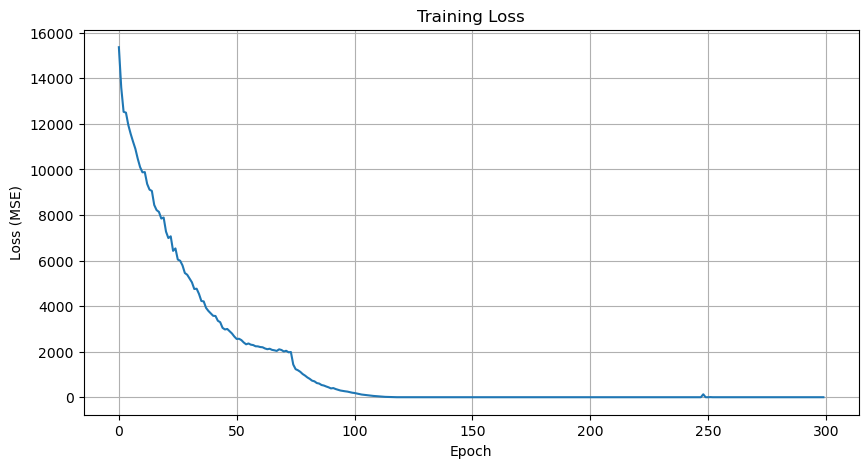

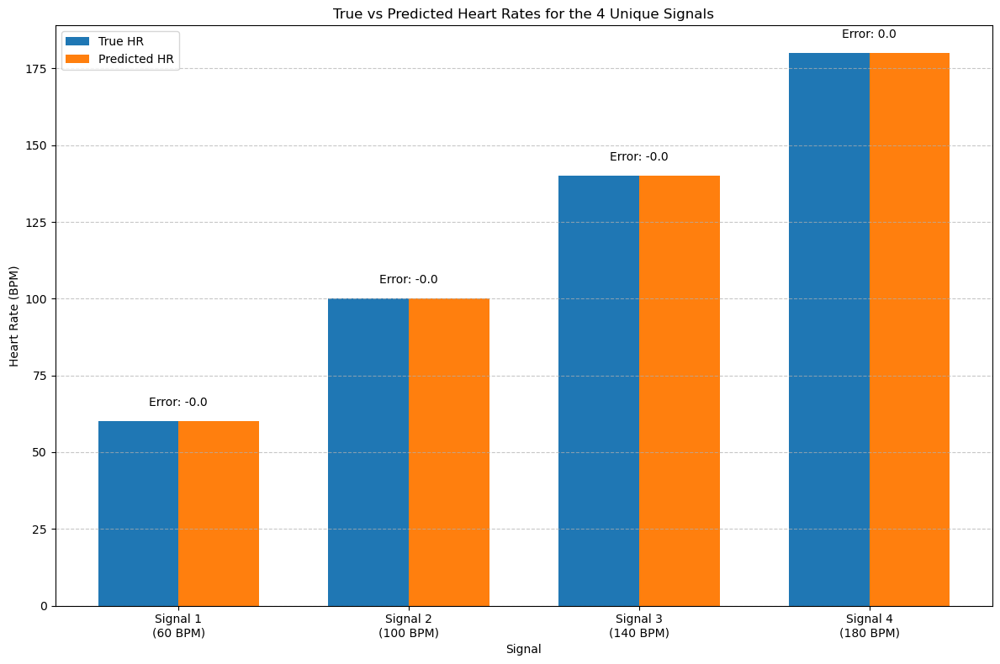


Detailed Evaluation Results:
--------------------------
Signal 1 (True HR: 60 BPM):
  Predicted: 59.98 BPM
  Error: -0.02 BPM
Signal 2 (True HR: 100 BPM):
  Predicted: 99.97 BPM
  Error: -0.03 BPM
Signal 3 (True HR: 140 BPM):
  Predicted: 140.00 BPM
  Error: -0.00 BPM
Signal 4 (True HR: 180 BPM):
  Predicted: 180.00 BPM
  Error: 0.00 BPM

Overall MAE: 0.01 BPM
Maximum Error: 0.03 BPM

EXCELLENT: Model predictions are very accurate (MAE < 1 BPM)


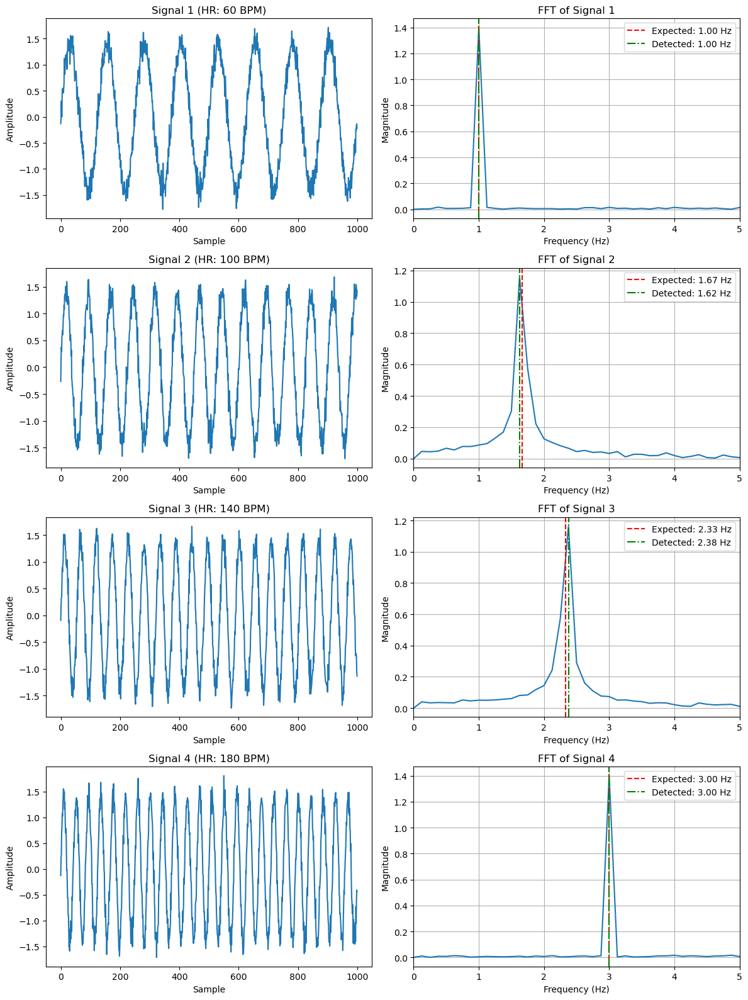


Visualizing activations for Signal 1 (HR: 60 BPM)


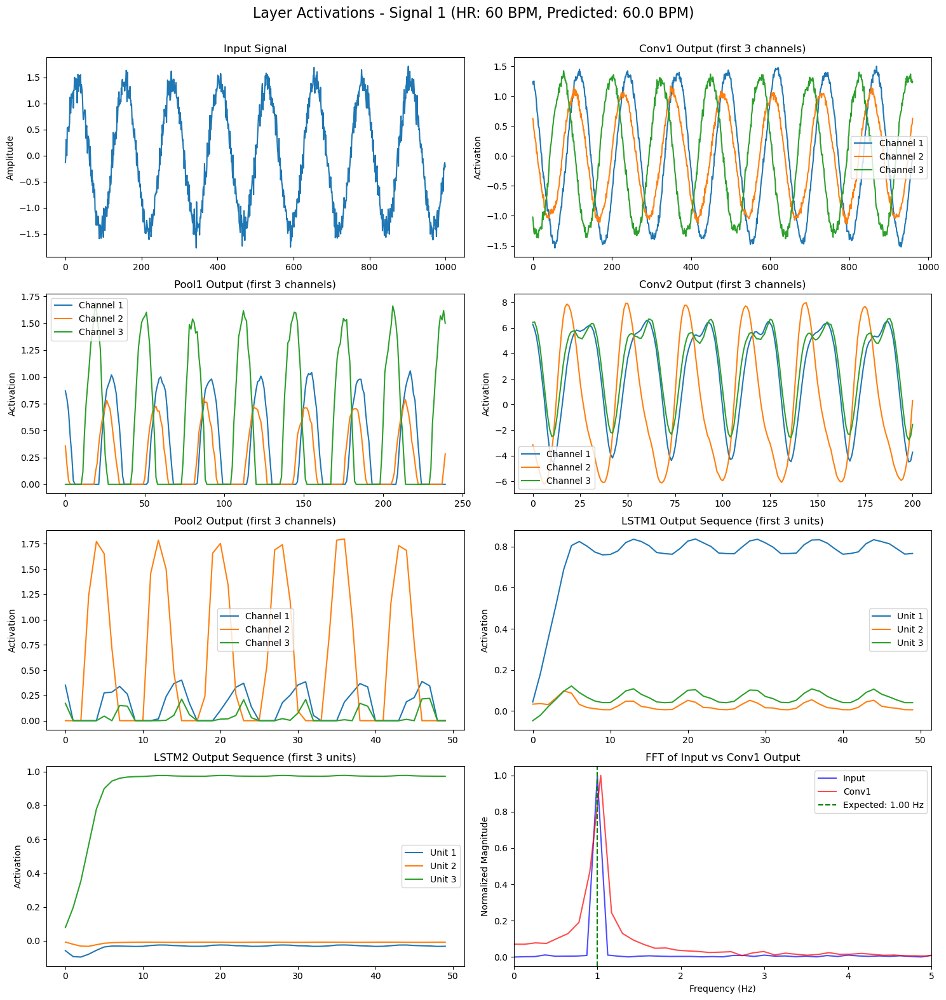


Visualizing activations for Signal 2 (HR: 100 BPM)


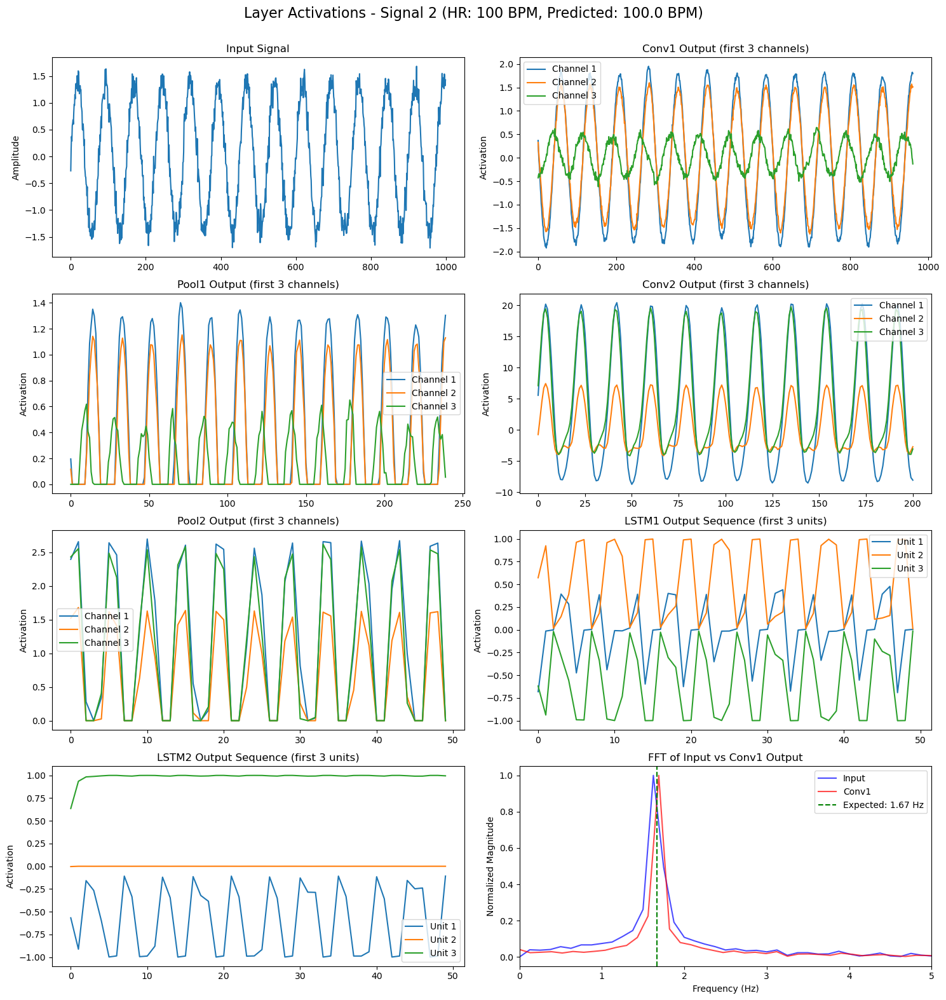


Visualizing activations for Signal 3 (HR: 140 BPM)


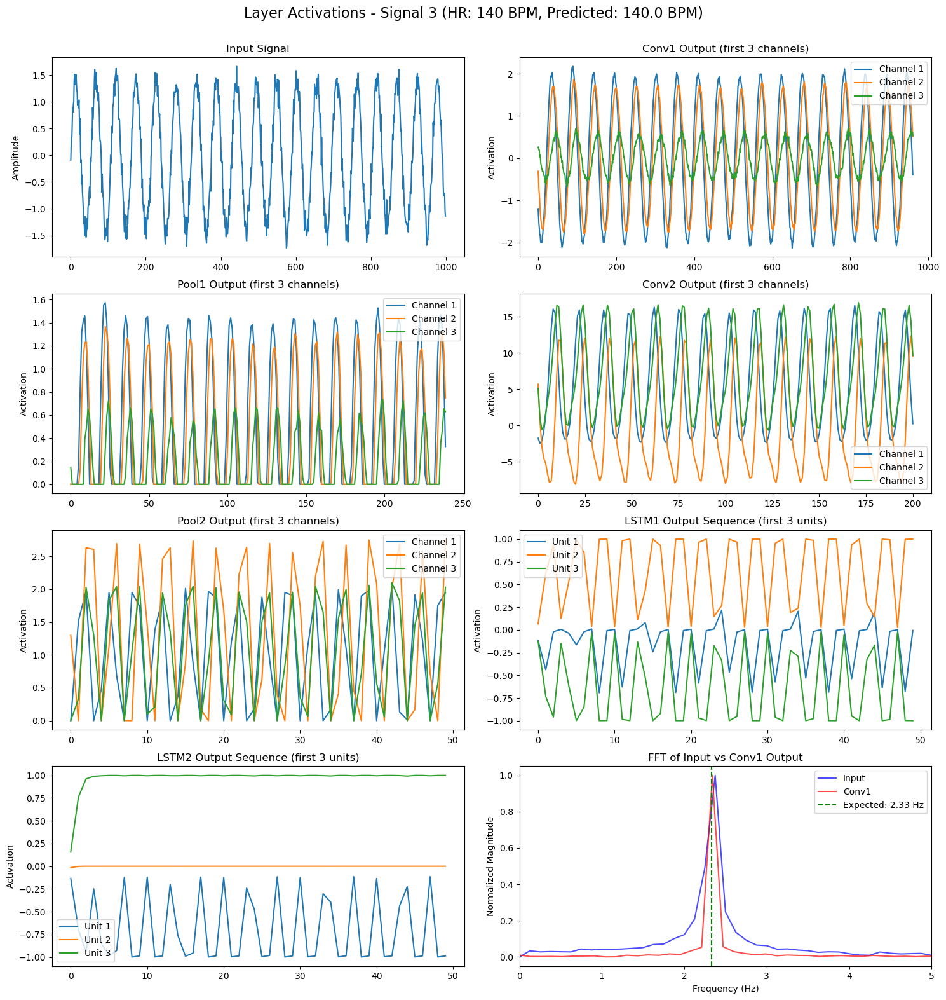


Visualizing activations for Signal 4 (HR: 180 BPM)


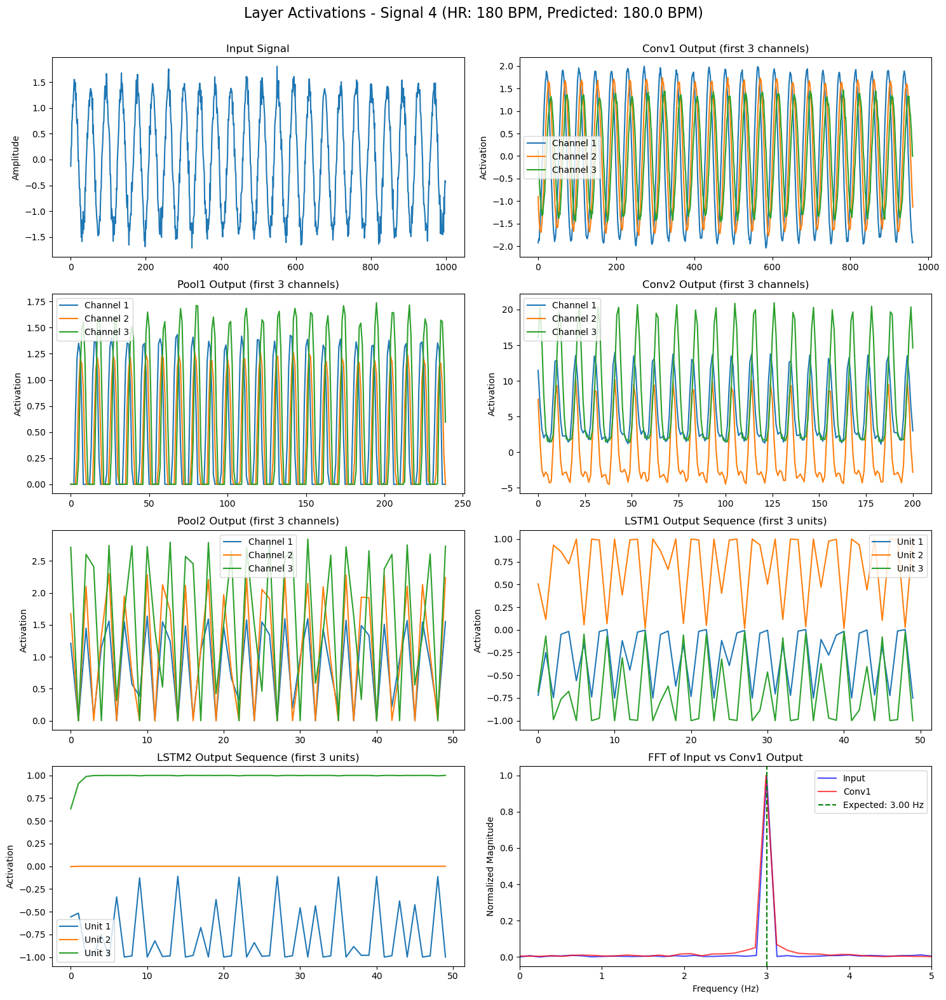

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import TensorDataset, DataLoader

# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Function to create 4 unique sinusoidal signals with different heart rates
def generate_fixed_hr_dataset(seq_length=1000):
    """Generate 4 distinct sinusoidal signals with fixed heart rates."""
    # Define 4 distinct heart rates (BPM)
    heart_rates = np.array([60, 100, 140, 180])
    
    # Sample rate (Hz)
    fs = 125
    
    # Time vector for 8 seconds (1000 samples at 125 Hz)
    t = np.arange(seq_length) / fs
    
    # Create 4 distinct signals
    signals = []
    for hr in heart_rates:
        # Convert BPM to Hz
        freq = hr / 60.0
        
        # Create clean sinusoid
        signal = np.sin(2 * np.pi * freq * t)
        
        # Add some noise (fixed seed for reproducibility)
        np.random.seed(int(hr))  # Different seed for each HR
        noise = np.random.normal(0, 0.1, seq_length)
        signal = signal + noise
        
        # Normalize
        signal = (signal - np.mean(signal)) / np.std(signal)
        signals.append(signal)
    
    # Create labels array
    signals = np.array(signals).astype(np.float32)
    
    # Reshape for PyTorch Conv1D: [batch=4, channels=1, sequence_length=1000]
    inputs = signals.reshape(4, 1, seq_length)
    
    return inputs, heart_rates.astype(np.float32)

# Create the 4 unique signals
X_unique, y_unique = generate_fixed_hr_dataset(seq_length=1000)

# Function to create a dataset by repeating the 4 unique signals
def create_repeated_dataset(X_unique, y_unique, n_repeats=25):
    """Create a dataset by repeating the unique signals."""
    n_signals = X_unique.shape[0]
    
    # Create arrays to hold repeated signals
    X_repeated = np.zeros((n_signals * n_repeats, 1, X_unique.shape[2]), dtype=np.float32)
    y_repeated = np.zeros(n_signals * n_repeats, dtype=np.float32)
    
    # Repeat each signal n_repeats times
    for i in range(n_signals):
        for j in range(n_repeats):
            idx = i * n_repeats + j
            X_repeated[idx] = X_unique[i]
            y_repeated[idx] = y_unique[i]
    
    return X_repeated, y_repeated

# Create training and test datasets
X_train, y_train = create_repeated_dataset(X_unique, y_unique, n_repeats=25)  # 100 samples (25 of each)
X_test, y_test = create_repeated_dataset(X_unique, y_unique, n_repeats=5)    # 20 samples (5 of each)

# Verify dataset creation
print(f"Training set: {X_train.shape[0]} samples")
print(f"Test set: {X_test.shape[0]} samples")
print(f"Signal length: {X_train.shape[2]} samples ({X_train.shape[2]/125:.1f} seconds)")

# Convert to PyTorch tensors
train_dataset = TensorDataset(
    torch.tensor(X_train),
    torch.tensor(y_train)
)

test_dataset = TensorDataset(
    torch.tensor(X_test),
    torch.tensor(y_test)
)

# Create DataLoaders
batch_size = 8
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Visualize the 4 unique signals
def visualize_unique_signals():
    """Visualize our 4 unique signals with their heart rates."""
    fig, axes = plt.subplots(4, 1, figsize=(12, 16))
    fig.suptitle('The 4 Unique Signals Used for Training and Testing', fontsize=16)
    
    # Time vector in seconds
    t = np.arange(X_unique.shape[2]) / 125
    
    for i in range(4):
        # Plot the signal
        axes[i].plot(t, X_unique[i, 0, :])
        axes[i].set_title(f'Heart Rate: {y_unique[i]:.0f} BPM (Frequency: {y_unique[i]/60:.2f} Hz)')
        axes[i].set_ylabel('Amplitude')
        
        # Calculate expected cycle length in seconds
        cycle_length_sec = 60 / y_unique[i]
        
        # Highlight the first complete cycle
        axes[i].axvspan(0, cycle_length_sec, alpha=0.2, color='r', 
                      label=f'One cycle: {cycle_length_sec:.2f} sec')
        
        # Add markers for expected peaks
        peak_times = np.arange(0, 8, cycle_length_sec)
        peak_indices = (peak_times * 125).astype(int)
        peak_indices = peak_indices[peak_indices < X_unique.shape[2]]
        
        axes[i].plot(peak_times, np.zeros_like(peak_times), 'ro', markersize=6)
        axes[i].legend()
        
        # Show number of expected cycles in 8 seconds
        expected_cycles = 8 / cycle_length_sec
        axes[i].text(6, 1.5, f'Expected cycles in 8 sec: {expected_cycles:.1f}', 
                   bbox=dict(facecolor='white', alpha=0.7))
    
    axes[-1].set_xlabel('Time (seconds)')
    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    plt.show()

# Visualize our unique signals
visualize_unique_signals()

# Modified model with longer sequence support
class DebuggableMotionPPGNet(nn.Module):
    def __init__(self, n_timesteps, n_features, n_outputs):
        super(DebuggableMotionPPGNet, self).__init__()
        # Conv1D blocks
        self.conv1 = nn.Conv1d(in_channels=n_features, out_channels=32, kernel_size=40)
        self.bn1 = nn.BatchNorm1d(num_features=32)
        self.pool1 = nn.MaxPool1d(kernel_size=4)
        self.dropout1 = nn.Dropout(p=0.1)
        self.conv2 = nn.Conv1d(in_channels=32, out_channels=32, kernel_size=40)
        self.bn2 = nn.BatchNorm1d(num_features=32)
        self.pool2 = nn.MaxPool1d(kernel_size=4)
        self.dropout2 = nn.Dropout(p=0.1)
        
        # Calculate the sequence length after conv and pooling
        l1 = n_timesteps - 40 + 1  # Conv1 output length
        l2 = l1 // 4              # Pool1 output length
        l3 = l2 - 40 + 1          # Conv2 output length
        self.seq_len_after_conv = l3 // 4  # Pool2 output length
        print(f"Sequence length after convolutions: {self.seq_len_after_conv}")
        
        # LSTM layers
        self.lstm1 = nn.LSTM(input_size=32, hidden_size=128, batch_first=True)
        self.lstm2 = nn.LSTM(input_size=128, hidden_size=128, batch_first=True)
        
        # Final dense layer for output
        self.dense = nn.Linear(in_features=128, out_features=1)
        
        # Store activations
        self.activations = {}
        
        # Initialize weights using Xavier/Glorot (similar to TensorFlow default)
        self._initialize_weights()
    
    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv1d):
                nn.init.xavier_uniform_(m.weight)
                if m.bias is not None:
                    nn.init.zeros_(m.bias)
            elif isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                nn.init.zeros_(m.bias)
    
    # Modified hook function to properly handle different types of outputs
    def get_activation(self, name):
        def hook(model, input, output):
            # Handle LSTM outputs differently (they're tuples)
            if isinstance(output, tuple):
                # For LSTMs: output[0] is sequence, output[1] is (h_n, c_n)
                self.activations[name] = (
                    output[0].detach(),  # Output sequence
                    output[1][0].detach()  # Final hidden state (h_n)
                )
            else:
                # For other layers
                self.activations[name] = output.detach()
        return hook
    
    def register_hooks(self):
        self.conv1.register_forward_hook(self.get_activation('conv1'))
        self.bn1.register_forward_hook(self.get_activation('bn1'))
        self.pool1.register_forward_hook(self.get_activation('pool1'))
        self.conv2.register_forward_hook(self.get_activation('conv2'))
        self.bn2.register_forward_hook(self.get_activation('bn2'))
        self.pool2.register_forward_hook(self.get_activation('pool2'))
        self.lstm1.register_forward_hook(self.get_activation('lstm1'))
        self.lstm2.register_forward_hook(self.get_activation('lstm2'))
        self.dense.register_forward_hook(self.get_activation('dense'))
        
    def forward(self, x):
        # x shape: (batch_size, n_features, n_timesteps)
        
        # Convolutional layers
        x = self.conv1(x)
        x = torch.relu(self.bn1(x))
        x = self.pool1(x)
        x = self.dropout1(x)
        
        x = self.conv2(x)
        x = torch.relu(self.bn2(x))
        x = self.pool2(x)
        x = self.dropout2(x)
        
        # Reshape for LSTM: (batch_size, seq_len, features)
        x = x.permute(0, 2, 1)
        
        # LSTM layers
        x, (h1, c1) = self.lstm1(x)
        x, (h2, c2) = self.lstm2(x)
        
        # Use the final hidden state
        x = h2.squeeze(0)
        
        # Final dense layer
        x = self.dense(x)
        
        return x.squeeze(-1)  # Remove last dim if it's 1

# Training function with consistency checking
def train_and_evaluate(model, train_loader, test_loader, criterion, optimizer, 
                      epochs=100, device='cpu', monitor_every=10):
    """Train the model and monitor if it produces consistent predictions for identical inputs."""
    train_losses = []
    
    for epoch in range(epochs):
        # Training phase
        model.train()
        epoch_loss = 0
        
        for inputs, targets in train_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            
            # Forward pass
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            
            # Backward pass
            loss.backward()
            
            # Clip gradients to prevent explosion
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            
            optimizer.step()
            epoch_loss += loss.item()
        print("#############################")
        print("Outputs: " + str(outputs))
        print("targets: " +str(targets))
        avg_train_loss = epoch_loss / len(train_loader)
        train_losses.append(avg_train_loss)
        
        # Monitoring and reporting
        if epoch % monitor_every == 0 or epoch == epochs - 1:
            print(f"Epoch {epoch}/{epochs}:")
            print(f"  Train Loss: {avg_train_loss:.4f}")
            
            # Check consistency every 5x monitor_every epochs
            if epoch % (monitor_every * 5) == 0 or epoch == epochs - 1:
                check_prediction_consistency(model, X_unique, y_unique, device)
    
    # Plot loss curve
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses)
    plt.title('Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss (MSE)')
    plt.grid(True)
    plt.show()
    
    # Final detailed evaluation
    detailed_evaluation(model, X_unique, y_unique, device)
    
    return train_losses

# Function to check if model gives consistent predictions for identical inputs
def check_prediction_consistency(model, X_unique, y_unique, device):
    """Check if the model predicts the same heart rate for identical signals."""
    model.eval()
    
    # Make predictions on each unique signal multiple times
    n_repeats = 5
    predictions = np.zeros((len(y_unique), n_repeats))
    
    with torch.no_grad():
        for i in range(len(y_unique)):
            input_tensor = torch.tensor(X_unique[i:i+1]).to(device)
            
            # Make multiple predictions on the same input
            for j in range(n_repeats):
                output = model(input_tensor).item()
                predictions[i, j] = output
    
    # Print results
    print("\nPrediction Consistency Check:")
    print("-----------------------------")
    for i in range(len(y_unique)):
        pred_mean = np.mean(predictions[i])
        pred_std = np.std(predictions[i])
        
        print(f"Signal {i+1} (True HR: {y_unique[i]:.0f} BPM):")
        print(f"  Predictions: {predictions[i]}")
        print(f"  Mean: {pred_mean:.2f} BPM, StdDev: {pred_std:.2f} BPM")
        
        # Check consistency
        if pred_std < 0.01:
            print("  ✓ CONSISTENT (predictions are identical)")
        elif pred_std < 0.1:
            print("  ✓ MOSTLY CONSISTENT (very small variation)")
        else:
            print("  ✗ INCONSISTENT (high variation between identical inputs)")
    
    model.train()

# Function for detailed evaluation on the 4 unique signals
def detailed_evaluation(model, X_unique, y_unique, device):
    """Evaluate model performance on the 4 unique signals with visualizations."""
    model.eval()
    
    # Make predictions
    predictions = []
    with torch.no_grad():
        for i in range(len(y_unique)):
            input_tensor = torch.tensor(X_unique[i:i+1]).to(device)
            output = model(input_tensor).item()
            predictions.append(output)
    
    # Visualize predictions vs targets
    plt.figure(figsize=(12, 8))
    
    # Create bar chart
    x = np.arange(len(y_unique))
    width = 0.35
    
    plt.bar(x - width/2, y_unique, width, label='True HR')
    plt.bar(x + width/2, predictions, width, label='Predicted HR')
    
    # Add error labels
    for i in range(len(y_unique)):
        error = predictions[i] - y_unique[i]
        plt.text(i, max(predictions[i], y_unique[i]) + 5, 
               f'Error: {error:.1f}', ha='center')
    
    plt.xlabel('Signal')
    plt.ylabel('Heart Rate (BPM)')
    plt.title('True vs Predicted Heart Rates for the 4 Unique Signals')
    plt.xticks(x, [f'Signal {i+1}\n({y_unique[i]:.0f} BPM)' for i in range(len(y_unique))])
    plt.legend()
    plt.grid(True, axis='y', linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    plt.show()
    
    # Calculate and print metrics
    errors = np.array(predictions) - y_unique
    mae = np.mean(np.abs(errors))
    max_error = np.max(np.abs(errors))
    
    print("\nDetailed Evaluation Results:")
    print("--------------------------")
    for i in range(len(y_unique)):
        print(f"Signal {i+1} (True HR: {y_unique[i]:.0f} BPM):")
        print(f"  Predicted: {predictions[i]:.2f} BPM")
        print(f"  Error: {errors[i]:.2f} BPM")
    
    print(f"\nOverall MAE: {mae:.2f} BPM")
    print(f"Maximum Error: {max_error:.2f} BPM")
    
    # Highlight key findings
    if mae < 1.0:
        print("\nEXCELLENT: Model predictions are very accurate (MAE < 1 BPM)")
    elif mae < 3.0:
        print("\nGOOD: Model predictions are reasonably accurate (MAE < 3 BPM)")
    elif mae < 5.0:
        print("\nFAIR: Model predictions have moderate errors (MAE < 5 BPM)")
    else:
        print("\nPOOR: Model predictions have significant errors (MAE > 5 BPM)")
    
    # Frequency domain analysis of the signals
    frequency_domain_analysis(X_unique, y_unique)
    
    model.train()

# Function to analyze signals in frequency domain
def frequency_domain_analysis(X_unique, y_unique):
    """Analyze the signals in frequency domain to verify frequency components."""
    plt.figure(figsize=(12, 16))
    
    # Sampling frequency (Hz)
    fs = 125
    
    for i in range(len(y_unique)):
        # Get the signal
        signal = X_unique[i, 0, :]
        
        # Compute FFT
        n = len(signal)
        fft_result = np.fft.fft(signal)
        fft_magnitude = np.abs(fft_result[:n//2]) / n
        fft_magnitude[1:] *= 2  # Account for negative frequencies
        
        # Frequency axis
        freq = np.fft.fftfreq(n, 1/fs)[:n//2]
        
        # Plot
        plt.subplot(4, 2, 2*i+1)
        plt.plot(signal)
        plt.title(f'Signal {i+1} (HR: {y_unique[i]:.0f} BPM)')
        plt.xlabel('Sample')
        plt.ylabel('Amplitude')
        
        plt.subplot(4, 2, 2*i+2)
        plt.plot(freq, fft_magnitude)
        plt.axvline(x=y_unique[i]/60, color='r', linestyle='--', 
                  label=f'Expected: {y_unique[i]/60:.2f} Hz')
        
        # Find highest peak
        peak_idx = np.argmax(fft_magnitude[1:]) + 1  # Skip DC component
        peak_freq = freq[peak_idx]
        plt.axvline(x=peak_freq, color='g', linestyle='-.',
                  label=f'Detected: {peak_freq:.2f} Hz')
        
        plt.title(f'FFT of Signal {i+1}')
        plt.xlabel('Frequency (Hz)')
        plt.ylabel('Magnitude')
        plt.xlim(0, 5)  # Focus on 0-5 Hz range
        plt.legend()
        plt.grid(True)
    
    plt.tight_layout()
    plt.show()

# Initialize and train model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Initialize model
model = DebuggableMotionPPGNet(X_unique.shape[2], 1, 1)
model.to(device)
model.register_hooks()

# Training parameters
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Train and evaluate
train_losses = train_and_evaluate(
    model, train_loader, test_loader, criterion, optimizer, 
    epochs=300, device=device, monitor_every=10
)

# Function to visualize layer activations for each unique signal
def visualize_layer_activations_for_all_signals(model, X_unique, device):
    """Visualize activations at each layer for all 4 unique signals."""
    model.eval()
    
    for i in range(len(X_unique)):
        print(f"\nVisualizing activations for Signal {i+1} (HR: {y_unique[i]:.0f} BPM)")
        
        # Forward pass
        input_tensor = torch.tensor(X_unique[i:i+1]).to(device)
        with torch.no_grad():
            output = model(input_tensor)
        
        # Create plots for each layer
        fig, axs = plt.subplots(4, 2, figsize=(15, 16))
        fig.suptitle(f'Layer Activations - Signal {i+1} (HR: {y_unique[i]:.0f} BPM, Predicted: {output.item():.1f} BPM)', fontsize=16)
        
        # Plot input signal
        axs[0, 0].set_title('Input Signal')
        axs[0, 0].plot(input_tensor[0, 0, :].cpu().numpy())
        axs[0, 0].set_ylabel('Amplitude')
        
        # Plot conv1 activations (first few channels)
        axs[0, 1].set_title('Conv1 Output (first 3 channels)')
        for j in range(min(3, model.activations['conv1'].shape[1])):
            axs[0, 1].plot(model.activations['conv1'][0, j, :].cpu().numpy(), label=f'Channel {j+1}')
        axs[0, 1].legend()
        axs[0, 1].set_ylabel('Activation')
        
        # Plot pool1 output
        axs[1, 0].set_title('Pool1 Output (first 3 channels)')
        for j in range(min(3, model.activations['pool1'].shape[1])):
            axs[1, 0].plot(model.activations['pool1'][0, j, :].cpu().numpy(), label=f'Channel {j+1}')
        axs[1, 0].legend()
        axs[1, 0].set_ylabel('Activation')
        
        # Plot conv2 activations
        axs[1, 1].set_title('Conv2 Output (first 3 channels)')
        for j in range(min(3, model.activations['conv2'].shape[1])):
            axs[1, 1].plot(model.activations['conv2'][0, j, :].cpu().numpy(), label=f'Channel {j+1}')
        axs[1, 1].legend()
        axs[1, 1].set_ylabel('Activation')
        
        # Plot pool2 output
        axs[2, 0].set_title('Pool2 Output (first 3 channels)')
        for j in range(min(3, model.activations['pool2'].shape[1])):
            axs[2, 0].plot(model.activations['pool2'][0, j, :].cpu().numpy(), label=f'Channel {j+1}')
        axs[2, 0].legend()
        axs[2, 0].set_ylabel('Activation')
        
        # Plot LSTM1 output 
        axs[2, 1].set_title('LSTM1 Output Sequence (first 3 units)')
        lstm1_out = model.activations['lstm1'][0]  # First element is output sequence
        for j in range(min(3, lstm1_out.shape[2])):
            axs[2, 1].plot(lstm1_out[0, :, j].cpu().numpy(), label=f'Unit {j+1}')
        axs[2, 1].legend()
        axs[2, 1].set_ylabel('Activation')
        
        # Plot LSTM2 output sequence
        axs[3, 0].set_title('LSTM2 Output Sequence (first 3 units)')
        lstm2_out = model.activations['lstm2'][0]  # First element is output sequence
        for j in range(min(3, lstm2_out.shape[2])):
            axs[3, 0].plot(lstm2_out[0, :, j].cpu().numpy(), label=f'Unit {j+1}')
        axs[3, 0].legend()
        axs[3, 0].set_ylabel('Activation')
        
        # Compare FFT of input and conv1 output
        axs[3, 1].set_title('FFT of Input vs Conv1 Output')
        
        # FFT of input
        input_signal = input_tensor[0, 0, :].cpu().numpy()
        input_fft = np.abs(np.fft.fft(input_signal))[:len(input_signal)//2]
        input_freq = np.fft.fftfreq(len(input_signal), 1/125)[:len(input_signal)//2]
        axs[3, 1].plot(input_freq, input_fft/np.max(input_fft), 'b-', alpha=0.7, label='Input')
        
        # FFT of first conv1 channel
        conv1_signal = model.activations['conv1'][0, 0, :].cpu().numpy()
        conv1_fft = np.abs(np.fft.fft(conv1_signal))[:len(conv1_signal)//2]
        conv1_freq = np.fft.fftfreq(len(conv1_signal), 1/125)[:len(conv1_signal)//2]
        axs[3, 1].plot(conv1_freq, conv1_fft/np.max(conv1_fft), 'r-', alpha=0.7, label='Conv1')
        
        # Mark expected frequency
        expected_freq = y_unique[i]/60
        axs[3, 1].axvline(x=expected_freq, color='g', linestyle='--', 
                        label=f'Expected: {expected_freq:.2f} Hz')
        
        axs[3, 1].set_xlabel('Frequency (Hz)')
        axs[3, 1].set_ylabel('Normalized Magnitude')
        axs[3, 1].set_xlim(0, 5)
        axs[3, 1].legend()
        
        plt.tight_layout()
        plt.subplots_adjust(top=0.93)
        plt.show()
    
    model.train()

# Visualize activations for all signals
visualize_layer_activations_for_all_signals(model, X_unique, device)

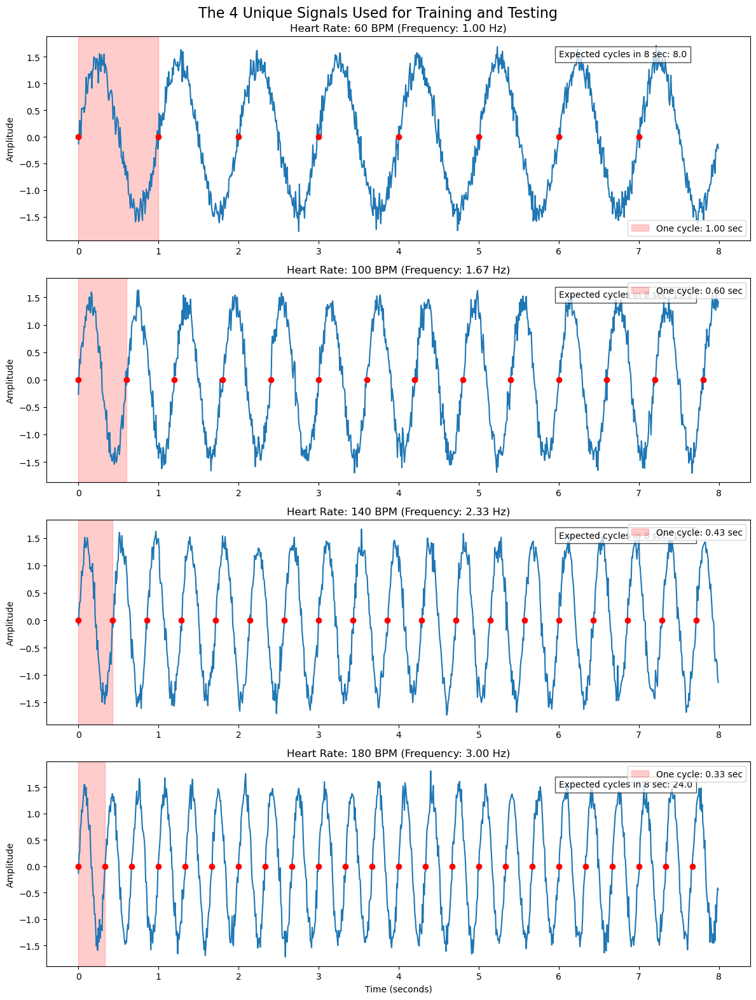

Using device: cpu
Sequence length after convolutions: 50
#############################
Outputs: tensor([19.9900, 19.9900, 19.9896, 19.9904, 19.9901],
       grad_fn=<SqueezeBackward1>)
targets: tensor([151.8560, 146.4208, 151.4346, 136.0726, 174.9735])
Epoch 0/300:
  Train Loss: 15151.2872

Prediction Consistency Check:
-----------------------------
Signal 1 (True HR: 60 BPM):
  Predictions: [20.12610626 20.12610626 20.12610626 20.12610626 20.12610626]
  Mean: 20.13 BPM, StdDev: 0.00 BPM
  ✓ CONSISTENT (predictions are identical)
Signal 2 (True HR: 100 BPM):
  Predictions: [20.12648201 20.12648201 20.12648201 20.12648201 20.12648201]
  Mean: 20.13 BPM, StdDev: 0.00 BPM
  ✓ CONSISTENT (predictions are identical)
Signal 3 (True HR: 140 BPM):
  Predictions: [20.12640953 20.12640953 20.12640953 20.12640953 20.12640953]
  Mean: 20.13 BPM, StdDev: 0.00 BPM
  ✓ CONSISTENT (predictions are identical)
Signal 4 (True HR: 180 BPM):
  Predictions: [20.12683296 20.12683296 20.12683296 20.12683296 2

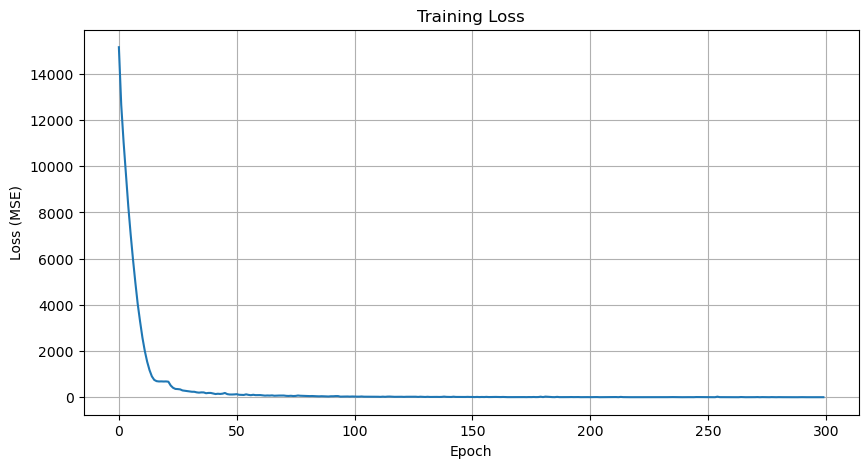

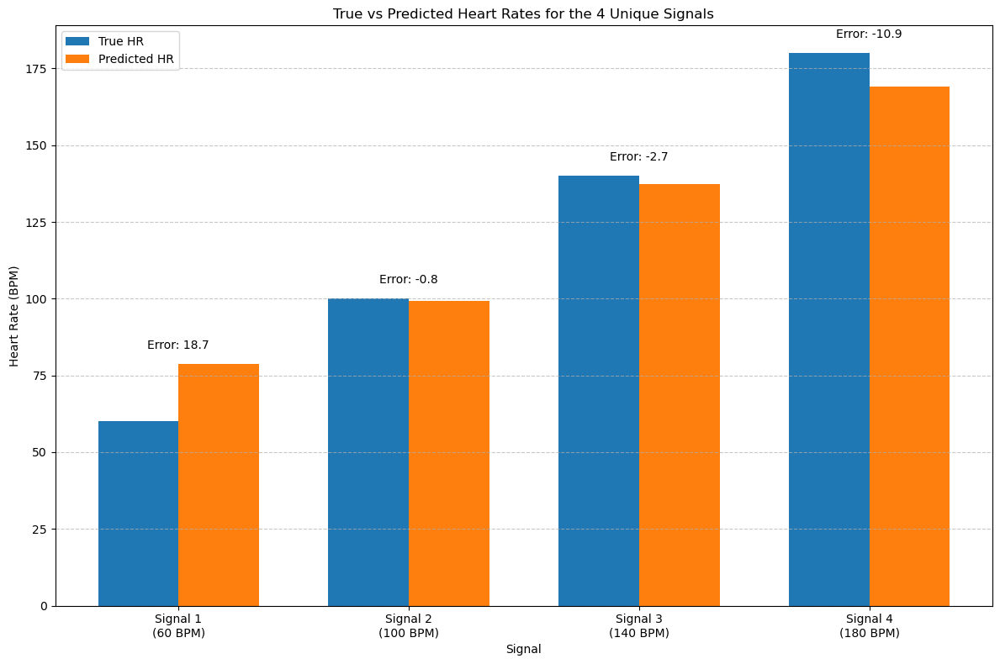


Detailed Evaluation Results:
--------------------------
Signal 1 (True HR: 60 BPM):
  Predicted: 78.68 BPM
  Error: 18.68 BPM
Signal 2 (True HR: 100 BPM):
  Predicted: 99.18 BPM
  Error: -0.82 BPM
Signal 3 (True HR: 140 BPM):
  Predicted: 137.31 BPM
  Error: -2.69 BPM
Signal 4 (True HR: 180 BPM):
  Predicted: 169.13 BPM
  Error: -10.87 BPM

Overall MAE: 8.27 BPM
Maximum Error: 18.68 BPM

POOR: Model predictions have significant errors (MAE > 5 BPM)


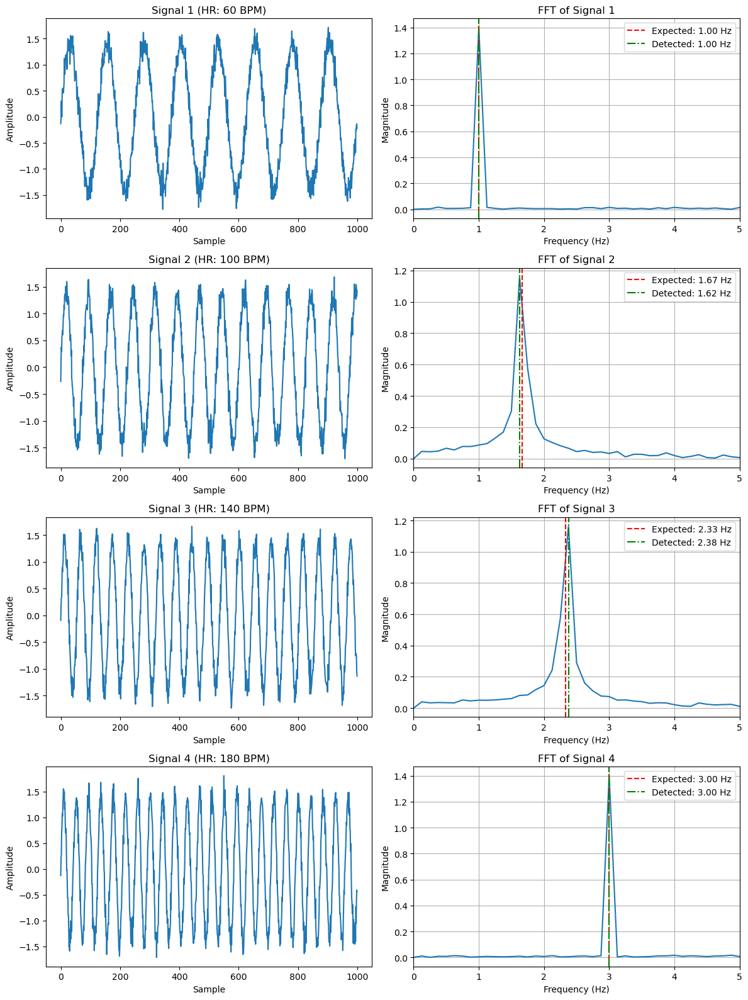


Visualizing activations for Signal 1 (HR: 60 BPM)


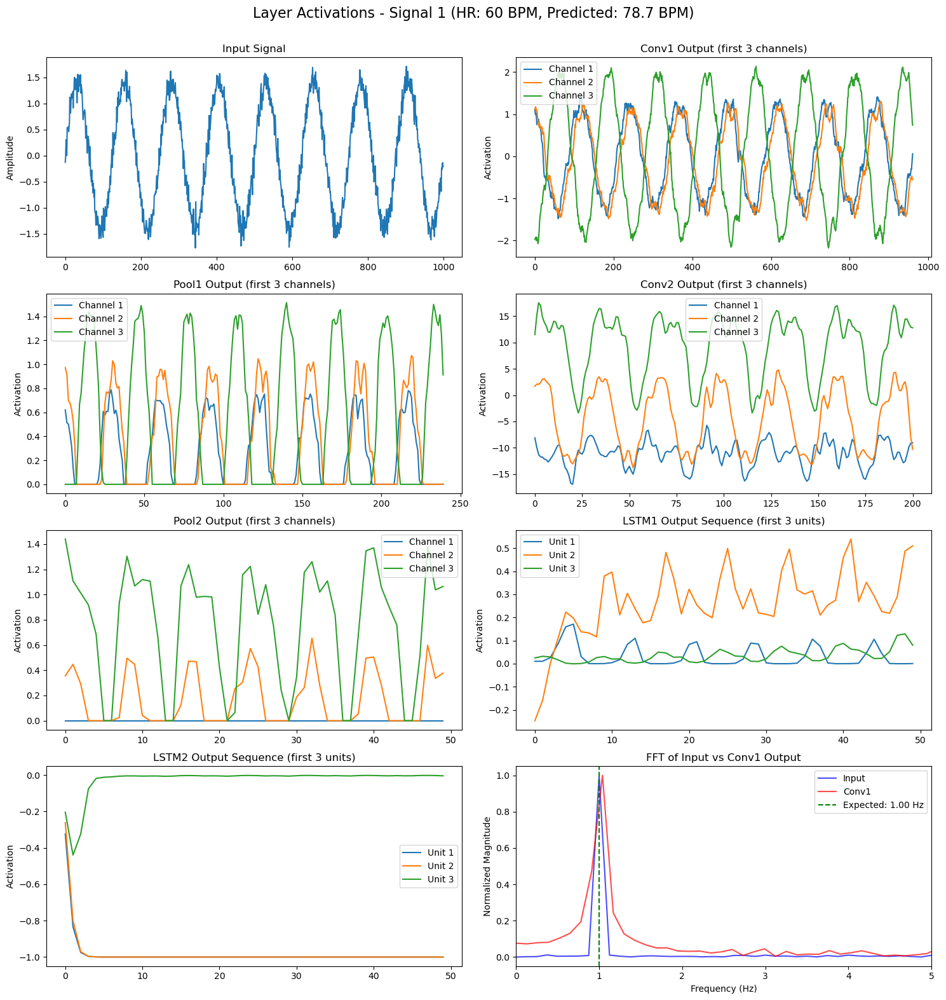


Visualizing activations for Signal 2 (HR: 100 BPM)


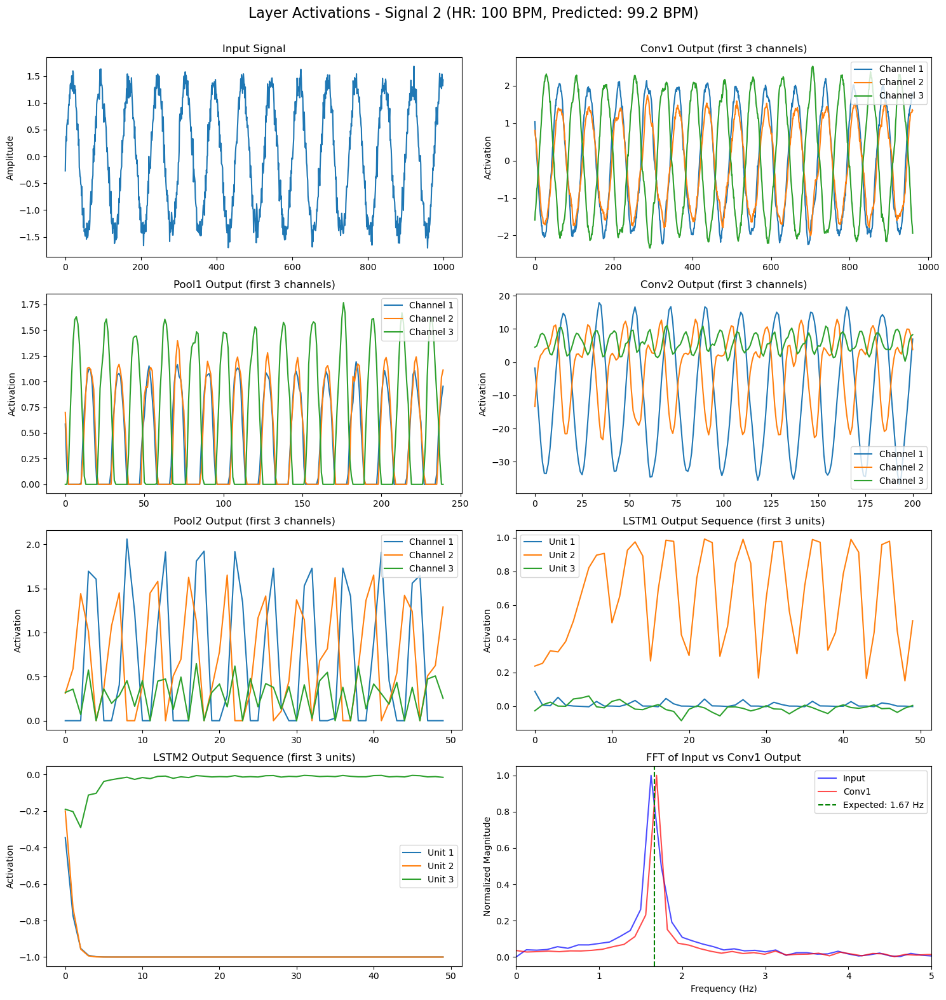


Visualizing activations for Signal 3 (HR: 140 BPM)


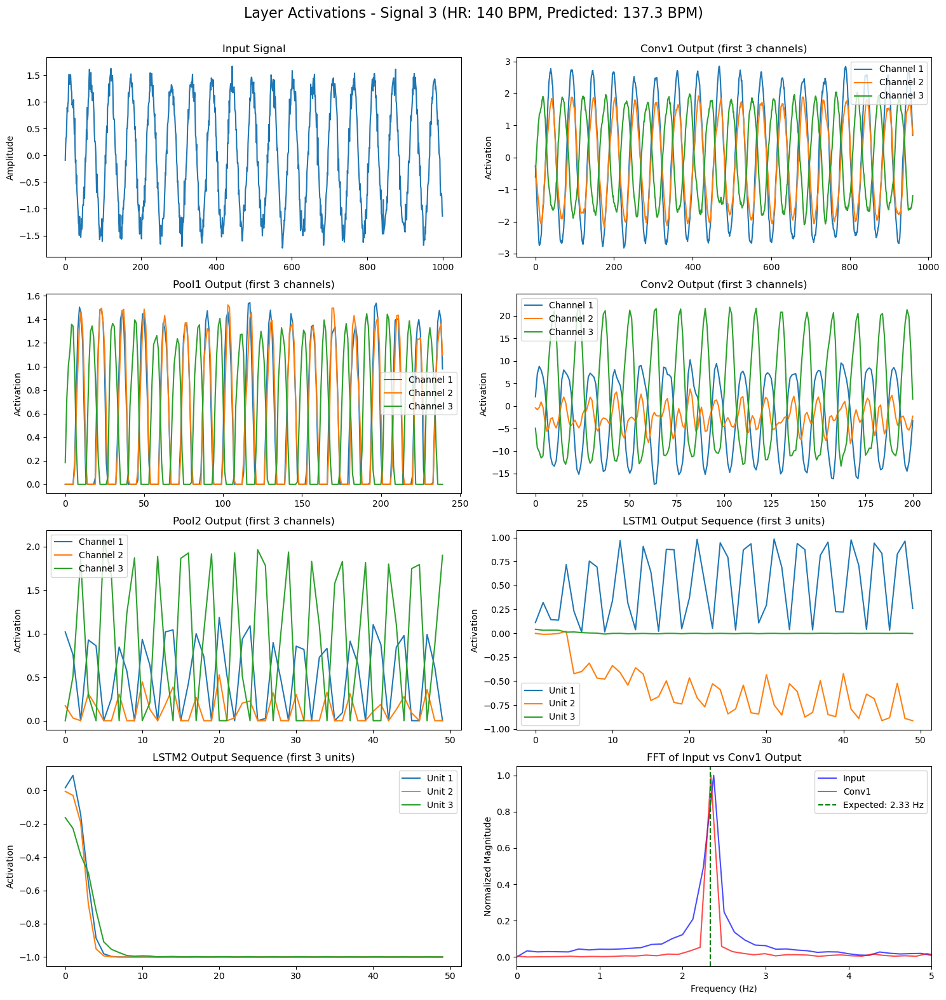


Visualizing activations for Signal 4 (HR: 180 BPM)


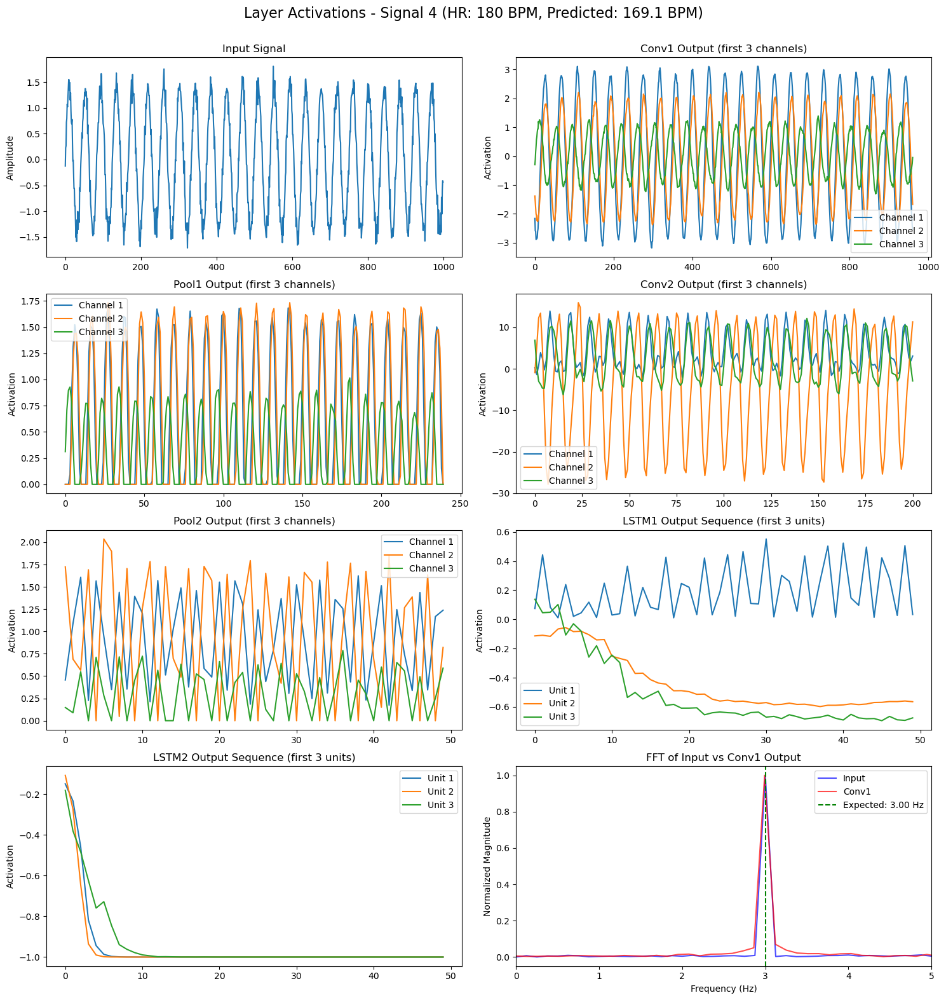

In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import TensorDataset, DataLoader
from utils.data_utils import *
from utils.viz_utils import *

# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

batch_size = 25

fs = 125
minBPM = 40
maxBPM = 240
window_length = 8 * fs
window_shift = 2 * fs  #Overlap = window_length - window_shift

# Retrieve dataset files
data_dir = "datasets/troika/training_data"
data_fls, ref_fls = LoadTroikaDataset(data_dir)
errs, confs = [], []

# Create the dataset
dataset = TroikaDataset(data_fls, ref_fls, window_length, window_shift, fs)

# Split the dataset into training and testing
train_size = 0.8
num_train = int(len(dataset) * train_size)
num_test = len(dataset) - num_train
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [num_train, num_test])

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Function to create 4 unique sinusoidal signals with different heart rates
def generate_fixed_hr_dataset(seq_length=1000):
    """Generate 4 distinct sinusoidal signals with fixed heart rates."""
    # Define 4 distinct heart rates (BPM)
    heart_rates = np.array([60, 100, 140, 180])
    
    # Sample rate (Hz)
    fs = 125
    
    # Time vector for 8 seconds (1000 samples at 125 Hz)
    t = np.arange(seq_length) / fs
    
    # Create 4 distinct signals
    signals = []
    for hr in heart_rates:
        # Convert BPM to Hz
        freq = hr / 60.0
        
        # Create clean sinusoid
        signal = np.sin(2 * np.pi * freq * t)
        
        # Add some noise (fixed seed for reproducibility)
        np.random.seed(int(hr))  # Different seed for each HR
        noise = np.random.normal(0, 0.1, seq_length)
        signal = signal + noise
        
        # Normalize
        signal = (signal - np.mean(signal)) / np.std(signal)
        signals.append(signal)
    
    # Create labels array
    signals = np.array(signals).astype(np.float32)
    
    # Reshape for PyTorch Conv1D: [batch=4, channels=1, sequence_length=1000]
    inputs = signals.reshape(4, 1, seq_length)
    
    return inputs, heart_rates.astype(np.float32)

# Create the 4 unique signals
X_unique, y_unique = generate_fixed_hr_dataset(seq_length=1000)

# Function to create a dataset by repeating the 4 unique signals
def create_repeated_dataset(X_unique, y_unique, n_repeats=25):
    """Create a dataset by repeating the unique signals."""
    n_signals = X_unique.shape[0]
    
    # Create arrays to hold repeated signals
    X_repeated = np.zeros((n_signals * n_repeats, 1, X_unique.shape[2]), dtype=np.float32)
    y_repeated = np.zeros(n_signals * n_repeats, dtype=np.float32)
    
    # Repeat each signal n_repeats times
    for i in range(n_signals):
        for j in range(n_repeats):
            idx = i * n_repeats + j
            X_repeated[idx] = X_unique[i]
            y_repeated[idx] = y_unique[i]
    
    return X_repeated, y_repeated

# Create training and test datasets
# X_train, y_train = create_repeated_dataset(X_unique, y_unique, n_repeats=25)  # 100 samples (25 of each)
# X_test, y_test = create_repeated_dataset(X_unique, y_unique, n_repeats=5)    # 20 samples (5 of each)

# Verify dataset creation
# print(f"Training set: {X_train.shape[0]} samples")
# print(f"Test set: {X_test.shape[0]} samples")
# print(f"Signal length: {X_train.shape[2]} samples ({X_train.shape[2]/125:.1f} seconds)")

# # Convert to PyTorch tensors
# train_dataset = TensorDataset(
#     torch.tensor(X_train),
#     torch.tensor(y_train)
# )

# test_dataset = TensorDataset(
#     torch.tensor(X_test),
#     torch.tensor(y_test)
# )

# Create DataLoaders
# batch_size = 8
# train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
# test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Visualize the 4 unique signals
def visualize_unique_signals():
    """Visualize our 4 unique signals with their heart rates."""
    fig, axes = plt.subplots(4, 1, figsize=(12, 16))
    fig.suptitle('The 4 Unique Signals Used for Training and Testing', fontsize=16)
    
    # Time vector in seconds
    t = np.arange(X_unique.shape[2]) / 125
    
    for i in range(4):
        # Plot the signal
        axes[i].plot(t, X_unique[i, 0, :])
        axes[i].set_title(f'Heart Rate: {y_unique[i]:.0f} BPM (Frequency: {y_unique[i]/60:.2f} Hz)')
        axes[i].set_ylabel('Amplitude')
        
        # Calculate expected cycle length in seconds
        cycle_length_sec = 60 / y_unique[i]
        
        # Highlight the first complete cycle
        axes[i].axvspan(0, cycle_length_sec, alpha=0.2, color='r', 
                      label=f'One cycle: {cycle_length_sec:.2f} sec')
        
        # Add markers for expected peaks
        peak_times = np.arange(0, 8, cycle_length_sec)
        peak_indices = (peak_times * 125).astype(int)
        peak_indices = peak_indices[peak_indices < X_unique.shape[2]]
        
        axes[i].plot(peak_times, np.zeros_like(peak_times), 'ro', markersize=6)
        axes[i].legend()
        
        # Show number of expected cycles in 8 seconds
        expected_cycles = 8 / cycle_length_sec
        axes[i].text(6, 1.5, f'Expected cycles in 8 sec: {expected_cycles:.1f}', 
                   bbox=dict(facecolor='white', alpha=0.7))
    
    axes[-1].set_xlabel('Time (seconds)')
    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    plt.show()

# Visualize our unique signals
visualize_unique_signals()

# Modified model with longer sequence support
class DebuggableMotionPPGNet(nn.Module):
    def __init__(self, n_timesteps, n_features, n_outputs):
        super(DebuggableMotionPPGNet, self).__init__()
        # Conv1D blocks
        self.conv1 = nn.Conv1d(in_channels=n_features, out_channels=32, kernel_size=40)
        self.bn1 = nn.BatchNorm1d(num_features=32)
        self.pool1 = nn.MaxPool1d(kernel_size=4)
        self.dropout1 = nn.Dropout(p=0.1)
        self.conv2 = nn.Conv1d(in_channels=32, out_channels=32, kernel_size=40)
        self.bn2 = nn.BatchNorm1d(num_features=32)
        self.pool2 = nn.MaxPool1d(kernel_size=4)
        self.dropout2 = nn.Dropout(p=0.1)
        
        # Calculate the sequence length after conv and pooling
        l1 = n_timesteps - 40 + 1  # Conv1 output length
        l2 = l1 // 4              # Pool1 output length
        l3 = l2 - 40 + 1          # Conv2 output length
        self.seq_len_after_conv = l3 // 4  # Pool2 output length
        print(f"Sequence length after convolutions: {self.seq_len_after_conv}")
        
        # LSTM layers
        self.lstm1 = nn.LSTM(input_size=32, hidden_size=128, batch_first=True)
        self.lstm2 = nn.LSTM(input_size=128, hidden_size=128, batch_first=True)
        
        # Final dense layer for output
        self.dense = nn.Linear(in_features=128, out_features=1)
        
        # Store activations
        self.activations = {}
        
        # Initialize weights using Xavier/Glorot (similar to TensorFlow default)
        self._initialize_weights()
    
    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv1d):
                nn.init.xavier_uniform_(m.weight)
                if m.bias is not None:
                    nn.init.zeros_(m.bias)
            elif isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                nn.init.zeros_(m.bias)
    
    # Modified hook function to properly handle different types of outputs
    def get_activation(self, name):
        def hook(model, input, output):
            # Handle LSTM outputs differently (they're tuples)
            if isinstance(output, tuple):
                # For LSTMs: output[0] is sequence, output[1] is (h_n, c_n)
                self.activations[name] = (
                    output[0].detach(),  # Output sequence
                    output[1][0].detach()  # Final hidden state (h_n)
                )
            else:
                # For other layers
                self.activations[name] = output.detach()
        return hook
    
    def register_hooks(self):
        self.conv1.register_forward_hook(self.get_activation('conv1'))
        self.bn1.register_forward_hook(self.get_activation('bn1'))
        self.pool1.register_forward_hook(self.get_activation('pool1'))
        self.conv2.register_forward_hook(self.get_activation('conv2'))
        self.bn2.register_forward_hook(self.get_activation('bn2'))
        self.pool2.register_forward_hook(self.get_activation('pool2'))
        self.lstm1.register_forward_hook(self.get_activation('lstm1'))
        self.lstm2.register_forward_hook(self.get_activation('lstm2'))
        self.dense.register_forward_hook(self.get_activation('dense'))
        
    def forward(self, x):
        # x shape: (batch_size, n_features, n_timesteps)
        
        # Convolutional layers
        x = self.conv1(x)
        x = torch.relu(self.bn1(x))
        x = self.pool1(x)
        x = self.dropout1(x)
        
        x = self.conv2(x)
        x = torch.relu(self.bn2(x))
        x = self.pool2(x)
        x = self.dropout2(x)
        
        # Reshape for LSTM: (batch_size, seq_len, features)
        x = x.permute(0, 2, 1)
        
        # LSTM layers
        x, (h1, c1) = self.lstm1(x)
        x, (h2, c2) = self.lstm2(x)
        
        # Use the final hidden state
        x = h2.squeeze(0)
        
        # Final dense layer
        x = self.dense(x)
        
        return x.squeeze(-1)  # Remove last dim if it's 1

# Training function with consistency checking
def train_and_evaluate(model, train_loader, test_loader, criterion, optimizer, 
                      epochs=100, device='cpu', monitor_every=10):
    """Train the model and monitor if it produces consistent predictions for identical inputs."""
    train_losses = []
    
    for epoch in range(epochs):
        # Training phase
        model.train()
        epoch_loss = 0
        
        for inputs,_, targets in train_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            
            # Forward pass
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            
            # Backward pass
            loss.backward()
            
            # Clip gradients to prevent explosion
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            
            optimizer.step()
            epoch_loss += loss.item()
        print("#############################")
        print("Outputs: " + str(outputs))
        print("targets: " +str(targets))
        avg_train_loss = epoch_loss / len(train_loader)
        train_losses.append(avg_train_loss)
        
        # Monitoring and reporting
        if epoch % monitor_every == 0 or epoch == epochs - 1:
            print(f"Epoch {epoch}/{epochs}:")
            print(f"  Train Loss: {avg_train_loss:.4f}")
            
            # Check consistency every 5x monitor_every epochs
            if epoch % (monitor_every * 5) == 0 or epoch == epochs - 1:
                check_prediction_consistency(model, X_unique, y_unique, device)
    
    # Plot loss curve
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses)
    plt.title('Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss (MSE)')
    plt.grid(True)
    plt.show()
    
    # Final detailed evaluation
    detailed_evaluation(model, X_unique, y_unique, device)
    
    return train_losses

# Function to check if model gives consistent predictions for identical inputs
def check_prediction_consistency(model, X_unique, y_unique, device):
    """Check if the model predicts the same heart rate for identical signals."""
    model.eval()
    
    # Make predictions on each unique signal multiple times
    n_repeats = 5
    predictions = np.zeros((len(y_unique), n_repeats))
    
    with torch.no_grad():
        for i in range(len(y_unique)):
            input_tensor = torch.tensor(X_unique[i:i+1]).to(device)
            
            # Make multiple predictions on the same input
            for j in range(n_repeats):
                output = model(input_tensor).item()
                predictions[i, j] = output
    
    # Print results
    print("\nPrediction Consistency Check:")
    print("-----------------------------")
    for i in range(len(y_unique)):
        pred_mean = np.mean(predictions[i])
        pred_std = np.std(predictions[i])
        
        print(f"Signal {i+1} (True HR: {y_unique[i]:.0f} BPM):")
        print(f"  Predictions: {predictions[i]}")
        print(f"  Mean: {pred_mean:.2f} BPM, StdDev: {pred_std:.2f} BPM")
        
        # Check consistency
        if pred_std < 0.01:
            print("  ✓ CONSISTENT (predictions are identical)")
        elif pred_std < 0.1:
            print("  ✓ MOSTLY CONSISTENT (very small variation)")
        else:
            print("  ✗ INCONSISTENT (high variation between identical inputs)")
    
    model.train()

# Function for detailed evaluation on the 4 unique signals
def detailed_evaluation(model, X_unique, y_unique, device):
    """Evaluate model performance on the 4 unique signals with visualizations."""
    model.eval()
    
    # Make predictions
    predictions = []
    with torch.no_grad():
        for i in range(len(y_unique)):
            input_tensor = torch.tensor(X_unique[i:i+1]).to(device)
            output = model(input_tensor).item()
            predictions.append(output)
    
    # Visualize predictions vs targets
    plt.figure(figsize=(12, 8))
    
    # Create bar chart
    x = np.arange(len(y_unique))
    width = 0.35
    
    plt.bar(x - width/2, y_unique, width, label='True HR')
    plt.bar(x + width/2, predictions, width, label='Predicted HR')
    
    # Add error labels
    for i in range(len(y_unique)):
        error = predictions[i] - y_unique[i]
        plt.text(i, max(predictions[i], y_unique[i]) + 5, 
               f'Error: {error:.1f}', ha='center')
    
    plt.xlabel('Signal')
    plt.ylabel('Heart Rate (BPM)')
    plt.title('True vs Predicted Heart Rates for the 4 Unique Signals')
    plt.xticks(x, [f'Signal {i+1}\n({y_unique[i]:.0f} BPM)' for i in range(len(y_unique))])
    plt.legend()
    plt.grid(True, axis='y', linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    plt.show()
    
    # Calculate and print metrics
    errors = np.array(predictions) - y_unique
    mae = np.mean(np.abs(errors))
    max_error = np.max(np.abs(errors))
    
    print("\nDetailed Evaluation Results:")
    print("--------------------------")
    for i in range(len(y_unique)):
        print(f"Signal {i+1} (True HR: {y_unique[i]:.0f} BPM):")
        print(f"  Predicted: {predictions[i]:.2f} BPM")
        print(f"  Error: {errors[i]:.2f} BPM")
    
    print(f"\nOverall MAE: {mae:.2f} BPM")
    print(f"Maximum Error: {max_error:.2f} BPM")
    
    # Highlight key findings
    if mae < 1.0:
        print("\nEXCELLENT: Model predictions are very accurate (MAE < 1 BPM)")
    elif mae < 3.0:
        print("\nGOOD: Model predictions are reasonably accurate (MAE < 3 BPM)")
    elif mae < 5.0:
        print("\nFAIR: Model predictions have moderate errors (MAE < 5 BPM)")
    else:
        print("\nPOOR: Model predictions have significant errors (MAE > 5 BPM)")
    
    # Frequency domain analysis of the signals
    frequency_domain_analysis(X_unique, y_unique)
    
    model.train()

# Function to analyze signals in frequency domain
def frequency_domain_analysis(X_unique, y_unique):
    """Analyze the signals in frequency domain to verify frequency components."""
    plt.figure(figsize=(12, 16))
    
    # Sampling frequency (Hz)
    fs = 125
    
    for i in range(len(y_unique)):
        # Get the signal
        signal = X_unique[i, 0, :]
        
        # Compute FFT
        n = len(signal)
        fft_result = np.fft.fft(signal)
        fft_magnitude = np.abs(fft_result[:n//2]) / n
        fft_magnitude[1:] *= 2  # Account for negative frequencies
        
        # Frequency axis
        freq = np.fft.fftfreq(n, 1/fs)[:n//2]
        
        # Plot
        plt.subplot(4, 2, 2*i+1)
        plt.plot(signal)
        plt.title(f'Signal {i+1} (HR: {y_unique[i]:.0f} BPM)')
        plt.xlabel('Sample')
        plt.ylabel('Amplitude')
        
        plt.subplot(4, 2, 2*i+2)
        plt.plot(freq, fft_magnitude)
        plt.axvline(x=y_unique[i]/60, color='r', linestyle='--', 
                  label=f'Expected: {y_unique[i]/60:.2f} Hz')
        
        # Find highest peak
        peak_idx = np.argmax(fft_magnitude[1:]) + 1  # Skip DC component
        peak_freq = freq[peak_idx]
        plt.axvline(x=peak_freq, color='g', linestyle='-.',
                  label=f'Detected: {peak_freq:.2f} Hz')
        
        plt.title(f'FFT of Signal {i+1}')
        plt.xlabel('Frequency (Hz)')
        plt.ylabel('Magnitude')
        plt.xlim(0, 5)  # Focus on 0-5 Hz range
        plt.legend()
        plt.grid(True)
    
    plt.tight_layout()
    plt.show()

# Initialize and train model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Initialize model
model = DebuggableMotionPPGNet(X_unique.shape[2], 1, 1)
model.to(device)
model.register_hooks()

# Training parameters
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Train and evaluate
train_losses = train_and_evaluate(
    model, train_loader, test_loader, criterion, optimizer, 
    epochs=300, device=device, monitor_every=10
)

# Function to visualize layer activations for each unique signal
def visualize_layer_activations_for_all_signals(model, X_unique, device):
    """Visualize activations at each layer for all 4 unique signals."""
    model.eval()
    
    for i in range(len(X_unique)):
        print(f"\nVisualizing activations for Signal {i+1} (HR: {y_unique[i]:.0f} BPM)")
        
        # Forward pass
        input_tensor = torch.tensor(X_unique[i:i+1]).to(device)
        with torch.no_grad():
            output = model(input_tensor)
        
        # Create plots for each layer
        fig, axs = plt.subplots(4, 2, figsize=(15, 16))
        fig.suptitle(f'Layer Activations - Signal {i+1} (HR: {y_unique[i]:.0f} BPM, Predicted: {output.item():.1f} BPM)', fontsize=16)
        
        # Plot input signal
        axs[0, 0].set_title('Input Signal')
        axs[0, 0].plot(input_tensor[0, 0, :].cpu().numpy())
        axs[0, 0].set_ylabel('Amplitude')
        
        # Plot conv1 activations (first few channels)
        axs[0, 1].set_title('Conv1 Output (first 3 channels)')
        for j in range(min(3, model.activations['conv1'].shape[1])):
            axs[0, 1].plot(model.activations['conv1'][0, j, :].cpu().numpy(), label=f'Channel {j+1}')
        axs[0, 1].legend()
        axs[0, 1].set_ylabel('Activation')
        
        # Plot pool1 output
        axs[1, 0].set_title('Pool1 Output (first 3 channels)')
        for j in range(min(3, model.activations['pool1'].shape[1])):
            axs[1, 0].plot(model.activations['pool1'][0, j, :].cpu().numpy(), label=f'Channel {j+1}')
        axs[1, 0].legend()
        axs[1, 0].set_ylabel('Activation')
        
        # Plot conv2 activations
        axs[1, 1].set_title('Conv2 Output (first 3 channels)')
        for j in range(min(3, model.activations['conv2'].shape[1])):
            axs[1, 1].plot(model.activations['conv2'][0, j, :].cpu().numpy(), label=f'Channel {j+1}')
        axs[1, 1].legend()
        axs[1, 1].set_ylabel('Activation')
        
        # Plot pool2 output
        axs[2, 0].set_title('Pool2 Output (first 3 channels)')
        for j in range(min(3, model.activations['pool2'].shape[1])):
            axs[2, 0].plot(model.activations['pool2'][0, j, :].cpu().numpy(), label=f'Channel {j+1}')
        axs[2, 0].legend()
        axs[2, 0].set_ylabel('Activation')
        
        # Plot LSTM1 output 
        axs[2, 1].set_title('LSTM1 Output Sequence (first 3 units)')
        lstm1_out = model.activations['lstm1'][0]  # First element is output sequence
        for j in range(min(3, lstm1_out.shape[2])):
            axs[2, 1].plot(lstm1_out[0, :, j].cpu().numpy(), label=f'Unit {j+1}')
        axs[2, 1].legend()
        axs[2, 1].set_ylabel('Activation')
        
        # Plot LSTM2 output sequence
        axs[3, 0].set_title('LSTM2 Output Sequence (first 3 units)')
        lstm2_out = model.activations['lstm2'][0]  # First element is output sequence
        for j in range(min(3, lstm2_out.shape[2])):
            axs[3, 0].plot(lstm2_out[0, :, j].cpu().numpy(), label=f'Unit {j+1}')
        axs[3, 0].legend()
        axs[3, 0].set_ylabel('Activation')
        
        # Compare FFT of input and conv1 output
        axs[3, 1].set_title('FFT of Input vs Conv1 Output')
        
        # FFT of input
        input_signal = input_tensor[0, 0, :].cpu().numpy()
        input_fft = np.abs(np.fft.fft(input_signal))[:len(input_signal)//2]
        input_freq = np.fft.fftfreq(len(input_signal), 1/125)[:len(input_signal)//2]
        axs[3, 1].plot(input_freq, input_fft/np.max(input_fft), 'b-', alpha=0.7, label='Input')
        
        # FFT of first conv1 channel
        conv1_signal = model.activations['conv1'][0, 0, :].cpu().numpy()
        conv1_fft = np.abs(np.fft.fft(conv1_signal))[:len(conv1_signal)//2]
        conv1_freq = np.fft.fftfreq(len(conv1_signal), 1/125)[:len(conv1_signal)//2]
        axs[3, 1].plot(conv1_freq, conv1_fft/np.max(conv1_fft), 'r-', alpha=0.7, label='Conv1')
        
        # Mark expected frequency
        expected_freq = y_unique[i]/60
        axs[3, 1].axvline(x=expected_freq, color='g', linestyle='--', 
                        label=f'Expected: {expected_freq:.2f} Hz')
        
        axs[3, 1].set_xlabel('Frequency (Hz)')
        axs[3, 1].set_ylabel('Normalized Magnitude')
        axs[3, 1].set_xlim(0, 5)
        axs[3, 1].legend()
        
        plt.tight_layout()
        plt.subplots_adjust(top=0.93)
        plt.show()
    
    model.train()

# Visualize activations for all signals
visualize_layer_activations_for_all_signals(model, X_unique, device)

Using device: cpu
Sequence length after convolutions: 50
DebuggableMotionPPGNet(
  (conv1): Conv1d(1, 32, kernel_size=(40,), stride=(1,))
  (bn1): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool1): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (dropout1): Dropout(p=0.1, inplace=False)
  (conv2): Conv1d(32, 32, kernel_size=(40,), stride=(1,))
  (bn2): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool2): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (dropout2): Dropout(p=0.1, inplace=False)
  (lstm1): LSTM(32, 128, batch_first=True)
  (lstm2): LSTM(128, 128, batch_first=True)
  (dense): Linear(in_features=128, out_features=1, bias=True)
)
Epoch 0/1000:
  Train Loss: 14977.1809
  Val Loss: 14185.5027
  Val MAE: 116.37 BPM
  Training Batch Statistics:
    Mean Output: 13.75 BPM
    StdDev Output: 6.22 BPM
    Range: [-0.12, 20.46] BPM
Epoch 5/1000:
  T

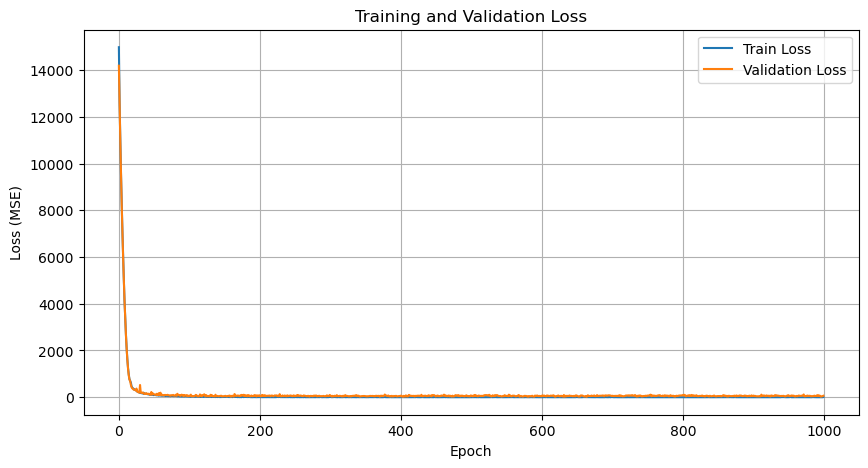

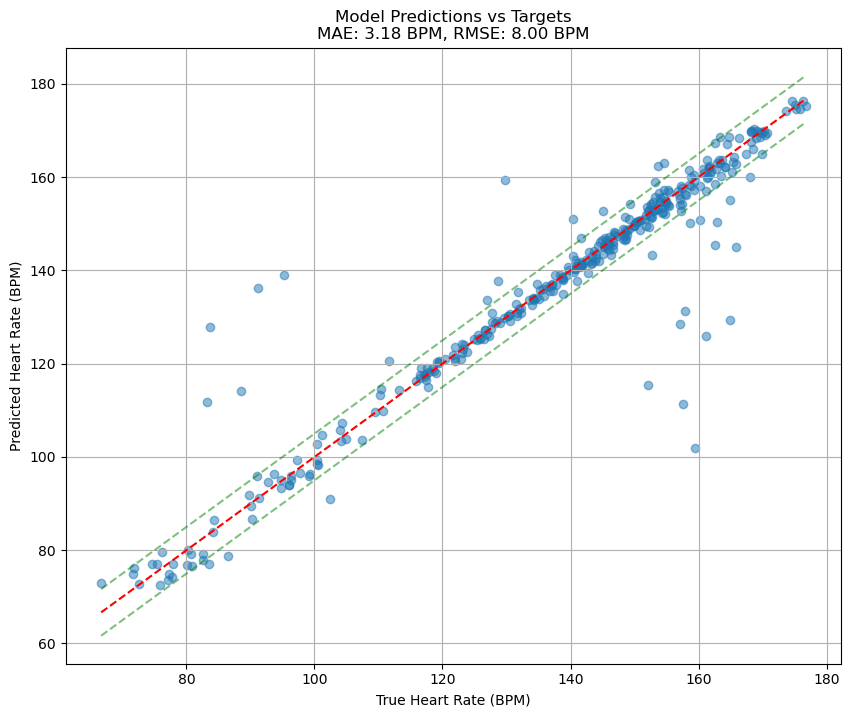

Mean Absolute Error: 3.18 BPM
Root Mean Square Error: 8.00 BPM
Predictions within ±3 BPM: 80.1%
Predictions within ±5 BPM: 89.9%


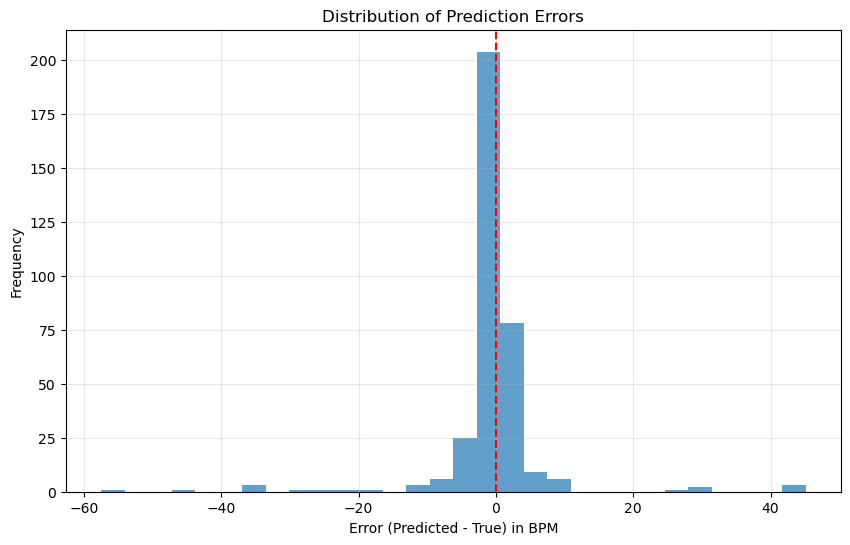


Visualizing activations for Example 1 (Target HR: 138.6 BPM)


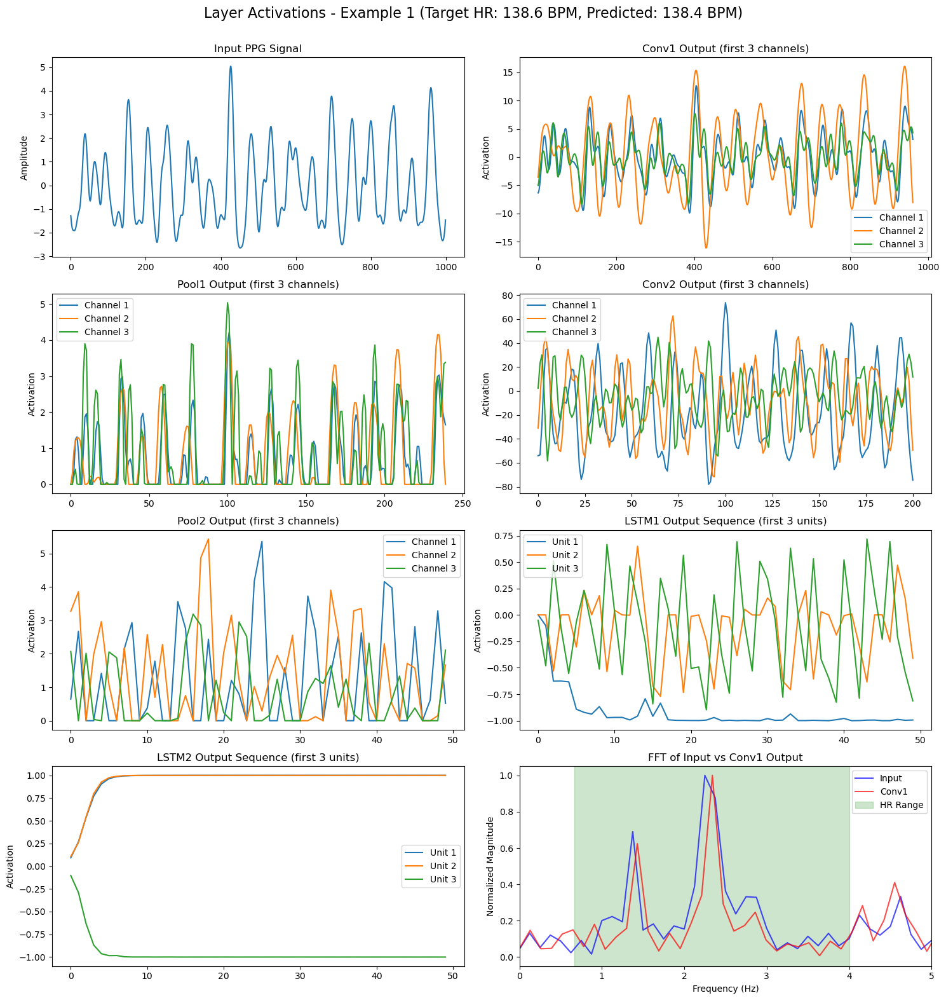


Visualizing activations for Example 2 (Target HR: 84.2 BPM)


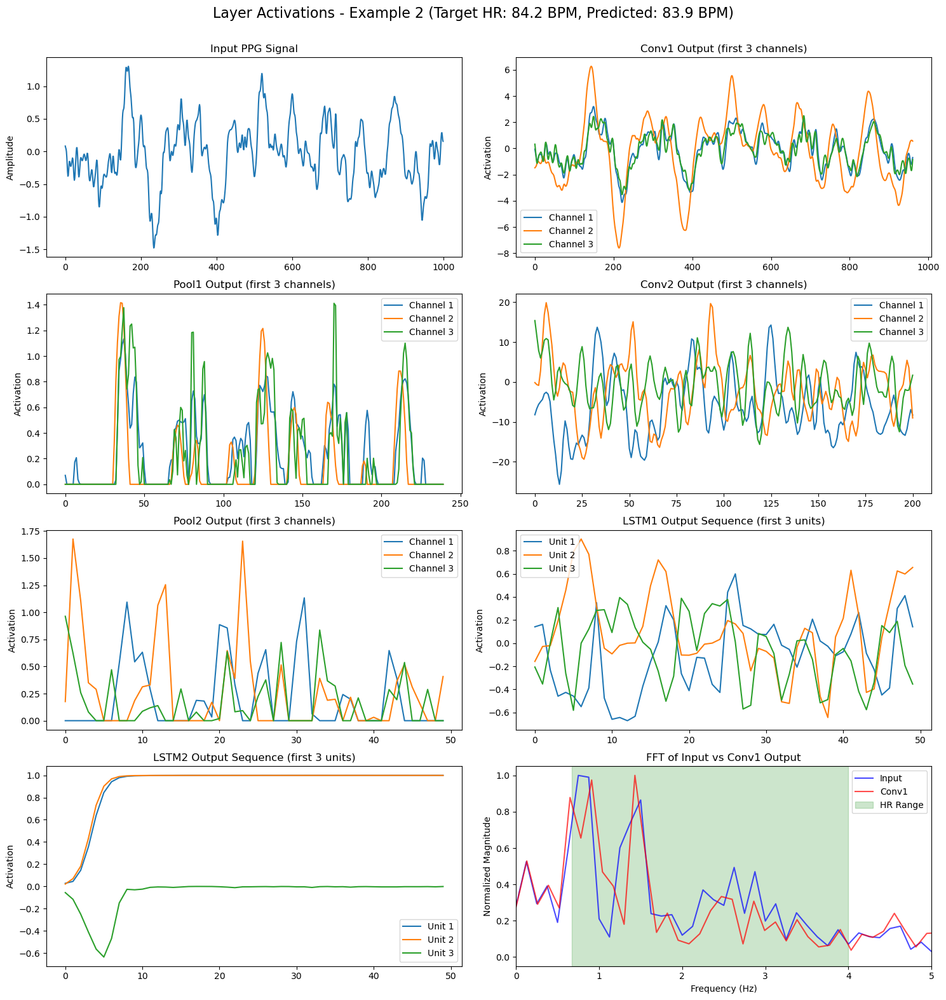


Visualizing activations for Example 3 (Target HR: 165.3 BPM)


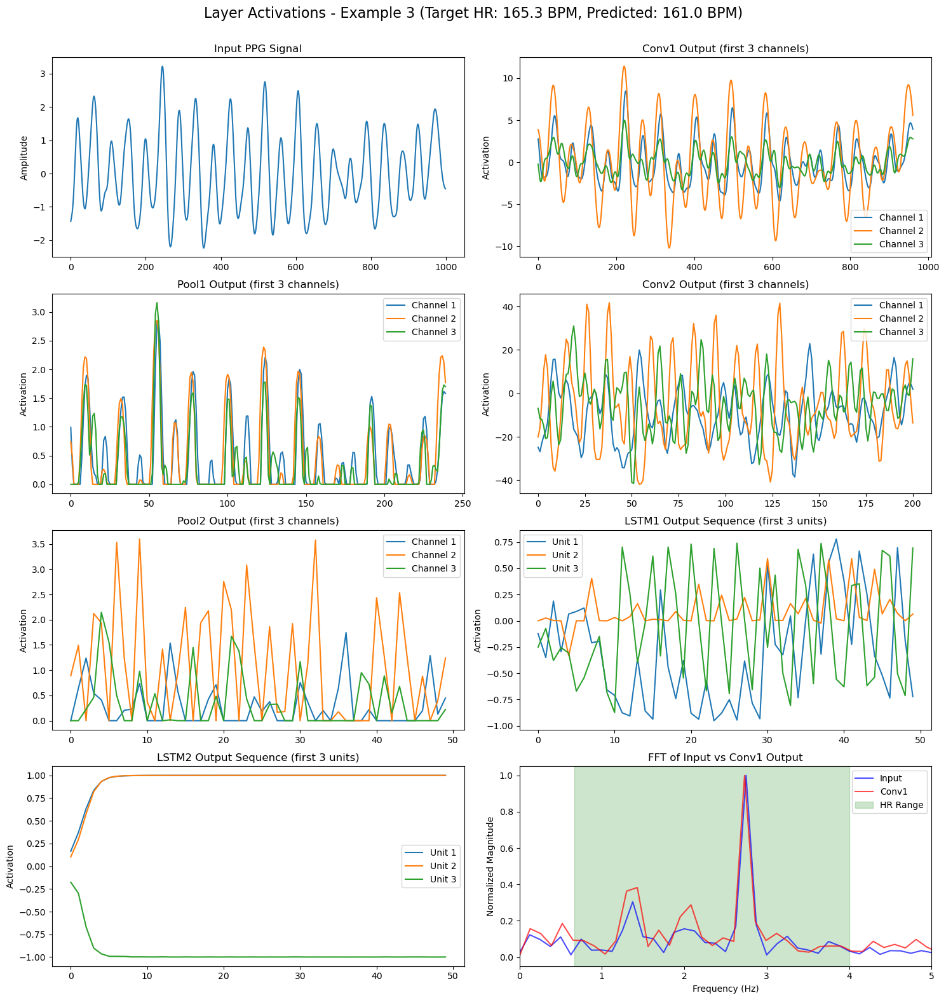

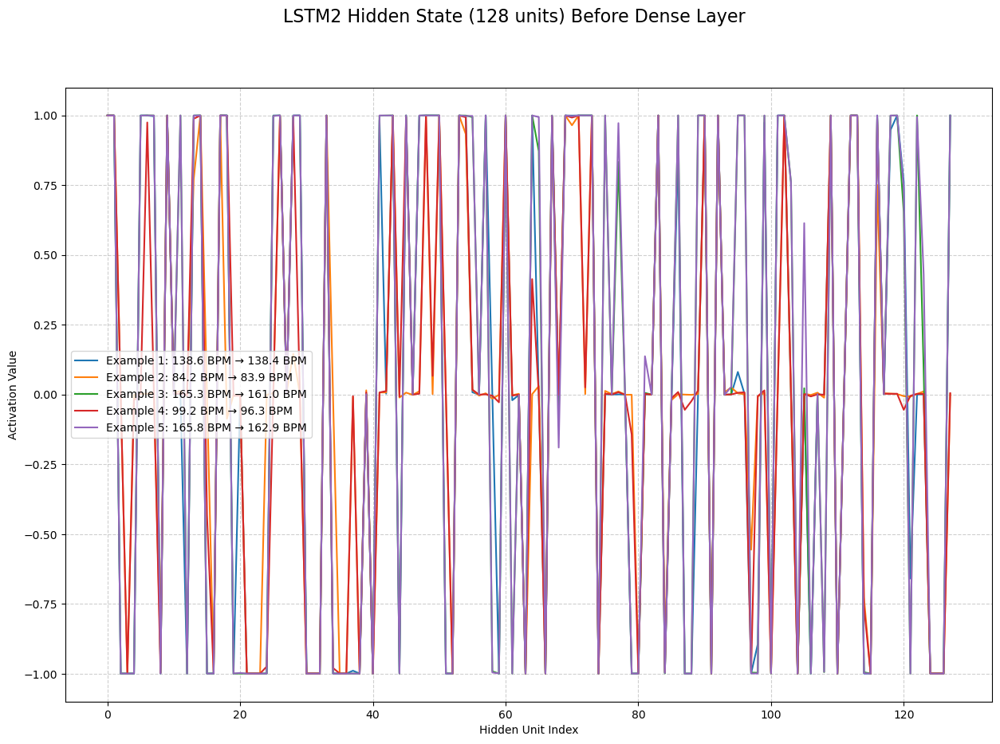

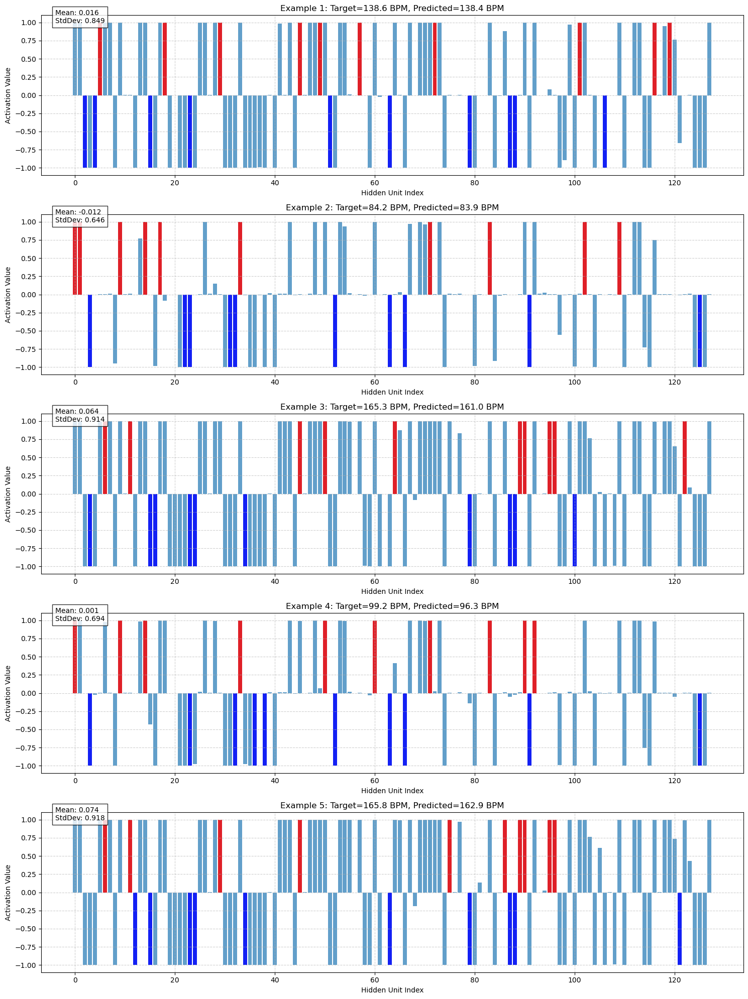

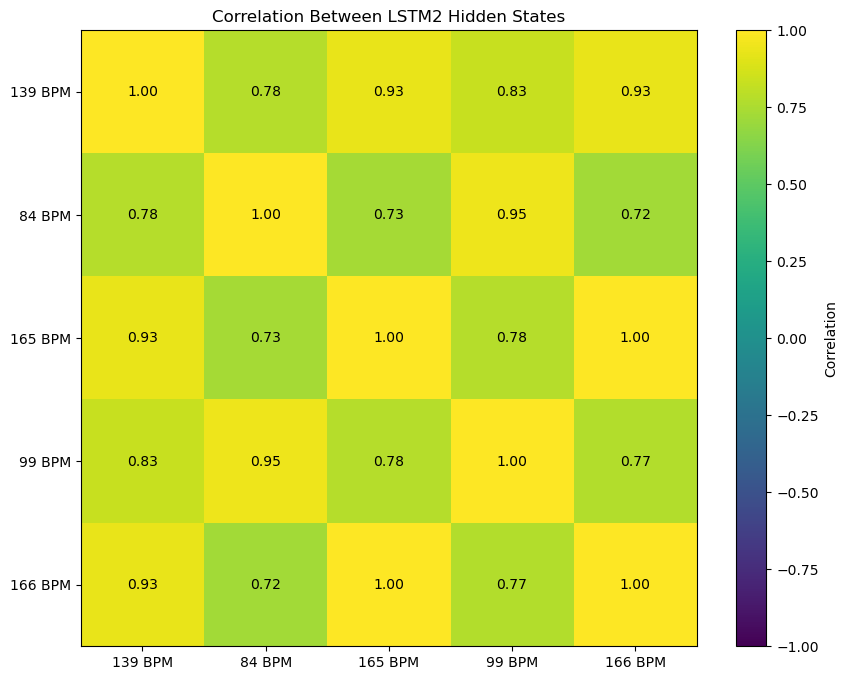

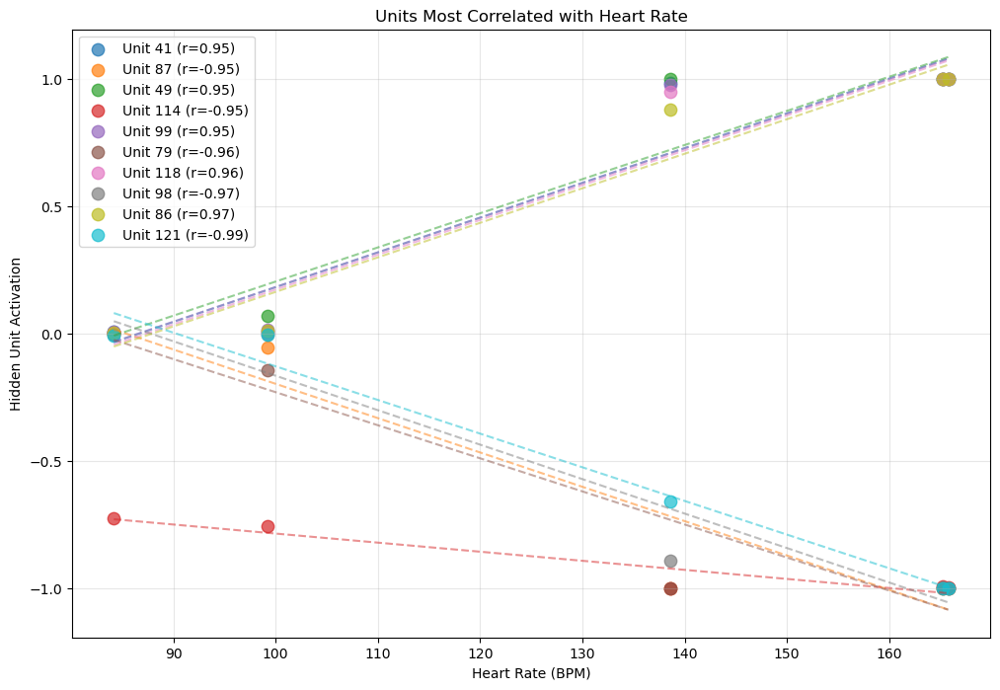

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from utils.data_utils import *
from utils.viz_utils import *

# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Training parameters
batch_size = 25
fs = 125
minBPM = 40
maxBPM = 240
window_length = 8 * fs
window_shift = 2 * fs  # Overlap = window_length - window_shift

# Retrieve dataset files
data_dir = "datasets/troika/training_data"
data_fls, ref_fls = LoadTroikaDataset(data_dir)
errs, confs = [], []

# Create the dataset
dataset = TroikaDataset(data_fls, ref_fls, window_length, window_shift, fs)

# Split the dataset into training and testing
train_size = 0.8
num_train = int(len(dataset) * train_size)
num_test = len(dataset) - num_train
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [num_train, num_test])

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Modified model with longer sequence support
class DebuggableMotionPPGNet(nn.Module):
    def __init__(self, n_timesteps, n_features, n_outputs):
        super(DebuggableMotionPPGNet, self).__init__()
        # Conv1D blocks
        self.conv1 = nn.Conv1d(in_channels=n_features, out_channels=32, kernel_size=40)
        self.bn1 = nn.BatchNorm1d(num_features=32)
        self.pool1 = nn.MaxPool1d(kernel_size=4)
        self.dropout1 = nn.Dropout(p=0.1)
        self.conv2 = nn.Conv1d(in_channels=32, out_channels=32, kernel_size=40)
        self.bn2 = nn.BatchNorm1d(num_features=32)
        self.pool2 = nn.MaxPool1d(kernel_size=4)
        self.dropout2 = nn.Dropout(p=0.1)
        
        # Calculate the sequence length after conv and pooling
        l1 = n_timesteps - 40 + 1  # Conv1 output length
        l2 = l1 // 4              # Pool1 output length
        l3 = l2 - 40 + 1          # Conv2 output length
        self.seq_len_after_conv = l3 // 4  # Pool2 output length
        print(f"Sequence length after convolutions: {self.seq_len_after_conv}")
        
        # LSTM layers
        self.lstm1 = nn.LSTM(input_size=32, hidden_size=128, batch_first=True)
        self.lstm2 = nn.LSTM(input_size=128, hidden_size=128, batch_first=True)
        
        # Final dense layer for output
        self.dense = nn.Linear(in_features=128, out_features=1)
        
        # Store activations
        self.activations = {}
        
        # Initialize weights using Xavier/Glorot (similar to TensorFlow default)
        self._initialize_weights()
    
    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv1d):
                nn.init.xavier_uniform_(m.weight)
                if m.bias is not None:
                    nn.init.zeros_(m.bias)
            elif isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                nn.init.zeros_(m.bias)
    
    # Modified hook function to properly handle different types of outputs
    def get_activation(self, name):
        def hook(model, input, output):
            # Handle LSTM outputs differently (they're tuples)
            if isinstance(output, tuple):
                # For LSTMs: output[0] is sequence, output[1] is (h_n, c_n)
                self.activations[name] = (
                    output[0].detach(),  # Output sequence
                    output[1][0].detach()  # Final hidden state (h_n)
                )
            else:
                # For other layers
                self.activations[name] = output.detach()
        return hook
    
    def register_hooks(self):
        self.conv1.register_forward_hook(self.get_activation('conv1'))
        self.bn1.register_forward_hook(self.get_activation('bn1'))
        self.pool1.register_forward_hook(self.get_activation('pool1'))
        self.conv2.register_forward_hook(self.get_activation('conv2'))
        self.bn2.register_forward_hook(self.get_activation('bn2'))
        self.pool2.register_forward_hook(self.get_activation('pool2'))
        self.lstm1.register_forward_hook(self.get_activation('lstm1'))
        self.lstm2.register_forward_hook(self.get_activation('lstm2'))
        self.dense.register_forward_hook(self.get_activation('dense'))
        
    def forward(self, x):
        # x shape: (batch_size, n_features, n_timesteps)
        
        # Convolutional layers
        x = self.conv1(x)
        x = torch.relu(self.bn1(x))
        x = self.pool1(x)
        x = self.dropout1(x)
        
        x = self.conv2(x)
        x = torch.relu(self.bn2(x))
        x = self.pool2(x)
        x = self.dropout2(x)
        
        # Reshape for LSTM: (batch_size, seq_len, features)
        x = x.permute(0, 2, 1)
        
        # LSTM layers
        x, (h1, c1) = self.lstm1(x)
        x, (h2, c2) = self.lstm2(x)
        
        # Use the final hidden state
        x = h2.squeeze(0)
        
        # Final dense layer
        x = self.dense(x)
        
        return x.squeeze(-1)  # Remove last dim if it's 1

# Training function
def train_model(model, train_loader, test_loader, criterion, optimizer, 
                epochs=100, device='cpu', monitor_every=10):
    """Train the model and monitor performance."""
    train_losses = []
    val_losses = []
    
    for epoch in range(epochs):
        # Training phase
        model.train()
        epoch_loss = 0
        all_outputs = []
        all_targets = []
        
        for ppg, acc, targets in train_loader:
            inputs, targets = ppg.to(device), targets.to(device)
            
            # Forward pass
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            
            # Store outputs and targets for analysis
            all_outputs.extend(outputs.detach().cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
            
            # Backward pass
            loss.backward()
            
            # Clip gradients to prevent explosion
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            
            optimizer.step()
            epoch_loss += loss.item()
        
        avg_train_loss = epoch_loss / len(train_loader)
        train_losses.append(avg_train_loss)
        
        # Validation phase
        model.eval()
        val_loss = 0
        val_mae = 0
        num_val_samples = 0
        
        with torch.no_grad():
            for ppg, acc, targets in test_loader:
                inputs, targets = ppg.to(device), targets.to(device)
                outputs = model(inputs)
                
                # Calculate loss
                loss = criterion(outputs, targets)
                val_loss += loss.item()
                
                # Calculate MAE
                mae = torch.abs(outputs - targets).sum().item()
                val_mae += mae
                num_val_samples += targets.size(0)
        
        avg_val_loss = val_loss / len(test_loader)
        avg_val_mae = val_mae / num_val_samples
        val_losses.append(avg_val_loss)
        
        # Print epoch results
        if epoch % monitor_every == 0 or epoch == epochs - 1:
            print(f"Epoch {epoch}/{epochs}:")
            print(f"  Train Loss: {avg_train_loss:.4f}")
            print(f"  Val Loss: {avg_val_loss:.4f}")
            print(f"  Val MAE: {avg_val_mae:.2f} BPM")
            
            # Print some sample predictions
            if epoch % (monitor_every * 5) == 0 or epoch == epochs - 1:
                all_outputs = np.array(all_outputs)
                all_targets = np.array(all_targets)
                
                # Calculate stats on outputs
                mean_output = np.mean(all_outputs)
                std_output = np.std(all_outputs)
                min_output = np.min(all_outputs)
                max_output = np.max(all_outputs)
                
                print("  Training Batch Statistics:")
                print(f"    Mean Output: {mean_output:.2f} BPM")
                print(f"    StdDev Output: {std_output:.2f} BPM")
                print(f"    Range: [{min_output:.2f}, {max_output:.2f}] BPM")
    
    # Plot loss curves
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss (MSE)')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return train_losses, val_losses

# Function to evaluate the model and visualize predictions
def evaluate_model(model, test_loader, device):
    """Evaluate the model on the test set and visualize predictions."""
    model.eval()
    
    all_preds = []
    all_targets = []
    
    with torch.no_grad():
        for ppg, acc, targets in test_loader:
            inputs, targets = ppg.to(device), targets.to(device)
            outputs = model(inputs)
            
            all_preds.extend(outputs.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
    
    # Convert to numpy arrays
    all_preds = np.array(all_preds)
    all_targets = np.array(all_targets)
    
    # Calculate metrics
    mae = np.mean(np.abs(all_preds - all_targets))
    rmse = np.sqrt(np.mean((all_preds - all_targets) ** 2))
    
    # Plot predictions vs targets
    plt.figure(figsize=(10, 8))
    plt.scatter(all_targets, all_preds, alpha=0.5)
    
    # Plot perfect prediction line
    min_val = min(np.min(all_targets), np.min(all_preds))
    max_val = max(np.max(all_targets), np.max(all_preds))
    plt.plot([min_val, max_val], [min_val, max_val], 'r--')
    
    # Plot ±5 BPM error bands
    plt.plot([min_val, max_val], [min_val + 5, max_val + 5], 'g--', alpha=0.5)
    plt.plot([min_val, max_val], [min_val - 5, max_val - 5], 'g--', alpha=0.5)
    
    plt.xlabel('True Heart Rate (BPM)')
    plt.ylabel('Predicted Heart Rate (BPM)')
    plt.title(f'Model Predictions vs Targets\nMAE: {mae:.2f} BPM, RMSE: {rmse:.2f} BPM')
    plt.grid(True)
    plt.show()
    
    # Calculate percentage within error bounds
    within_3bpm = np.mean(np.abs(all_preds - all_targets) <= 3.0) * 100
    within_5bpm = np.mean(np.abs(all_preds - all_targets) <= 5.0) * 100
    
    print(f"Mean Absolute Error: {mae:.2f} BPM")
    print(f"Root Mean Square Error: {rmse:.2f} BPM")
    print(f"Predictions within ±3 BPM: {within_3bpm:.1f}%")
    print(f"Predictions within ±5 BPM: {within_5bpm:.1f}%")
    
    # Distribution of errors
    errors = all_preds - all_targets
    plt.figure(figsize=(10, 6))
    plt.hist(errors, bins=30, alpha=0.7)
    plt.axvline(x=0, color='r', linestyle='--')
    plt.title(f'Distribution of Prediction Errors')
    plt.xlabel('Error (Predicted - True) in BPM')
    plt.ylabel('Frequency')
    plt.grid(True, alpha=0.3)
    plt.show()
    
    return mae, rmse, all_preds, all_targets

# Function to visualize layer activations for signal examples
def visualize_layer_activations(model, test_loader, device, num_examples=3):
    """Visualize activations at each layer for a few example signals."""
    model.eval()
    
    # Get a batch of examples
    example_batch = next(iter(test_loader))
    ppg, acc, targets = example_batch
    
    # Limit to the requested number of examples
    ppg = ppg[:num_examples]
    targets = targets[:num_examples]
    
    for i in range(len(ppg)):
        print(f"\nVisualizing activations for Example {i+1} (Target HR: {targets[i]:.1f} BPM)")
        
        # Forward pass for a single example
        input_tensor = ppg[i:i+1].to(device)
        target = targets[i:i+1].to(device)
        
        with torch.no_grad():
            output = model(input_tensor)
        
        # Create plots for each layer
        fig, axs = plt.subplots(4, 2, figsize=(15, 16))
        fig.suptitle(f'Layer Activations - Example {i+1} (Target HR: {targets[i]:.1f} BPM, Predicted: {output.item():.1f} BPM)', fontsize=16)
        
        # Plot input signal
        axs[0, 0].set_title('Input PPG Signal')
        axs[0, 0].plot(input_tensor[0, 0, :].cpu().numpy())
        axs[0, 0].set_ylabel('Amplitude')
        
        # Plot conv1 activations (first few channels)
        axs[0, 1].set_title('Conv1 Output (first 3 channels)')
        for j in range(min(3, model.activations['conv1'].shape[1])):
            axs[0, 1].plot(model.activations['conv1'][0, j, :].cpu().numpy(), label=f'Channel {j+1}')
        axs[0, 1].legend()
        axs[0, 1].set_ylabel('Activation')
        
        # Plot pool1 output
        axs[1, 0].set_title('Pool1 Output (first 3 channels)')
        for j in range(min(3, model.activations['pool1'].shape[1])):
            axs[1, 0].plot(model.activations['pool1'][0, j, :].cpu().numpy(), label=f'Channel {j+1}')
        axs[1, 0].legend()
        axs[1, 0].set_ylabel('Activation')
        
        # Plot conv2 activations
        axs[1, 1].set_title('Conv2 Output (first 3 channels)')
        for j in range(min(3, model.activations['conv2'].shape[1])):
            axs[1, 1].plot(model.activations['conv2'][0, j, :].cpu().numpy(), label=f'Channel {j+1}')
        axs[1, 1].legend()
        axs[1, 1].set_ylabel('Activation')
        
        # Plot pool2 output
        axs[2, 0].set_title('Pool2 Output (first 3 channels)')
        for j in range(min(3, model.activations['pool2'].shape[1])):
            axs[2, 0].plot(model.activations['pool2'][0, j, :].cpu().numpy(), label=f'Channel {j+1}')
        axs[2, 0].legend()
        axs[2, 0].set_ylabel('Activation')
        
        # Plot LSTM1 output 
        axs[2, 1].set_title('LSTM1 Output Sequence (first 3 units)')
        lstm1_out = model.activations['lstm1'][0]  # First element is output sequence
        for j in range(min(3, lstm1_out.shape[2])):
            axs[2, 1].plot(lstm1_out[0, :, j].cpu().numpy(), label=f'Unit {j+1}')
        axs[2, 1].legend()
        axs[2, 1].set_ylabel('Activation')
        
        # Plot LSTM2 output sequence
        axs[3, 0].set_title('LSTM2 Output Sequence (first 3 units)')
        lstm2_out = model.activations['lstm2'][0]  # First element is output sequence
        for j in range(min(3, lstm2_out.shape[2])):
            axs[3, 0].plot(lstm2_out[0, :, j].cpu().numpy(), label=f'Unit {j+1}')
        axs[3, 0].legend()
        axs[3, 0].set_ylabel('Activation')
        
        # Plot frequency spectrum of input vs conv1
        axs[3, 1].set_title('FFT of Input vs Conv1 Output')
        
        # FFT of input
        input_signal = input_tensor[0, 0, :].cpu().numpy()
        n = len(input_signal)
        input_fft = np.abs(np.fft.fft(input_signal))[:n//2]
        input_freq = np.fft.fftfreq(n, 1/fs)[:n//2]
        axs[3, 1].plot(input_freq, input_fft/np.max(input_fft), 'b-', alpha=0.7, label='Input')
        
        # FFT of first conv1 channel
        conv1_signal = model.activations['conv1'][0, 0, :].cpu().numpy()
        n_conv = len(conv1_signal)
        conv1_fft = np.abs(np.fft.fft(conv1_signal))[:n_conv//2]
        conv1_freq = np.fft.fftfreq(n_conv, 1/fs)[:n_conv//2]
        axs[3, 1].plot(conv1_freq, conv1_fft/np.max(conv1_fft), 'r-', alpha=0.7, label='Conv1')
        
        # Mark typical heart rate frequency range (0.67-4 Hz = 40-240 BPM)
        axs[3, 1].axvspan(0.67, 4, alpha=0.2, color='g', label='HR Range')
        
        axs[3, 1].set_xlabel('Frequency (Hz)')
        axs[3, 1].set_ylabel('Normalized Magnitude')
        axs[3, 1].set_xlim(0, 5)
        axs[3, 1].legend()
        
        plt.tight_layout()
        plt.subplots_adjust(top=0.93)
        plt.show()
    
    model.train()

# New function to visualize the LSTM2 hidden state
def visualize_lstm2_hidden_state(model, test_loader, device, num_examples=5):
    """Visualize the final LSTM2 hidden state before the dense layer."""
    model.eval()
    
    # Get a batch of examples
    for batch_idx, (ppg, acc, targets) in enumerate(test_loader):
        # Use only the requested number of examples
        if batch_idx > 0:
            break
        
        ppg = ppg[:num_examples].to(device)
        targets = targets[:num_examples].to(device)
        
        # Forward pass to get hidden states
        hidden_states = []
        outputs = []
        
        for i in range(len(ppg)):
            input_tensor = ppg[i:i+1]
            with torch.no_grad():
                output = model(input_tensor)
                # Get the hidden state from activations
                hidden_state = model.activations['lstm2'][1]  # Second element is the hidden state
                hidden_states.append(hidden_state.cpu().numpy())
                outputs.append(output.item())
        
        # Plot hidden states for each example
        plt.figure(figsize=(15, 10))
        plt.suptitle('LSTM2 Hidden State (128 units) Before Dense Layer', fontsize=16)
        
        # Plot all hidden states together for comparison
        for i in range(len(hidden_states)):
            plt.plot(hidden_states[i].flatten(), 
                     label=f'Example {i+1}: {targets[i].item():.1f} BPM → {outputs[i]:.1f} BPM')
        
        plt.xlabel('Hidden Unit Index')
        plt.ylabel('Activation Value')
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.6)
        plt.show()
        
        # More detailed visualization of each example
        fig, axes = plt.subplots(num_examples, 1, figsize=(15, 4*num_examples))
        
        for i in range(len(hidden_states)):
            # Get the hidden state (shape: [128])
            hidden = hidden_states[i].flatten()
            
            # Sort units by activation strength
            sorted_indices = np.argsort(hidden)
            strongest_positive = sorted_indices[-10:]  # Top 10 positive activations
            strongest_negative = sorted_indices[:10]   # Top 10 negative activations
            
            # Plot the full hidden state
            axes[i].bar(range(len(hidden)), hidden, alpha=0.7)
            
            # Highlight the strongest positive units
            for unit in strongest_positive:
                axes[i].bar(unit, hidden[unit], color='red', alpha=0.8)
            
            # Highlight the strongest negative units
            for unit in strongest_negative:
                axes[i].bar(unit, hidden[unit], color='blue', alpha=0.8)
            
            axes[i].set_title(f'Example {i+1}: Target={targets[i].item():.1f} BPM, Predicted={outputs[i]:.1f} BPM')
            axes[i].set_xlabel('Hidden Unit Index')
            axes[i].set_ylabel('Activation Value')
            axes[i].grid(True, linestyle='--', alpha=0.6)
            
            # Add summary statistics
            mean_val = np.mean(hidden)
            std_val = np.std(hidden)
            axes[i].text(0.02, 0.95, f'Mean: {mean_val:.3f}\nStdDev: {std_val:.3f}', 
                         transform=axes[i].transAxes, 
                         bbox=dict(facecolor='white', alpha=0.8))
        
        plt.tight_layout()
        plt.show()
        
        # Analyze correlations between hidden states
        if len(hidden_states) > 1:
            correlation_matrix = np.zeros((len(hidden_states), len(hidden_states)))
            
            for i in range(len(hidden_states)):
                for j in range(len(hidden_states)):
                    # Calculate correlation between hidden states
                    correlation = np.corrcoef(hidden_states[i].flatten(), hidden_states[j].flatten())[0, 1]
                    correlation_matrix[i, j] = correlation
            
            plt.figure(figsize=(10, 8))
            plt.imshow(correlation_matrix, cmap='viridis', vmin=-1, vmax=1)
            plt.colorbar(label='Correlation')
            plt.title('Correlation Between LSTM2 Hidden States')
            
            # Create tick labels with heart rates
            tick_labels = [f'{targets[i].item():.0f} BPM' for i in range(len(hidden_states))]
            plt.xticks(range(len(hidden_states)), tick_labels)
            plt.yticks(range(len(hidden_states)), tick_labels)
            
            # Add correlation values as text
            for i in range(len(hidden_states)):
                for j in range(len(hidden_states)):
                    plt.text(j, i, f'{correlation_matrix[i, j]:.2f}', 
                           ha='center', va='center', 
                           color='white' if correlation_matrix[i, j] < 0.7 else 'black')
            
            plt.show()
        
        # Analyze relationship between heart rate and unit activations
        if len(hidden_states) > 2:
            hidden_array = np.vstack([h.flatten() for h in hidden_states])
            target_array = np.array([t.item() for t in targets])
            
            # Find units with strongest correlation to heart rate
            correlations = np.zeros(hidden_array.shape[1])
            
            for unit_idx in range(hidden_array.shape[1]):
                unit_values = hidden_array[:, unit_idx]
                corr = np.corrcoef(unit_values, target_array)[0, 1]
                correlations[unit_idx] = corr
            
            # Get indices of most correlated (positive and negative) units
            sorted_corr_idx = np.argsort(np.abs(correlations))
            top_correlated = sorted_corr_idx[-10:]
            
            # Plot these units vs heart rate
            plt.figure(figsize=(12, 8))
            plt.title('Units Most Correlated with Heart Rate')
            
            for unit_idx in top_correlated:
                unit_values = hidden_array[:, unit_idx]
                corr = correlations[unit_idx]
                plt.scatter(target_array, unit_values, 
                          label=f'Unit {unit_idx} (r={corr:.2f})', 
                          alpha=0.7, s=80)
                
                # Add trendline
                z = np.polyfit(target_array, unit_values, 1)
                p = np.poly1d(z)
                plt.plot(np.sort(target_array), p(np.sort(target_array)), 
                       linestyle='--', alpha=0.5)
            
            plt.xlabel('Heart Rate (BPM)')
            plt.ylabel('Hidden Unit Activation')
            plt.legend()
            plt.grid(True, alpha=0.3)
            plt.show()
    
    model.train()

# Initialize and train model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Initialize model with the shape of your PPG signals
sample_ppg, sample_acc, _ = next(iter(train_loader))
n_timesteps = sample_ppg.shape[2]
n_features = sample_ppg.shape[1]

model = DebuggableMotionPPGNet(n_timesteps, n_features, 1)
model.to(device)
model.register_hooks()

# Print model structure
print(model)

# Training parameters
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)

# Train the model
train_losses, val_losses = train_model(
    model, train_loader, test_loader, criterion, optimizer, 
    epochs=1000, device=device, monitor_every=5
)

# Evaluate on test set
mae, rmse, all_preds, all_targets = evaluate_model(model, test_loader, device)

# Visualize layer activations
visualize_layer_activations(model, test_loader, device, num_examples=3)

# Visualize LSTM2 hidden states
visualize_lstm2_hidden_state(model, test_loader, device, num_examples=5)

In [4]:
sample_ppg, sample_acc, _ = next(iter(train_loader))
n_timesteps = sample_ppg.shape[2]
n_features = sample_ppg.shape[1]
print(sample_ppg.shape)

torch.Size([25, 1, 1000])


In [5]:
"""Print a simple text representation of PyTorch model structure"""
print("=" * 60)
print("PYTORCH MODEL STRUCTURE")
print("=" * 60)
print(model)

# Print parameter count
total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"\nTotal trainable parameters: {total_params:,}")
print("=" * 60)

PYTORCH MODEL STRUCTURE
DebuggableMotionPPGNet(
  (conv1): Conv1d(1, 32, kernel_size=(40,), stride=(1,))
  (bn1): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool1): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (dropout1): Dropout(p=0.1, inplace=False)
  (conv2): Conv1d(32, 32, kernel_size=(40,), stride=(1,))
  (bn2): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool2): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (dropout2): Dropout(p=0.1, inplace=False)
  (lstm1): LSTM(32, 128, batch_first=True)
  (lstm2): LSTM(128, 128, batch_first=True)
  (dense): Linear(in_features=128, out_features=1, bias=True)
)

Total trainable parameters: 257,601


In [3]:
import torch
import torch.nn as nn
from collections import OrderedDict
import numpy as np

def analyze_transformer_decoder(model_path):
    """
    Comprehensive analysis of a transformer decoder model checkpoint
    """
    print("="*60)
    print("TRANSFORMER DECODER MODEL ANALYSIS")
    print("="*60)
    
    # Load the checkpoint
    try:
        checkpoint = torch.load(model_path, map_location='cpu')
        print(f"✓ Successfully loaded checkpoint from: {model_path}")
    except Exception as e:
        print(f"✗ Error loading checkpoint: {e}")
        return
    
    # Determine checkpoint structure
    if isinstance(checkpoint, dict):
        if 'model' in checkpoint:
            state_dict = checkpoint['model']
            extra_info = {k: v for k, v in checkpoint.items() if k != 'model'}
        elif 'state_dict' in checkpoint:
            state_dict = checkpoint['state_dict']
            extra_info = {k: v for k, v in checkpoint.items() if k != 'state_dict'}
        else:
            state_dict = checkpoint
            extra_info = {}
    else:
        # Assume it's directly a model
        if hasattr(checkpoint, 'state_dict'):
            state_dict = checkpoint.state_dict()
        else:
            state_dict = checkpoint
        extra_info = {}
    
    print(f"\nCheckpoint keys: {list(checkpoint.keys()) if isinstance(checkpoint, dict) else 'Direct model'}")
    
    # Print extra information
    if extra_info:
        print(f"\nExtra checkpoint information:")
        for key, value in extra_info.items():
            if isinstance(value, (int, float, str)):
                print(f"  {key}: {value}")
            else:
                print(f"  {key}: {type(value)} (shape: {getattr(value, 'shape', 'N/A')})")
    
    print("\n" + "="*60)
    print("MODEL ARCHITECTURE ANALYSIS")
    print("="*60)
    
    # Analyze model structure
    layer_info = analyze_layers(state_dict)
    
    # Print detailed layer information
    print_layer_details(layer_info)
    
    # Calculate memory and parameter statistics
    calculate_model_stats(state_dict)
    
    # Analyze transformer-specific patterns
    analyze_transformer_patterns(state_dict)
    
    return state_dict, layer_info

def analyze_layers(state_dict):
    """Analyze layer structure and group related parameters"""
    layer_info = OrderedDict()
    total_params = 0
    
    for name, param in state_dict.items():
        # Extract layer hierarchy
        parts = name.split('.')
        layer_type = identify_layer_type(name, param)
        
        layer_info[name] = {
            'shape': tuple(param.shape),
            'numel': param.numel(),
            'dtype': param.dtype,
            'layer_type': layer_type,
            'hierarchy': parts,
            'memory_mb': param.numel() * param.element_size() / (1024**2)
        }
        total_params += param.numel()
    
    return layer_info

def identify_layer_type(name, param):
    """Identify the type of layer based on parameter name and shape"""
    name_lower = name.lower()
    shape = param.shape
    
    # Transformer decoder specific patterns
    if 'embed' in name_lower and len(shape) == 2:
        return 'Embedding'
    elif 'pos' in name_lower and 'embed' in name_lower:
        return 'Positional Embedding'
    elif 'self_attn' in name_lower or 'attn' in name_lower:
        if 'q_proj' in name_lower or 'query' in name_lower:
            return 'Self-Attention Query'
        elif 'k_proj' in name_lower or 'key' in name_lower:
            return 'Self-Attention Key'
        elif 'v_proj' in name_lower or 'value' in name_lower:
            return 'Self-Attention Value'
        elif 'out_proj' in name_lower or 'o_proj' in name_lower:
            return 'Self-Attention Output'
        else:
            return 'Self-Attention'
    elif 'cross_attn' in name_lower:
        return 'Cross-Attention'
    elif 'mlp' in name_lower or 'ffn' in name_lower or 'feed_forward' in name_lower:
        if 'gate' in name_lower:
            return 'MLP Gate'
        elif 'up' in name_lower or '1' in name_lower:
            return 'MLP Up Projection'
        elif 'down' in name_lower or '2' in name_lower:
            return 'MLP Down Projection'
        else:
            return 'MLP'
    elif 'norm' in name_lower or 'ln' in name_lower:
        return 'Layer Norm'
    elif 'bias' in name_lower:
        return 'Bias'
    elif len(shape) == 2 and shape[0] > shape[1]:
        return 'Linear (Down)'
    elif len(shape) == 2 and shape[1] > shape[0]:
        return 'Linear (Up)'
    elif len(shape) == 1:
        return 'Bias/Norm'
    else:
        return 'Unknown'

def print_layer_details(layer_info):
    """Print detailed information about each layer"""
    print(f"\n{'Layer Name':<40} {'Shape':<20} {'Type':<20} {'Params':<12} {'Memory(MB)':<10}")
    print("-" * 110)
    
    for name, info in layer_info.items():
        shape_str = f"{info['shape']}"
        if len(shape_str) > 18:
            shape_str = shape_str[:15] + "..."
        
        print(f"{name:<40} {shape_str:<20} {info['layer_type']:<20} "
              f"{info['numel']:>10,} {info['memory_mb']:>8.2f}")

def calculate_model_stats(state_dict):
    """Calculate and print model statistics"""
    total_params = sum(p.numel() for p in state_dict.values())
    total_memory = sum(p.numel() * p.element_size() for p in state_dict.values()) / (1024**2)
    
    # Group by layer type
    type_stats = {}
    for name, param in state_dict.items():
        layer_type = identify_layer_type(name, param)
        if layer_type not in type_stats:
            type_stats[layer_type] = {'params': 0, 'memory': 0, 'count': 0}
        
        type_stats[layer_type]['params'] += param.numel()
        type_stats[layer_type]['memory'] += param.numel() * param.element_size() / (1024**2)
        type_stats[layer_type]['count'] += 1
    
    print(f"\n{'='*60}")
    print("MODEL STATISTICS")
    print(f"{'='*60}")
    print(f"Total Parameters: {total_params:,}")
    print(f"Total Memory: {total_memory:.2f} MB")
    print(f"Total Layers: {len(state_dict)}")
    
    print(f"\nParameter Distribution by Layer Type:")
    print(f"{'Type':<20} {'Count':<8} {'Parameters':<15} {'Memory(MB)':<12} {'%':<8}")
    print("-" * 70)
    
    for layer_type, stats in sorted(type_stats.items(), key=lambda x: x[1]['params'], reverse=True):
        percent = (stats['params'] / total_params) * 100
        print(f"{layer_type:<20} {stats['count']:<8} {stats['params']:>12,} "
              f"{stats['memory']:>10.2f} {percent:>6.1f}%")

def analyze_transformer_patterns(state_dict):
    """Analyze transformer-specific architectural patterns"""
    print(f"\n{'='*60}")
    print("TRANSFORMER ARCHITECTURE ANALYSIS")
    print(f"{'='*60}")
    
    # Detect number of layers
    layer_nums = set()
    for name in state_dict.keys():
        parts = name.split('.')
        for part in parts:
            if part.isdigit():
                layer_nums.add(int(part))
    
    if layer_nums:
        num_layers = max(layer_nums) + 1
        print(f"Detected Transformer Layers: {num_layers}")
    
    # Detect model dimensions
    embedding_layers = [name for name in state_dict.keys() 
                       if 'embed' in name.lower() and len(state_dict[name].shape) == 2]
    
    if embedding_layers:
        embed_name = embedding_layers[0]
        vocab_size, d_model = state_dict[embed_name].shape
        print(f"Vocabulary Size: {vocab_size:,}")
        print(f"Model Dimension (d_model): {d_model}")
    
    # Detect attention heads
    attn_layers = [name for name in state_dict.keys() 
                  if any(x in name.lower() for x in ['q_proj', 'query', 'self_attn'])]
    
    if attn_layers and d_model:
        attn_name = attn_layers[0]
        attn_dim = state_dict[attn_name].shape[0]
        if attn_dim == d_model:
            print(f"Attention Heads: {attn_dim // 64} (assuming 64-dim heads)")
        else:
            print(f"Attention Output Dimension: {attn_dim}")
    
    # Detect MLP dimensions
    mlp_layers = [name for name in state_dict.keys() 
                 if any(x in name.lower() for x in ['mlp', 'ffn', 'feed_forward']) 
                 and 'up' in name.lower() or '1' in name.lower()]
    
    if mlp_layers and d_model:
        mlp_name = mlp_layers[0]
        mlp_dim = state_dict[mlp_name].shape[0]
        expansion_ratio = mlp_dim / d_model
        print(f"MLP Hidden Dimension: {mlp_dim}")
        print(f"MLP Expansion Ratio: {expansion_ratio:.1f}x")

def compare_models(model_paths):
    """Compare multiple model architectures"""
    print("="*80)
    print("MODEL COMPARISON")
    print("="*80)
    
    results = {}
    for path in model_paths:
        print(f"\nAnalyzing: {path}")
        state_dict, layer_info = analyze_transformer_decoder(path)
        
        total_params = sum(info['numel'] for info in layer_info.values())
        total_memory = sum(info['memory_mb'] for info in layer_info.values())
        
        results[path] = {
            'total_params': total_params,
            'total_memory': total_memory,
            'num_layers': len(layer_info)
        }
    
    # Print comparison table
    print(f"\n{'Model':<30} {'Parameters':<15} {'Memory(MB)':<12} {'Layers':<8}")
    print("-" * 70)
    for path, stats in results.items():
        model_name = path.split('/')[-1][:25]
        print(f"{model_name:<30} {stats['total_params']:>12,} "
              f"{stats['total_memory']:>10.2f} {stats['num_layers']:>6}")

# Example usage
if __name__ == "__main__":
    # Replace with your model path
    model_path = "PPGPT_500k_iters.pth"
    
    # Single model analysis
    state_dict, layer_info = analyze_transformer_decoder(model_path)
    
    # For comparing multiple models
    # model_paths = ["model1.pth", "model2.pth", "model3.pth"]
    # compare_models(model_paths)

TRANSFORMER DECODER MODEL ANALYSIS
✓ Successfully loaded checkpoint from: PPGPT_500k_iters.pth

Checkpoint keys: ['token_embedding_table.weight', 'position_embedding_table.weight', 'blocks.0.sa.heads.0.tril', 'blocks.0.sa.heads.0.key.weight', 'blocks.0.sa.heads.0.query.weight', 'blocks.0.sa.heads.0.value.weight', 'blocks.0.sa.heads.1.tril', 'blocks.0.sa.heads.1.key.weight', 'blocks.0.sa.heads.1.query.weight', 'blocks.0.sa.heads.1.value.weight', 'blocks.0.sa.heads.2.tril', 'blocks.0.sa.heads.2.key.weight', 'blocks.0.sa.heads.2.query.weight', 'blocks.0.sa.heads.2.value.weight', 'blocks.0.sa.heads.3.tril', 'blocks.0.sa.heads.3.key.weight', 'blocks.0.sa.heads.3.query.weight', 'blocks.0.sa.heads.3.value.weight', 'blocks.0.sa.heads.4.tril', 'blocks.0.sa.heads.4.key.weight', 'blocks.0.sa.heads.4.query.weight', 'blocks.0.sa.heads.4.value.weight', 'blocks.0.sa.heads.5.tril', 'blocks.0.sa.heads.5.key.weight', 'blocks.0.sa.heads.5.query.weight', 'blocks.0.sa.heads.5.value.weight', 'blocks.0.sa.he